In [1]:
import contextily as ctx
import datetime
import geopandas as gpd
import libpysal
import numpy as np
import os
import pandas as pd
import plotly.express as px
import pysal.lib
import seaborn as sns
import time
from matplotlib import pyplot as plt
from shapely.geometry import Point, Polygon
from shapely.ops import unary_union

Define usable column and filter the data for each years' shape file (AL_D010 - GIS건물통합정보)

## Input data

In [4]:
# 1st Shape File
shapefile_data = [
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2015.shp", 2015),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2016.shp", 2016),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/Data/GIS공간통합정보/흑석동 Final/2017.shp", 2017),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2018.shp", 2018),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2019.shp", 2019),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2020.shp", 2020),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2021.shp", 2021),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2022.shp", 2022),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2023.shp", 2023),
    ("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2024.shp", 2024)
     ]

# Create output directory 
output_dir = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Useful Column"
os.makedirs(output_dir, exist_ok=True)

In [5]:
# Get attributes from documentation
xls = pd.read_excel(os.path.join(os.getcwd(), r'/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/Data/GIS공간통합정보/AL_D010_11_20231007_attribute_table_en.xlsx'))
xls = xls.loc[xls.Division == 'GIS건물통합정보']

흑석동_1st_2015 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2015.shp")
흑석동_1st_2015 = 흑석동_1st_2015.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2016 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2016.shp")
흑석동_1st_2016 = 흑석동_1st_2016.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2017 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/Data/GIS공간통합정보/흑석동 Final/2017.shp")
흑석동_1st_2017 = 흑석동_1st_2017.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2018 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2018.shp")
흑석동_1st_2018 = 흑석동_1st_2018.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2019 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2019.shp")
흑석동_1st_2019 = 흑석동_1st_2019.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2020 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2020.shp")
흑석동_1st_2020 = 흑석동_1st_2020.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2021 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2021.shp")
흑석동_1st_2021 = 흑석동_1st_2021.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2022 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2022.shp")
흑석동_1st_2022 = 흑석동_1st_2022.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2023 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2023.shp")
흑석동_1st_2023 = 흑석동_1st_2023.rename(columns=dict(xls[['Code', 'Name EN']].values))
흑석동_1st_2024 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/흑석동 Final/흑석동 Building 2024.shp")
흑석동_1st_2024 = 흑석동_1st_2024.rename(columns=dict(xls[['Code', 'Name EN']].values))

In [6]:
merge = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Z_F_merge/merge.shp", encoding='cp949')
merge_흑석동 = merge[merge['BD_MGT_SN'].astype(str).str.startswith('1159010500')]
merge_흑석동.head(3)

/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:198: RuntimeWarning: One or several characters couldn't be converted correctly from cp949 to UTF-8.  This warning will not be emitted anymore
  return ogr_read(


,BDTYP_CD,BD_MGT_SN,BSI_INT_SN,BSI_ZON_NO,BULD_MNNM,BULD_NM,BULD_NM_DC,BULD_SE_CD,BULD_SLNO,BUL_DPN_SE,...,unique_ide,calculated,calculat_1,gfa,footprint,calculat_2,calculat_3,floors,height_1,geometry
371718,03999,1159010500102000077017228,8754,06912,16,????,None,0,0,S,...,NaN,16.626871,0.000000,0,16.62687134569619,0.0,0,0,0,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."
373041,02002,1159010500102740000015960,9762,06983,158,None,A?,0,0,M,...,NaN,156.998754,496.013360,506,126,9.0,0,3,9,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
373042,01001,1159010500102740001015858,9763,06983,160,None,None,0,0,M,...,NaN,77.621399,122.616423,134,76,6.0,0,2,6,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."


## Shapefile 2015

In [8]:
흑석동_1st_2015.head(3)

,Shape ID,GIS building identification number,Unique number,Dong code,Street name,Street number,Special district code,Special district name,Building use code,Building use name,...,GFA (m2),Plot area (m2),Height (m),Building to land ratio (%),FAR (%),Building ID,Violation?,Reference system key,Database date,geometry
0,13179,1970196321754452744700000000,1159010500101730057,1159010500,서울특별시 동작구 흑석동,173-57,1,일반,01000,단독주택,...,137.42,0.00,0.0,0.00,0.00,10526,0,B00100000000MS4IE,2015-11-18,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."
1,13188,2002196593674446795600000000,1159010500100840047,1159010500,서울특별시 동작구 흑석동,84-47,1,일반,01000,단독주택,...,273.10,180.94,0.0,52.91,99.24,23437,0,B0010000000135IQU,2015-11-18,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
2,12482,2001196497384445410700000000,1159010500100860060,1159010500,서울특별시 동작구 흑석동,86-60,1,일반,01000,단독주택,...,231.90,138.75,7.4,59.78,167.14,22422,1,B00100000000MS62Z,2015-11-18,"POLYGON ((1.97e+05 4.45e+05, 1.96e+05 4.45e+05..."


In [9]:
# Calculate area from geometry for 2015 shapefile
흑석동_1st_2015['Calculated Area'] = 흑석동_1st_2015['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2015['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2015 = 흑석동_1st_2015[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2015)}")

Removed 160 buildings with area < 10 sq meters
Remaining buildings: 3400


In [10]:
흑석동_2nd_2015 = 흑석동_1st_2015.copy()

# Define the column mappings between merge_흑석동 and 흑석동_1st_2015
column_mappings = {
    'gfa': 'GFA (m2)',
    'footprint': 'Building footprint (m2)',
    'PLATAREA': 'Plot area (m2)',
    'height_1': 'Height (m)',
    'BC_RAT': 'Building to land ratio (%)'
}

# Create a dictionary to track updates
update_counts = {col_target: 0 for col_target in column_mappings.values()}

# Add a new floors column to the dataset
흑석동_2nd_2015['floors'] = 0
update_counts['floors'] = 0  # Track updates for the new column

# Iterate through each row in the target shapefile
for idx, row in 흑석동_2nd_2015.iterrows():
    unique_number = row['Unique number']
    
    # Find matching row in merge_흑석동 shapefile
    matching_rows = merge_흑석동[merge_흑석동['PNU'] == unique_number]
    
    if len(matching_rows) > 0:
        # Use the first matching row (in case there are multiple matches)
        merge_row = matching_rows.iloc[0]
        
        # Update each mapped column if the value is 0 or null in the target
        for col_merge, col_target in column_mappings.items():
            if pd.isna(row[col_target]) or row[col_target] == 0:
                if col_merge in merge_흑석동.columns and not pd.isna(merge_row[col_merge]):
                    흑석동_2nd_2015.at[idx, col_target] = merge_row[col_merge]
                    update_counts[col_target] += 1
        
        # Add floors value from merge_흑석동 (this is a new column)
        if 'floors' in merge_흑석동.columns and not pd.isna(merge_row['floors']):
            흑석동_2nd_2015.at[idx, 'floors'] = merge_row['floors']
            update_counts['floors'] += 1

# Display update statistics
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} rows updated")

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/955526285.py:34: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  흑석동_2nd_2015.at[idx, col_target] = merge_row[col_merge]
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/955526285.py:34: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '6' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  흑석동_2nd_2015.at[idx, col_target] = merge_row[col_merge]
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/955526285.py:34: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with float64, please explicitly cast to a

Update statistics:
GFA (m2): 363 rows updated
Building footprint (m2): 351 rows updated
Plot area (m2): 1228 rows updated
Height (m): 1701 rows updated
Building to land ratio (%): 1172 rows updated
floors: 2206 rows updated


In [11]:
흑석동_3rd_2015 = 흑석동_2nd_2015.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_3rd_2015.columns:
        흑석동_3rd_2015[col] = pd.to_numeric(흑석동_3rd_2015[col], errors='coerce')
        흑석동_3rd_2015[col] = 흑석동_3rd_2015[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_3rd_2015.columns:
    흑석동_3rd_2015['Building to land ratio (%)'] = pd.to_numeric(흑석동_3rd_2015['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_3rd_2015.loc[흑석동_3rd_2015['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_3rd_2015['Building footprint (m2)'] == 0) & (흑석동_3rd_2015['Calculated Area'] > 0)
흑석동_3rd_2015.loc[mask, 'Building footprint (m2)'] = 흑석동_3rd_2015.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_3rd_2015['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_3rd_2015['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_3rd_2015['Calculated Area'] >= 30) & (흑석동_3rd_2015['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_3rd_2015['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_3rd_2015.loc[small_buildings_mask, 'floors'] = 2
흑석동_3rd_2015.loc[medium_buildings_mask, 'floors'] = 3
흑석동_3rd_2015.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_3rd_2015['GFA (m2)'] == 0) & 
                     (흑석동_3rd_2015['Building footprint (m2)'] > 0) & 
                     (흑석동_3rd_2015['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_3rd_2015['Height (m)'] == 0) & 
                     (흑석동_3rd_2015['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_3rd_2015['Plot area (m2)'] == 0) & 
                     (흑석동_3rd_2015['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_3rd_2015.loc[mask, rel['target']] = rel['formula'](흑석동_3rd_2015.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_3rd_2015[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_3rd_2015)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.95%
Updated 252 building footprints using calculated area
Set floors = 2 for 171 small buildings (area < 30 m²)
Set floors = 3 for 836 medium buildings (area 30-100 m²)
Set floors = 4 for 308 large buildings (area >= 100 m²)
Updated 382 rows for GFA (m2) using relationship
Updated 1067 rows for Height (m) using relationship
Updated 1777 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


In [12]:
흑석동_with_additions = 흑석동_3rd_2015.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',
]

# Only run this if there are buildings to add
if buildings_to_add:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions.columns:
                흑석동_with_additions[col] = None
        
        if 'floors' not in 흑석동_with_additions.columns:
            흑석동_with_additions['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions.crs)
            흑석동_with_additions = pd.concat([흑석동_with_additions, new_buildings_gdf], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions['Calculated Area'])
                흑석동_with_additions.loc[mask, 'Calculated Area'] = 흑석동_with_additions.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 29 out of 29 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500102470002000002
Prepared building with GIS ID: 1159010500102470002000003
Prepared building with GIS ID: 1159010500102740002015071
Prepared building with GIS ID: 1159010500102470002000001
Prepared building with GIS ID: 1159010500102470002000004
Prepared building with GIS ID: 1159010500102470002000005
Prepared building with GIS ID: 1159010500102470002000006
Prepared building with GIS ID: 1159010500103360000000002
Prepared building with GIS ID: 1159010500103360000000011
Prepared building with GIS ID: 1159010500103360000000012
Prepared building with GIS ID: 1159010500103360000000013
Prepared building with GIS ID: 1159010500103360000000014
Prepared building with GIS ID: 1159010500100670000000001
Prepared building with GIS ID: 1159010500103360000000003
Prepared building with GIS ID: 1159010500103360000000004
Prepared building with GIS ID: 1159010500103360000000005
Prepared building with GIS ID: 115901050010336

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1636036670.py:104: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions = pd.concat([흑석동_with_additions, new_buildings_gdf], ignore_index=True)


In [13]:
# Create a copy to apply assumptions - now including any added buildings
흑석동_final_2015 = 흑석동_with_additions.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_final_2015.columns:
        흑석동_final_2015[col] = pd.to_numeric(흑석동_final_2015[col], errors='coerce')
        흑석동_final_2015[col] = 흑석동_final_2015[col].fillna(0)

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_final_2015['Building footprint (m2)'] == 0) & (흑석동_final_2015['Calculated Area'] > 0)
흑석동_final_2015.loc[mask, 'Building footprint (m2)'] = 흑석동_final_2015.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_final_2015['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_final_2015['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_final_2015['Calculated Area'] >= 30) & (흑석동_final_2015['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_final_2015['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_final_2015.loc[small_buildings_mask, 'floors'] = 2
흑석동_final_2015.loc[medium_buildings_mask, 'floors'] = 3
흑석동_final_2015.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_final_2015['GFA (m2)'] == 0) & 
                     (흑석동_final_2015['Building footprint (m2)'] > 0) & 
                     (흑석동_final_2015['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_final_2015['Height (m)'] == 0) & 
                     (흑석동_final_2015['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_3rd_2015['Plot area (m2)'] == 0) & 
                     (흑석동_3rd_2015['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_final_2015.loc[mask, rel['target']] = rel['formula'](흑석동_final_2015.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_final_2015[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_final_2015)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Updated 0 building footprints using calculated area
Set floors = 2 for 0 small buildings (area < 30 m²)
Set floors = 3 for 0 medium buildings (area 30-100 m²)
Set floors = 4 for 0 large buildings (area >= 100 m²)

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 29 buildings (0.85%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/998236778.py:9: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2015.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special district

Saved final 2015 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2015.shp


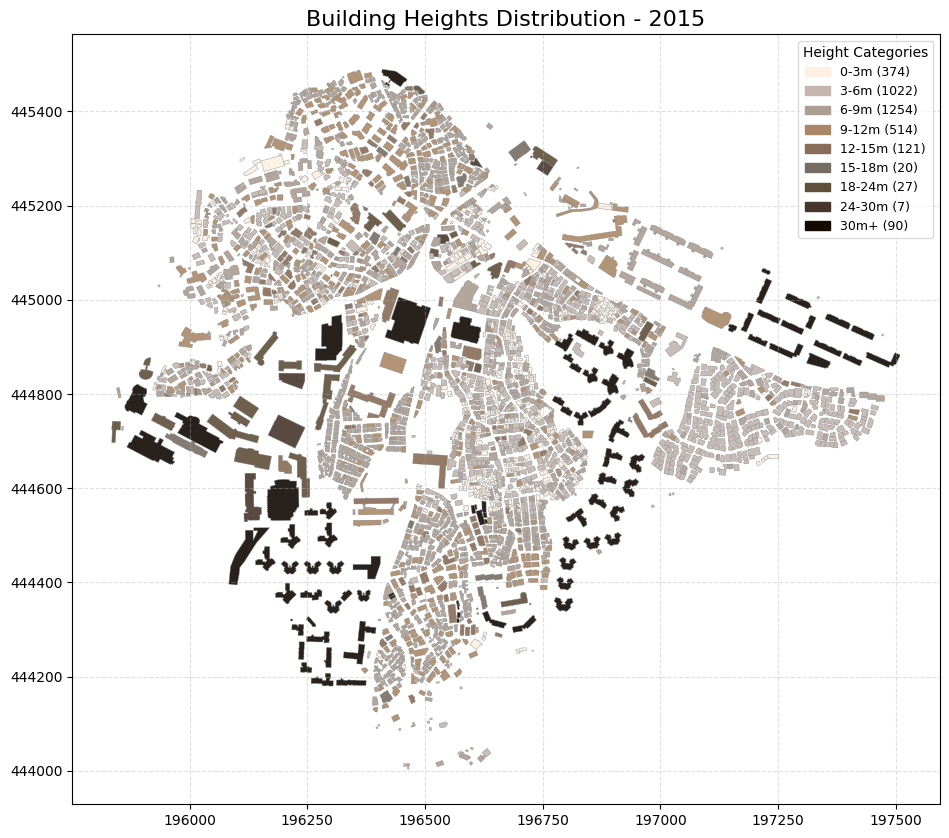

In [14]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2015.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2015.to_file(output_path)
print(f"Saved final 2015 shapefile to: {output_path}")

# Fix the data type issue before creating the visualization
흑석동_final_2015['Height (m)'] = pd.to_numeric(흑석동_final_2015['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2015['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2015['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2015[흑석동_final_2015['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2015', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2015.png'), dpi=300, bbox_inches='tight')
plt.show()

In [15]:
len(흑석동_final_2015)

3429

## Shapefile 2016

In [17]:
흑석동_1st_2016['Calculated Area'] = 흑석동_1st_2016['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2016['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2016 = 흑석동_1st_2016[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2016)}")

Removed 160 buildings with area < 10 sq meters
Remaining buildings: 3400


In [18]:
흑석동_2nd_2016 = 흑석동_1st_2016.copy()

column_mappings = {
    'gfa': 'GFA (m2)',
    'footprint': 'Building footprint (m2)',
    'PLATAREA': 'Plot area (m2)',
    'height_1': 'Height (m)',
    'BC_RAT': 'Building to land ratio (%)'
}

# Create a dictionary to track updates
update_counts = {col_target: 0 for col_target in column_mappings.values()}

# Add a new floors column to the dataset
흑석동_2nd_2016['floors'] = 0
update_counts['floors'] = 0 

# Iterate through each row in the target shapefile
for idx, row in 흑석동_2nd_2016.iterrows():
    unique_number = row['Unique number']
    
    # Find matching row in merge_흑석동 shapefile
    matching_rows = merge_흑석동[merge_흑석동['PNU'] == unique_number]
    
    if len(matching_rows) > 0:
        # Use the first matching row (in case there are multiple matches)
        merge_row = matching_rows.iloc[0]
        
        # Update each mapped column if the value is 0 or null in the target
        for col_merge, col_target in column_mappings.items():
            if pd.isna(row[col_target]) or row[col_target] == 0:
                if col_merge in merge_흑석동.columns and not pd.isna(merge_row[col_merge]):
                    흑석동_2nd_2016.at[idx, col_target] = merge_row[col_merge]
                    update_counts[col_target] += 1
        
        # Add floors value from merge_흑석동 (this is a new column)
        if 'floors' in merge_흑석동.columns and not pd.isna(merge_row['floors']):
            흑석동_2nd_2016.at[idx, 'floors'] = merge_row['floors']
            update_counts['floors'] += 1

# Display update statistics
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} rows updated")

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3303761462.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  흑석동_2nd_2016.at[idx, col_target] = merge_row[col_merge]
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3303761462.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '6' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  흑석동_2nd_2016.at[idx, col_target] = merge_row[col_merge]
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3303761462.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with float64, please explicitly cast t

Update statistics:
GFA (m2): 363 rows updated
Building footprint (m2): 351 rows updated
Plot area (m2): 1228 rows updated
Height (m): 1701 rows updated
Building to land ratio (%): 1172 rows updated
floors: 2206 rows updated


In [19]:
흑석동_3rd_2016 = 흑석동_2nd_2016.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_3rd_2016.columns:
        흑석동_3rd_2016[col] = pd.to_numeric(흑석동_3rd_2016[col], errors='coerce')
        흑석동_3rd_2016[col] = 흑석동_3rd_2016[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_3rd_2016.columns:
    흑석동_3rd_2016['Building to land ratio (%)'] = pd.to_numeric(흑석동_3rd_2016['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_3rd_2016.loc[흑석동_3rd_2016['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_3rd_2016['Building footprint (m2)'] == 0) & (흑석동_3rd_2016['Calculated Area'] > 0)
흑석동_3rd_2016.loc[mask, 'Building footprint (m2)'] = 흑석동_3rd_2016.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_3rd_2016['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_3rd_2016['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_3rd_2016['Calculated Area'] >= 30) & (흑석동_3rd_2016['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_3rd_2016['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_3rd_2016.loc[small_buildings_mask, 'floors'] = 2
흑석동_3rd_2016.loc[medium_buildings_mask, 'floors'] = 3
흑석동_3rd_2016.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_3rd_2016['GFA (m2)'] == 0) & 
                     (흑석동_3rd_2016['Building footprint (m2)'] > 0) & 
                     (흑석동_3rd_2016['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_3rd_2016['Height (m)'] == 0) & 
                     (흑석동_3rd_2016['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_3rd_2016['Plot area (m2)'] == 0) & 
                     (흑석동_3rd_2016['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_3rd_2016.loc[mask, rel['target']] = rel['formula'](흑석동_3rd_2016.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_3rd_2016[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_3rd_2016)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.95%
Updated 252 building footprints using calculated area
Set floors = 2 for 171 small buildings (area < 30 m²)
Set floors = 3 for 836 medium buildings (area 30-100 m²)
Set floors = 4 for 308 large buildings (area >= 100 m²)
Updated 382 rows for GFA (m2) using relationship
Updated 1067 rows for Height (m) using relationship
Updated 1777 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


In [20]:
흑석동_with_additions_2016 = 흑석동_3rd_2016.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',
]

# Only run this if there are buildings to add
if buildings_to_add:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions.columns:
                흑석동_with_additions[col] = None
        
        if 'floors' not in 흑석동_with_additions.columns:
            흑석동_with_additions['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2016 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2016.crs)
            흑석동_with_additions_2016 = pd.concat([흑석동_with_additions_2016, new_buildings_gdf_2016], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2016.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2016['Calculated Area'])
                흑석동_with_additions_2016.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2016.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 29 out of 29 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500102470002000002
Prepared building with GIS ID: 1159010500102470002000003
Prepared building with GIS ID: 1159010500102740002015071
Prepared building with GIS ID: 1159010500102470002000001
Prepared building with GIS ID: 1159010500102470002000004
Prepared building with GIS ID: 1159010500102470002000005
Prepared building with GIS ID: 1159010500102470002000006
Prepared building with GIS ID: 1159010500103360000000002
Prepared building with GIS ID: 1159010500103360000000011
Prepared building with GIS ID: 1159010500103360000000012
Prepared building with GIS ID: 1159010500103360000000013
Prepared building with GIS ID: 1159010500103360000000014
Prepared building with GIS ID: 1159010500100670000000001
Prepared building with GIS ID: 1159010500103360000000003
Prepared building with GIS ID: 1159010500103360000000004
Prepared building with GIS ID: 1159010500103360000000005
Prepared building with GIS ID: 115901050010336

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/722837875.py:104: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2016 = pd.concat([흑석동_with_additions_2016, new_buildings_gdf_2016], ignore_index=True)


In [21]:
# Create a copy to apply assumptions - now including any added buildings
흑석동_final_2016 = 흑석동_with_additions.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_final_2016.columns:
        흑석동_final_2016[col] = pd.to_numeric(흑석동_final_2016[col], errors='coerce')
        흑석동_final_2016[col] = 흑석동_final_2016[col].fillna(0)

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_final_2016['Building footprint (m2)'] == 0) & (흑석동_final_2016['Calculated Area'] > 0)
흑석동_final_2016.loc[mask, 'Building footprint (m2)'] = 흑석동_final_2016.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_final_2016['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_final_2016['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_final_2016['Calculated Area'] >= 30) & (흑석동_final_2016['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_final_2016['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_final_2016.loc[small_buildings_mask, 'floors'] = 2
흑석동_final_2016.loc[medium_buildings_mask, 'floors'] = 3
흑석동_final_2016.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_final_2016['GFA (m2)'] == 0) & 
                     (흑석동_final_2016['Building footprint (m2)'] > 0) & 
                     (흑석동_final_2016['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_final_2016['Height (m)'] == 0) & 
                     (흑석동_final_2016['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_3rd_2016['Plot area (m2)'] == 0) & 
                     (흑석동_3rd_2016['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_final_2016.loc[mask, rel['target']] = rel['formula'](흑석동_final_2016.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_final_2016[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_final_2016)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Updated 0 building footprints using calculated area
Set floors = 2 for 0 small buildings (area < 30 m²)
Set floors = 3 for 0 medium buildings (area 30-100 m²)
Set floors = 4 for 0 large buildings (area >= 100 m²)

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 29 buildings (0.85%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


Saved final 2015 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2016.shp


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/4183772009.py:9: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2016.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distric

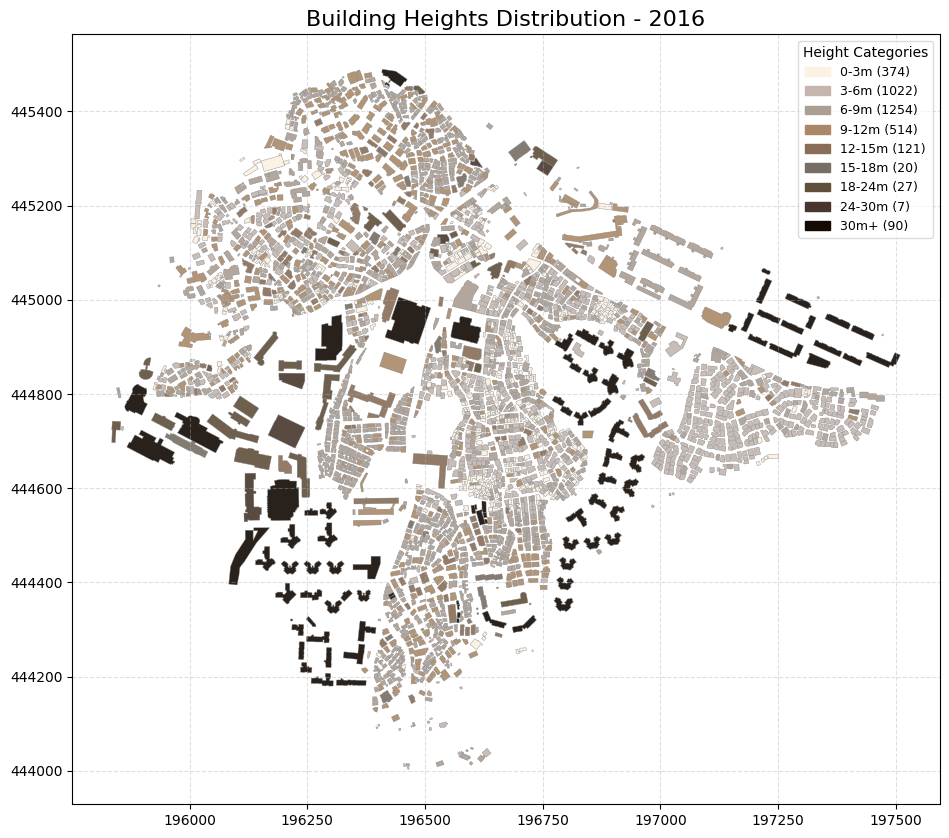

In [22]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2016.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2016.to_file(output_path)
print(f"Saved final 2015 shapefile to: {output_path}")

# Fix the data type issue before creating the visualization
흑석동_final_2015['Height (m)'] = pd.to_numeric(흑석동_final_2016['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2016['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2016['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2016[흑석동_final_2016['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2016', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2016.png'), dpi=300, bbox_inches='tight')
plt.show()

In [23]:
len(흑석동_final_2016)

3429

## Shapefile 2017

In [25]:
print(흑석동_1st_2017.columns.tolist())
print(흑석동_1st_2016.columns.tolist())

['Shape ID', 'GIS building identification number', 'Unique number', 'Dong code', 'Street name', 'Street number', 'Special district code', 'Special district name', 'Building use code', 'Building use name', 'Building structure code', 'Building structure name', 'Building footprint (m2)', 'Date of approval for use', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'Building to land ratio (%)', 'FAR (%)', 'Building ID', 'Violation?', 'Reference system key', 'Database date', 'geometry']
['Shape ID', 'GIS building identification number', 'Unique number', 'Dong code', 'Street name', 'Street number', 'Special district code', 'Special district name', 'Building use code', 'Building use name', 'Building structure code', 'Building structure name', 'Building footprint (m2)', 'Date of approval for use', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'Building to land ratio (%)', 'FAR (%)', 'Building ID', 'Violation?', 'Reference system key', 'Database date', 'geometry', 'Calculated Area']


In [26]:
polygon_path = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 2.gpkg" 
exclusion_polygon = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2017 Shapefile: {len(흑석동_1st_2017)} buildings")
print(f"2016 Shapefile: {len(흑석동_final_2016)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon)} features")

2017 Shapefile: 3103 buildings
2016 Shapefile: 3429 buildings
Exclusion polygon file loaded with 1 features


In [27]:
흑석동_1st_2017['Calculated Area'] = 흑석동_1st_2017['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2017['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2017 = 흑석동_1st_2017[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2017)}")

Removed 158 buildings with area < 10 sq meters
Remaining buildings: 2945


Converting CRS from EPSG:5174 to EPSG:4326
Removed 86 buildings within the exclusion polygon
Remaining buildings: 2859


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/2427823890.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


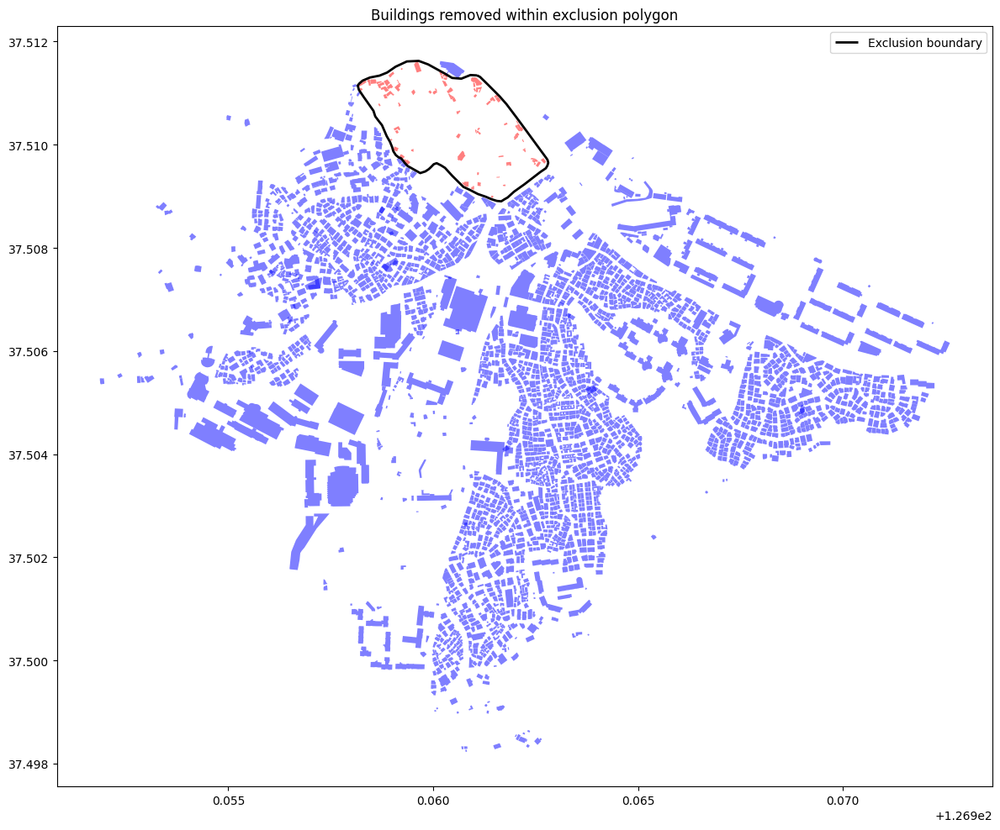

In [28]:
# Create a copy to work with
흑석동_2nd_2017 = 흑석동_1st_2017.copy()

# Make sure both datasets have the same CRS (Coordinate Reference System)
if 흑석동_2nd_2017.crs != exclusion_polygon.crs:
    print(f"Converting CRS from {흑석동_2nd_2017.crs} to {exclusion_polygon.crs}")
    흑석동_2nd_2017 = 흑석동_2nd_2017.to_crs(exclusion_polygon.crs)

# Dissolve multiple polygons into one if needed
if len(exclusion_polygon) > 1:
    exclusion_area = gpd.GeoDataFrame(geometry=[exclusion_polygon.unary_union], crs=exclusion_polygon.crs)
else:
    exclusion_area = exclusion_polygon

# Find buildings that intersect with the exclusion polygon
intersects_mask = 흑석동_2nd_2017.intersects(exclusion_area.iloc[0].geometry)
buildings_to_remove = 흑석동_2nd_2017[intersects_mask]
buildings_to_keep = 흑석동_2nd_2017[~intersects_mask]

# Remove buildings within the exclusion polygon
흑석동_2nd_2017 = buildings_to_keep.copy()

print(f"Removed {len(buildings_to_remove)} buildings within the exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2017)}")

# Visualize the removed buildings
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2017.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')
buildings_to_remove.plot(ax=ax, color='red', alpha=0.5, label='Removed buildings')
exclusion_area.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary')
plt.legend()
plt.title('Buildings removed within exclusion polygon')
plt.tight_layout()
plt.show()

In [29]:
흑석동_3rd_2017 = 흑석동_2nd_2017.copy()

흑석동_3rd_2017=흑석동_3rd_2017.to_crs(흑석동_1st_2017.crs)

# Define the columns to transfer from 2016 to 2017
columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2017.columns:
        흑석동_3rd_2017[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2016 = {}
for idx, row in 흑석동_final_2016.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2016[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2017.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2016:
        matched_buildings += 1
        building_2016 = buildings_2016[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2016 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2017.at[idx, col] = building_2016[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2017 that match with 2016 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2016 data")


Found 2840 buildings in 2017 that match with 2016 data
Update statistics:
GFA (m2): 553 values transferred from 2016 data
Height (m): 2181 values transferred from 2016 data
Building footprint (m2): 526 values transferred from 2016 data
Plot area (m2): 1598 values transferred from 2016 data
floors: 2840 values transferred from 2016 data
Building to land ratio (%): 1564 values transferred from 2016 data


In [30]:
흑석동_with_additions_2017 = 흑석동_3rd_2017.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2017 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',
]

# Only run this if there are buildings to add
if buildings_to_add_2017:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2017)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2017)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2017.columns:
                흑석동_with_additions_2017[col] = None
        
        if 'floors' not in 흑석동_with_additions.columns:
            흑석동_with_additions_2017['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2017.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2017 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2017.crs)
            흑석동_with_additions_2017 = pd.concat([흑석동_with_additions_2017, new_buildings_gdf_2017], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2017.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2017['Calculated Area'])
                흑석동_with_additions_2017.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2017.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 29 out of 29 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500102470002000002
Prepared building with GIS ID: 1159010500102470002000003
Prepared building with GIS ID: 1159010500102740002015071
Prepared building with GIS ID: 1159010500102470002000001
Prepared building with GIS ID: 1159010500102470002000004
Prepared building with GIS ID: 1159010500102470002000005
Prepared building with GIS ID: 1159010500102470002000006
Prepared building with GIS ID: 1159010500103360000000002
Prepared building with GIS ID: 1159010500103360000000011
Prepared building with GIS ID: 1159010500103360000000012
Prepared building with GIS ID: 1159010500103360000000013
Prepared building with GIS ID: 1159010500103360000000014
Prepared building with GIS ID: 1159010500100670000000001
Prepared building with GIS ID: 1159010500103360000000003
Prepared building with GIS ID: 1159010500103360000000004
Prepared building with GIS ID: 1159010500103360000000005
Prepared building with GIS ID: 115901050010336

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1335413333.py:104: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2017 = pd.concat([흑석동_with_additions_2017, new_buildings_gdf_2017], ignore_index=True)


In [31]:
# Create a copy to apply assumptions
흑석동_5th_2017 = 흑석동_with_additions_2017.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_5th_2017.columns:
        흑석동_5th_2017[col] = pd.to_numeric(흑석동_5th_2017[col], errors='coerce')
        흑석동_5th_2017[col] = 흑석동_5th_2017[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_5th_2017.columns:
    흑석동_5th_2017['Building to land ratio (%)'] = pd.to_numeric(흑석동_5th_2017['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_5th_2017.loc[흑석동_5th_2017['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_5th_2017['Building footprint (m2)'] == 0) & (흑석동_5th_2017['Calculated Area'] > 0)
흑석동_5th_2017.loc[mask, 'Building footprint (m2)'] = 흑석동_5th_2017.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_5th_2017['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_5th_2017['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_5th_2017['Calculated Area'] >= 30) & (흑석동_5th_2017['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_5th_2017['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_5th_2017.loc[small_buildings_mask, 'floors'] = 2
흑석동_5th_2017.loc[medium_buildings_mask, 'floors'] = 3
흑석동_5th_2017.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_5th_2017['GFA (m2)'] == 0) & 
                     (흑석동_5th_2017['Building footprint (m2)'] > 0) & 
                     (흑석동_5th_2017['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_5th_2017['Height (m)'] == 0) & 
                     (흑석동_5th_2017['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_5th_2017['Plot area (m2)'] == 0) & 
                     (흑석동_5th_2017['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_5th_2017.loc[mask, rel['target']] = rel['formula'](흑석동_5th_2017.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_5th_2017[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_5th_2017)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.90%
Updated 0 building footprints using calculated area
Set floors = 2 for 0 small buildings (area < 30 m²)
Set floors = 3 for 9 medium buildings (area 30-100 m²)
Set floors = 4 for 10 large buildings (area >= 100 m²)
Updated 2 rows for Height (m) using relationship
Updated 32 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


<Axes: >

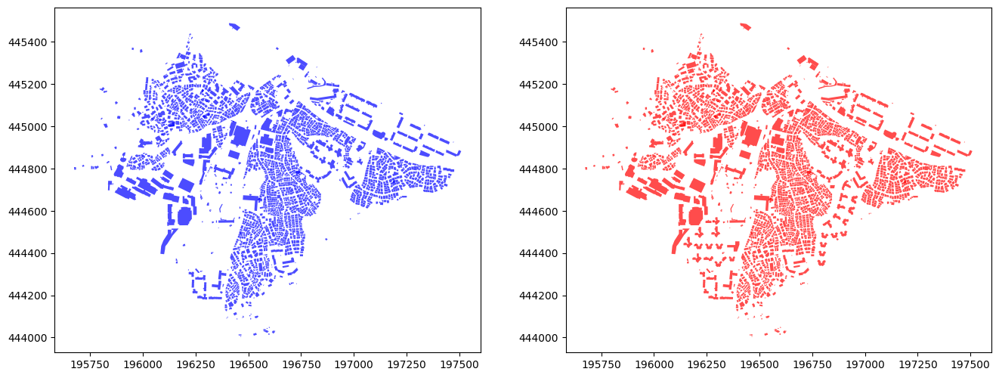

In [32]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
흑석동_3rd_2017.plot(ax=ax1, color='blue', alpha=0.7)
    
흑석동_5th_2017.plot(ax=ax2, color='red', alpha=0.7)

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3848756527.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2017.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distri

Saved final 2017 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2017.shp


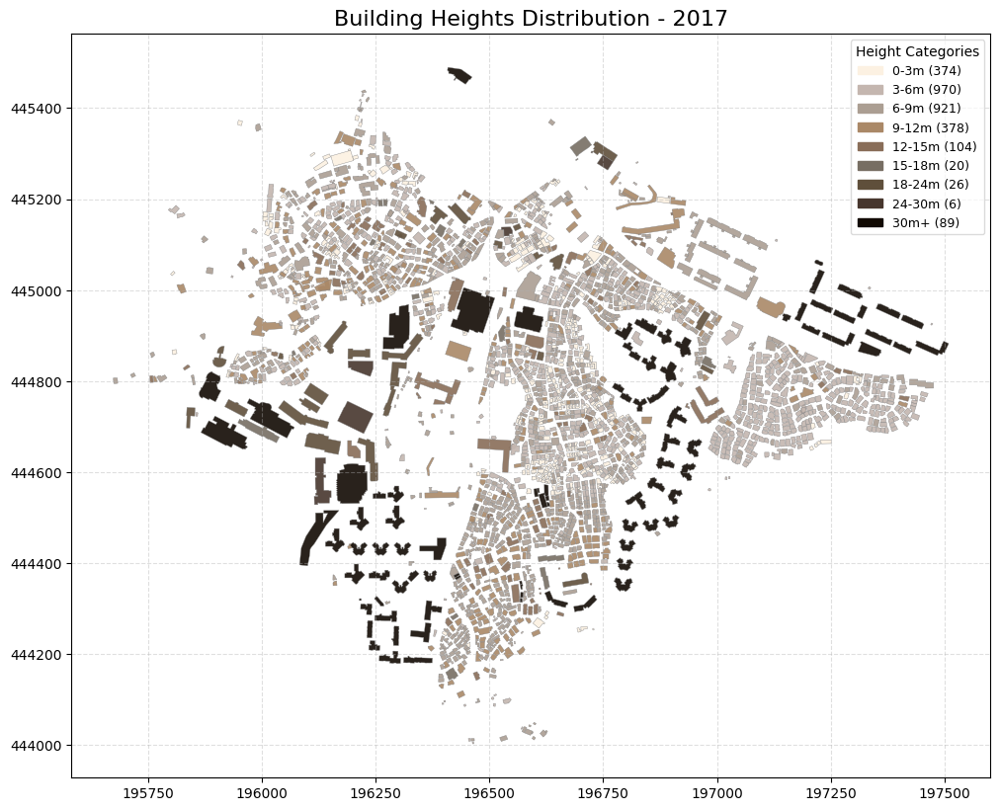

In [33]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2017.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2017 = 흑석동_5th_2017.copy()
흑석동_final_2017.to_file(output_path)
print(f"Saved final 2017 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2017['Height (m)'] = pd.to_numeric(흑석동_final_2017['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2017['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2017['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2017[흑석동_final_2017['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2017', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2017.png'), dpi=300, bbox_inches='tight')
plt.show()

In [34]:
len(흑석동_final_2017)

2888

## Shapefile 2018

In [36]:
polygon_path = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg"
exclusion_polygon_2018 = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2018 Shapefile: {len(흑석동_1st_2018)} buildings")
print(f"2017 Shapefile: {len(흑석동_final_2017)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon)} features")

2018 Shapefile: 3102 buildings
2017 Shapefile: 2888 buildings
Exclusion polygon file loaded with 1 features


In [37]:
흑석동_1st_2018['Calculated Area'] = 흑석동_1st_2018['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2018['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2018 = 흑석동_1st_2018[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2018)}")

Removed 155 buildings with area < 10 sq meters
Remaining buildings: 2947


Converting CRS from EPSG:5174 to EPSG:4326
Removed 86 buildings within the exclusion polygon
Remaining buildings: 2861


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/4223686436.py:10: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  exclusion_area = gpd.GeoDataFrame(geometry=[exclusion_polygon_2018.unary_union], crs=exclusion_polygon_2018.crs)
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/4223686436.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


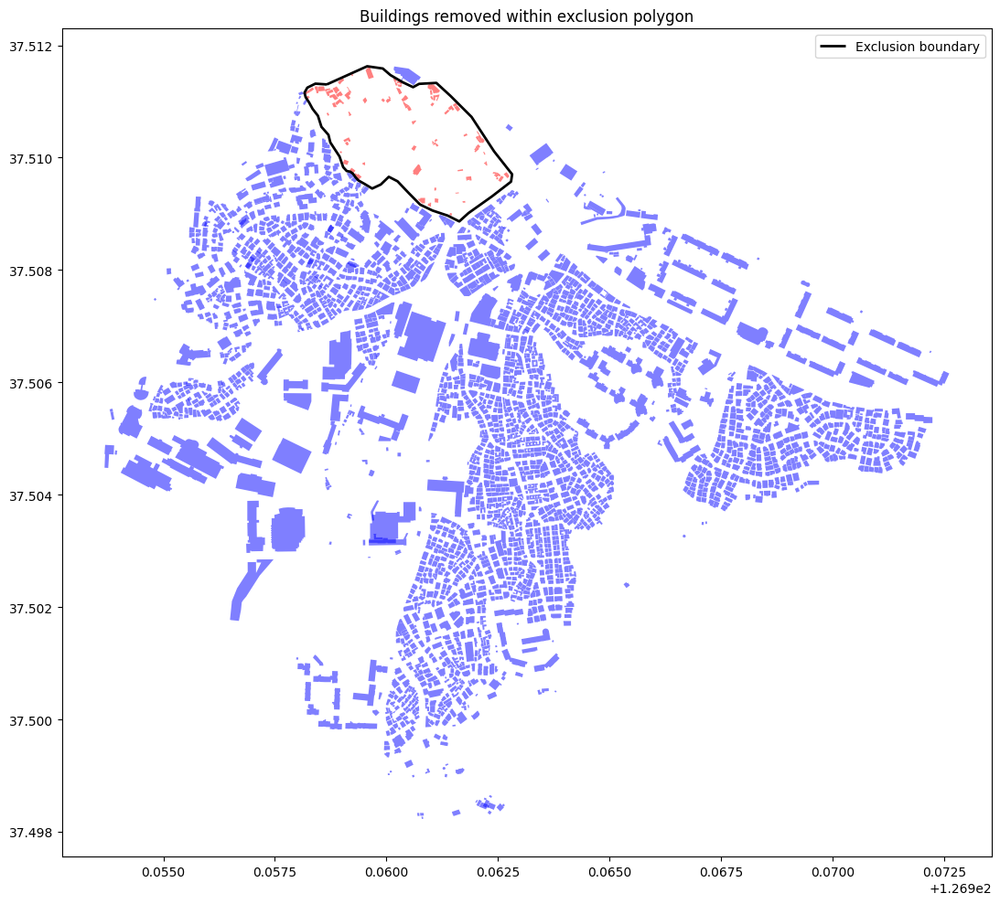

In [38]:
흑석동_2nd_2018 = 흑석동_1st_2018.copy()

# Make sure both datasets have the same CRS (Coordinate Reference System)
if 흑석동_2nd_2018.crs != exclusion_polygon_2018.crs:
    print(f"Converting CRS from {흑석동_2nd_2018.crs} to {exclusion_polygon_2018.crs}")
    흑석동_2nd_2018 = 흑석동_2nd_2018.to_crs(exclusion_polygon_2018.crs)

# Dissolve multiple polygons into one if needed
if len(exclusion_polygon_2018) > 1:
    exclusion_area = gpd.GeoDataFrame(geometry=[exclusion_polygon_2018.unary_union], crs=exclusion_polygon_2018.crs)
else:
    exclusion_area = exclusion_polygon_2018

# Find buildings that intersect with the exclusion polygon
intersects_mask = 흑석동_2nd_2018.intersects(exclusion_area.iloc[0].geometry)
buildings_to_remove = 흑석동_2nd_2018[intersects_mask]
buildings_to_keep = 흑석동_2nd_2018[~intersects_mask]

# Remove buildings within the exclusion polygon
흑석동_2nd_2018 = buildings_to_keep.copy()

print(f"Removed {len(buildings_to_remove)} buildings within the exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2018)}")

# Visualize the removed buildings
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2018.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')
buildings_to_remove.plot(ax=ax, color='red', alpha=0.5, label='Removed buildings')
exclusion_area.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary')
plt.legend()
plt.title('Buildings removed within exclusion polygon')
plt.tight_layout()
plt.show()

In [39]:
흑석동_3rd_2018 = 흑석동_2nd_2018.copy()

흑석동_3rd_2018=흑석동_3rd_2018.to_crs(흑석동_1st_2018.crs)

# Define the columns to transfer from 2016 to 2017
columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2018.columns:
        흑석동_3rd_2018[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2017 = {}
for idx, row in 흑석동_final_2017.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2017[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2018.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2017:
        matched_buildings += 1
        building_2017 = buildings_2017[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2017 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2018.at[idx, col] = building_2017[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2018 that match with 2017 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2017 data")


Found 2838 buildings in 2018 that match with 2017 data
Update statistics:
GFA (m2): 543 values transferred from 2017 data
Height (m): 2165 values transferred from 2017 data
Building footprint (m2): 517 values transferred from 2017 data
Plot area (m2): 1583 values transferred from 2017 data
floors: 2838 values transferred from 2017 data
Building to land ratio (%): 1548 values transferred from 2017 data


In [40]:
흑석동_with_additions_2018 = 흑석동_3rd_2018.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2018 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',
]

# Only run this if there are buildings to add
if buildings_to_add_2018:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2018)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2017)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2017.columns:
                흑석동_with_additions_2018[col] = None
        
        if 'floors' not in 흑석동_with_additions.columns:
            흑석동_with_additions_2018['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2018.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2018 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2018.crs)
            흑석동_with_additions_2018 = pd.concat([흑석동_with_additions_2018, new_buildings_gdf_2018], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2018.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2018['Calculated Area'])
                흑석동_with_additions_2018.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2018.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 29 out of 29 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500102470002000002
Prepared building with GIS ID: 1159010500102470002000003
Prepared building with GIS ID: 1159010500102740002015071
Prepared building with GIS ID: 1159010500102470002000001
Prepared building with GIS ID: 1159010500102470002000004
Prepared building with GIS ID: 1159010500102470002000005
Prepared building with GIS ID: 1159010500102470002000006
Prepared building with GIS ID: 1159010500103360000000002
Prepared building with GIS ID: 1159010500103360000000011
Prepared building with GIS ID: 1159010500103360000000012
Prepared building with GIS ID: 1159010500103360000000013
Prepared building with GIS ID: 1159010500103360000000014
Prepared building with GIS ID: 1159010500100670000000001
Prepared building with GIS ID: 1159010500103360000000003
Prepared building with GIS ID: 1159010500103360000000004
Prepared building with GIS ID: 1159010500103360000000005
Prepared building with GIS ID: 115901050010336

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/372887770.py:104: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2018 = pd.concat([흑석동_with_additions_2018, new_buildings_gdf_2018], ignore_index=True)


In [41]:
# Create a copy to apply assumptions
흑석동_5th_2018 = 흑석동_with_additions_2018.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_5th_2018.columns:
        흑석동_5th_2018[col] = pd.to_numeric(흑석동_5th_2018[col], errors='coerce')
        흑석동_5th_2018[col] = 흑석동_5th_2018[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_5th_2018.columns:
    흑석동_5th_2018['Building to land ratio (%)'] = pd.to_numeric(흑석동_5th_2018['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_5th_2018.loc[흑석동_5th_2018['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_5th_2018['Building footprint (m2)'] == 0) & (흑석동_5th_2018['Calculated Area'] > 0)
흑석동_5th_2018.loc[mask, 'Building footprint (m2)'] = 흑석동_5th_2018.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_5th_2018['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_5th_2018['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_5th_2018['Calculated Area'] >= 30) & (흑석동_5th_2018['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_5th_2018['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_5th_2018.loc[small_buildings_mask, 'floors'] = 2
흑석동_5th_2018.loc[medium_buildings_mask, 'floors'] = 3
흑석동_5th_2018.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_5th_2018['GFA (m2)'] == 0) & 
                     (흑석동_5th_2018['Building footprint (m2)'] > 0) & 
                     (흑석동_5th_2018['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_5th_2018['Height (m)'] == 0) & 
                     (흑석동_5th_2018['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_5th_2018['Plot area (m2)'] == 0) & 
                     (흑석동_5th_2018['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_5th_2018.loc[mask, rel['target']] = rel['formula'](흑석동_5th_2018.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_5th_2018[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_5th_2018)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 52.03%
Updated 0 building footprints using calculated area
Set floors = 2 for 1 small buildings (area < 30 m²)
Set floors = 3 for 8 medium buildings (area 30-100 m²)
Set floors = 4 for 14 large buildings (area >= 100 m²)
Updated 30 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


Saved final 2017 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2018.shp


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/4054974044.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2018.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distri

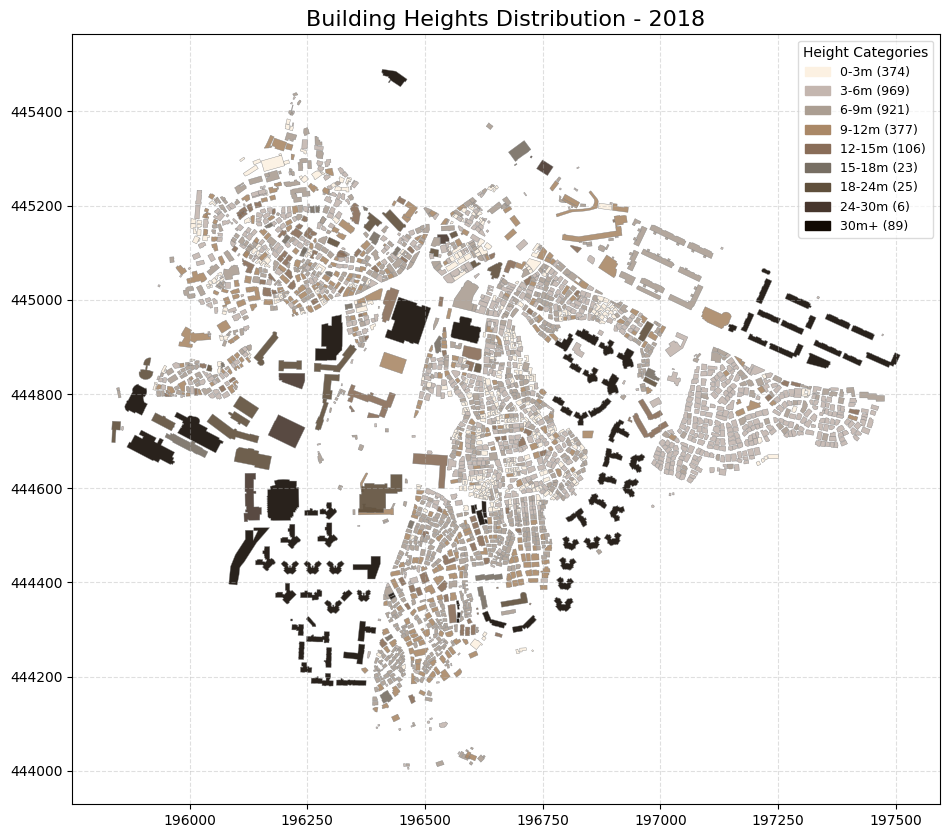

In [42]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2018.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2018 = 흑석동_5th_2018.copy()
흑석동_final_2018.to_file(output_path)
print(f"Saved final 2017 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2018['Height (m)'] = pd.to_numeric(흑석동_final_2018['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2018['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2018['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2018[흑석동_final_2018['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2018', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2018.png'), dpi=300, bbox_inches='tight')
plt.show()

In [43]:
len(흑석동_final_2018)

2890

## Shapefile 2019

In [45]:
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg" 
exclusion_polygon_2019_1 = gpd.read_file(polygon_path)

polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg" 
exclusion_polygon_2019_2 = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2019 Shapefile: {len(흑석동_1st_2019)} buildings")
print(f"2018 Shapefile: {len(흑석동_final_2018)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon_2019_1) + len(exclusion_polygon_2019_2)} features")

2019 Shapefile: 3102 buildings
2018 Shapefile: 2890 buildings
Exclusion polygon file loaded with 4 features


In [46]:
흑석동_1st_2019['Calculated Area'] = 흑석동_1st_2019['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2019['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2019 = 흑석동_1st_2019[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2019)}")

Removed 154 buildings with area < 10 sq meters
Remaining buildings: 2948


2019 Shapefile: 2948 buildings
First exclusion polygon file: 2 features
Second exclusion polygon file: 1 features
Converting buildings CRS to match first exclusion polygon
Processing the first exclusion polygon...
Dissolved 2 polygons into 1 for the first exclusion area
Removed 86 buildings using the first exclusion polygon
Remaining buildings: 2862
Processing the second exclusion polygon...
Removed 514 buildings using the second exclusion polygon
Remaining buildings: 2348
Total buildings removed: 600


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1836986064.py:30: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1836986064.py:69: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


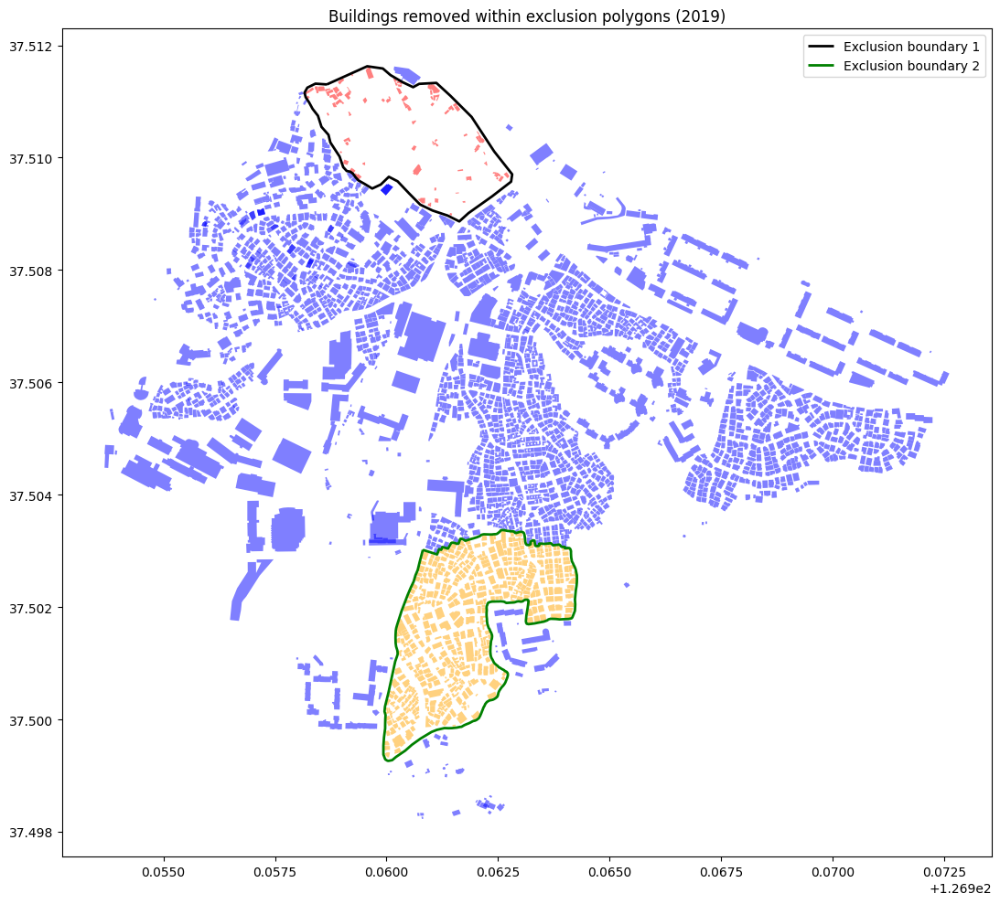

In [47]:
# Load the two exclusion polygon files
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg"
polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg"

exclusion_polygon_1 = gpd.read_file(polygon_path_1)
exclusion_polygon_2 = gpd.read_file(polygon_path_2)

# Display basic information
print(f"2019 Shapefile: {len(흑석동_1st_2019)} buildings")
print(f"First exclusion polygon file: {len(exclusion_polygon_1)} features")
print(f"Second exclusion polygon file: {len(exclusion_polygon_2)} features")

# Create a copy of the building data
흑석동_2nd_2019 = 흑석동_1st_2019.copy()

# Make sure all datasets have the same CRS
if 흑석동_2nd_2019.crs != exclusion_polygon_1.crs:
    print(f"Converting buildings CRS to match first exclusion polygon")
    흑석동_2nd_2019 = 흑석동_2nd_2019.to_crs(exclusion_polygon_1.crs)

if exclusion_polygon_2.crs != exclusion_polygon_1.crs:
    print(f"Converting second exclusion polygon CRS to match first")
    exclusion_polygon_2 = exclusion_polygon_2.to_crs(exclusion_polygon_1.crs)

# Process each exclusion polygon separately
# First, handle exclusion_polygon_1
print("Processing the first exclusion polygon...")
# Dissolve multiple polygons within the first file if needed
if len(exclusion_polygon_1) > 1:
    exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
    print(f"Dissolved {len(exclusion_polygon_1)} polygons into 1 for the first exclusion area")
else:
    exclusion_area_1 = exclusion_polygon_1

# Find buildings that intersect with the first exclusion polygon
intersects_mask_1 = 흑석동_2nd_2019.geometry.intersects(exclusion_area_1.geometry.iloc[0])
buildings_to_remove_1 = 흑석동_2nd_2019[intersects_mask_1].copy()
흑석동_2nd_2019 = 흑석동_2nd_2019[~intersects_mask_1].copy()
print(f"Removed {len(buildings_to_remove_1)} buildings using the first exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2019)}")

# Next, handle exclusion_polygon_2
print("Processing the second exclusion polygon...")
# Dissolve multiple polygons within the second file if needed
if len(exclusion_polygon_2) > 1:
    exclusion_area_2 = gpd.GeoDataFrame(geometry=[exclusion_polygon_2.unary_union], crs=exclusion_polygon_2.crs)
    print(f"Dissolved {len(exclusion_polygon_2)} polygons into 1 for the second exclusion area")
else:
    exclusion_area_2 = exclusion_polygon_2

# Find buildings that intersect with the second exclusion polygon
intersects_mask_2 = 흑석동_2nd_2019.geometry.intersects(exclusion_area_2.geometry.iloc[0])
buildings_to_remove_2 = 흑석동_2nd_2019[intersects_mask_2].copy()
흑석동_2nd_2019 = 흑석동_2nd_2019[~intersects_mask_2].copy()
print(f"Removed {len(buildings_to_remove_2)} buildings using the second exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2019)}")

# Combine the removed buildings for visualization
all_removed = pd.concat([buildings_to_remove_1, buildings_to_remove_2], ignore_index=True)
print(f"Total buildings removed: {len(all_removed)}")

# Visualize the results with both exclusion polygons
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2019.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')
buildings_to_remove_1.plot(ax=ax, color='red', alpha=0.5, label='Removed by polygon 1')
buildings_to_remove_2.plot(ax=ax, color='orange', alpha=0.5, label='Removed by polygon 2')
exclusion_area_1.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary 1')
exclusion_area_2.boundary.plot(ax=ax, color='green', linewidth=2, label='Exclusion boundary 2')
plt.legend()
plt.title('Buildings removed within exclusion polygons (2019)')
plt.tight_layout()
plt.show()

In [48]:
흑석동_3rd_2019 = 흑석동_2nd_2019.copy()

흑석동_3rd_2019=흑석동_3rd_2019.to_crs(흑석동_1st_2019.crs)

columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2019.columns:
        흑석동_3rd_2019[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2018 = {}
for idx, row in 흑석동_final_2018.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2018[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2019.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2018:
        matched_buildings += 1
        building_2018 = buildings_2018[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2018 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2019.at[idx, col] = building_2018[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2019 that match with 2018 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2018 data")


Found 2324 buildings in 2019 that match with 2018 data
Update statistics:
GFA (m2): 457 values transferred from 2018 data
Height (m): 1790 values transferred from 2018 data
Building footprint (m2): 447 values transferred from 2018 data
Plot area (m2): 1341 values transferred from 2018 data
floors: 2324 values transferred from 2018 data
Building to land ratio (%): 1298 values transferred from 2018 data


In [49]:
흑석동_with_additions_2019 = 흑석동_3rd_2019.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2019 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',

    # 아크로리버하임
    '1159010500101580001016570',
    '1159010500101580001016572',
    '1159010500101580001016573',
    '1159010500101580001016574',
    '1159010500101580001016575',
    '1159010500101580001016576',
    '1159010500101580001016577',
    '1159010500101580001016571',
    '1159010500101580001016578',
    '1159010500101580001016579',
    '1159010500103410003000001',
    '1159010500101580001016580',
    '1159010500101580001016581',
    '1159010500101580001016582',
    '1159010500101580001016583',
    '1159010500101730052017713',
    '1159010500101580001016584',
    '1159010500101580001016585',
    '1159010500101580001016586',
    '1159010500101580001016587',
    '1159010500101580001016588',
    '1159010500101580001016589',

    # 롯데캐슬에듀포레
    '1159010500102320055017114',
    '1159010500102320055017115',
    '1159010500102320055017116',
    '1159010500102320055017117',
    '1159010500102320055017118',
    '1159010500102320055017112',
    '1159010500102320055017113'
]

# Only run this if there are buildings to add
if buildings_to_add_2019:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2019)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2019)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2018.columns:
                흑석동_with_additions_2019[col] = None
        
        if 'floors' not in 흑석동_with_additions.columns:
            흑석동_with_additions_2019['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2019.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2019 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2019.crs)
            흑석동_with_additions_2019 = pd.concat([흑석동_with_additions_2019, new_buildings_gdf_2019], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2019.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2019['Calculated Area'])
                흑석동_with_additions_2019.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2019.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 58 out of 58 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500101580001016584
Prepared building with GIS ID: 1159010500101580001016588
Prepared building with GIS ID: 1159010500101580001016587
Prepared building with GIS ID: 1159010500102320055017116
Prepared building with GIS ID: 1159010500101580001016570
Prepared building with GIS ID: 1159010500101580001016579
Prepared building with GIS ID: 1159010500101580001016580
Prepared building with GIS ID: 1159010500101580001016581
Prepared building with GIS ID: 1159010500101580001016577
Prepared building with GIS ID: 1159010500102320055017114
Prepared building with GIS ID: 1159010500102320055017115
Prepared building with GIS ID: 1159010500102320055017118
Prepared building with GIS ID: 1159010500101580001016585
Prepared building with GIS ID: 1159010500101580001016586
Prepared building with GIS ID: 1159010500101580001016573
Prepared building with GIS ID: 1159010500101580001016571
Prepared building with GIS ID: 115901050010232

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1186519704.py:137: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2019 = pd.concat([흑석동_with_additions_2019, new_buildings_gdf_2019], ignore_index=True)


In [50]:
# Create a copy to apply assumptions
흑석동_5th_2019 = 흑석동_with_additions_2019.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_5th_2019.columns:
        흑석동_5th_2019[col] = pd.to_numeric(흑석동_5th_2019[col], errors='coerce')
        흑석동_5th_2019[col] = 흑석동_5th_2019[col].fillna(0)

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_5th_2019['Building footprint (m2)'] == 0) & (흑석동_5th_2019['Calculated Area'] > 0)
흑석동_5th_2019.loc[mask, 'Building footprint (m2)'] = 흑석동_5th_2019.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_5th_2019['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_5th_2019['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_5th_2019['Calculated Area'] >= 30) & (흑석동_5th_2019['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_5th_2019['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_5th_2019.loc[small_buildings_mask, 'floors'] = 2
흑석동_5th_2019.loc[medium_buildings_mask, 'floors'] = 3
흑석동_5th_2019.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_5th_2019['GFA (m2)'] == 0) & 
                     (흑석동_5th_2019['Building footprint (m2)'] > 0) & 
                     (흑석동_5th_2019['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_5th_2019['Height (m)'] == 0) & 
                     (흑석동_5th_2019['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_3rd_2019['Plot area (m2)'] == 0) & 
                     (흑석동_3rd_2019['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_5th_2019.loc[mask, rel['target']] = rel['formula'](흑석동_5th_2019.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_5th_2019[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_5th_2019)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Updated 2 building footprints using calculated area
Set floors = 2 for 0 small buildings (area < 30 m²)
Set floors = 3 for 5 medium buildings (area 30-100 m²)
Set floors = 4 for 19 large buildings (area >= 100 m²)
Updated 2 rows for GFA (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 58 buildings (2.41%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


Saved final 2019 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2019.shp


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3135725734.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2019.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distri

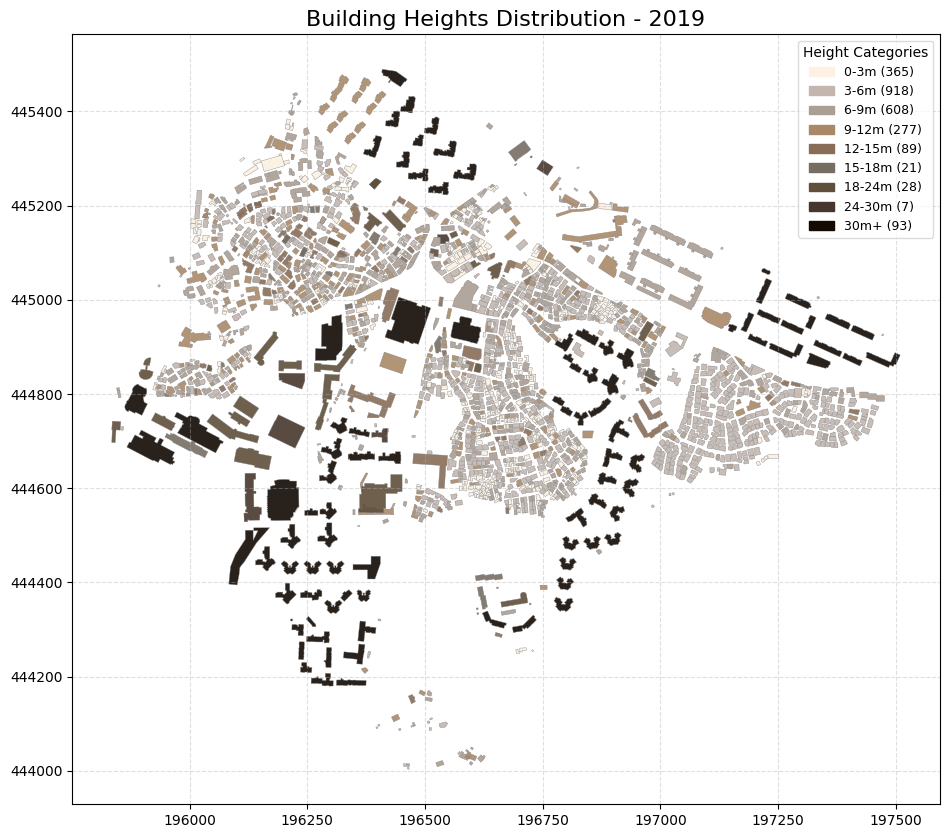

In [51]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2019.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2019 = 흑석동_5th_2019.copy()
흑석동_final_2019.to_file(output_path)
print(f"Saved final 2019 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2019['Height (m)'] = pd.to_numeric(흑석동_final_2019['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2019['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2019['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2019[흑석동_final_2019['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2019', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2019.png'), dpi=300, bbox_inches='tight')
plt.show()

## Shapefile 2020

In [53]:
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg" 
exclusion_polygon_2020_1 = gpd.read_file(polygon_path)

polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg" 
exclusion_polygon_2020_2 = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2020 Shapefile: {len(흑석동_1st_2020)} buildings")
print(f"2019 Shapefile: {len(흑석동_final_2019)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon_2020_1) + len(exclusion_polygon_2020_2)} features")

2020 Shapefile: 3086 buildings
2019 Shapefile: 2406 buildings
Exclusion polygon file loaded with 4 features


In [54]:
흑석동_1st_2020['Calculated Area'] = 흑석동_1st_2020['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2020['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2020 = 흑석동_1st_2020[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2020)}")

Removed 153 buildings with area < 10 sq meters
Remaining buildings: 2933


2020 Shapefile: 2933 buildings
First exclusion polygon file: 2 features
Second exclusion polygon file: 1 features
Converting buildings CRS to match first exclusion polygon
Processing the first exclusion polygon...
Dissolved 2 polygons into 1 for the first exclusion area
Removed 86 buildings using the first exclusion polygon
Remaining buildings: 2847
Processing the second exclusion polygon...
Removed 514 buildings using the second exclusion polygon
Remaining buildings: 2333
Total buildings removed: 600


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1498962315.py:30: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1498962315.py:69: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


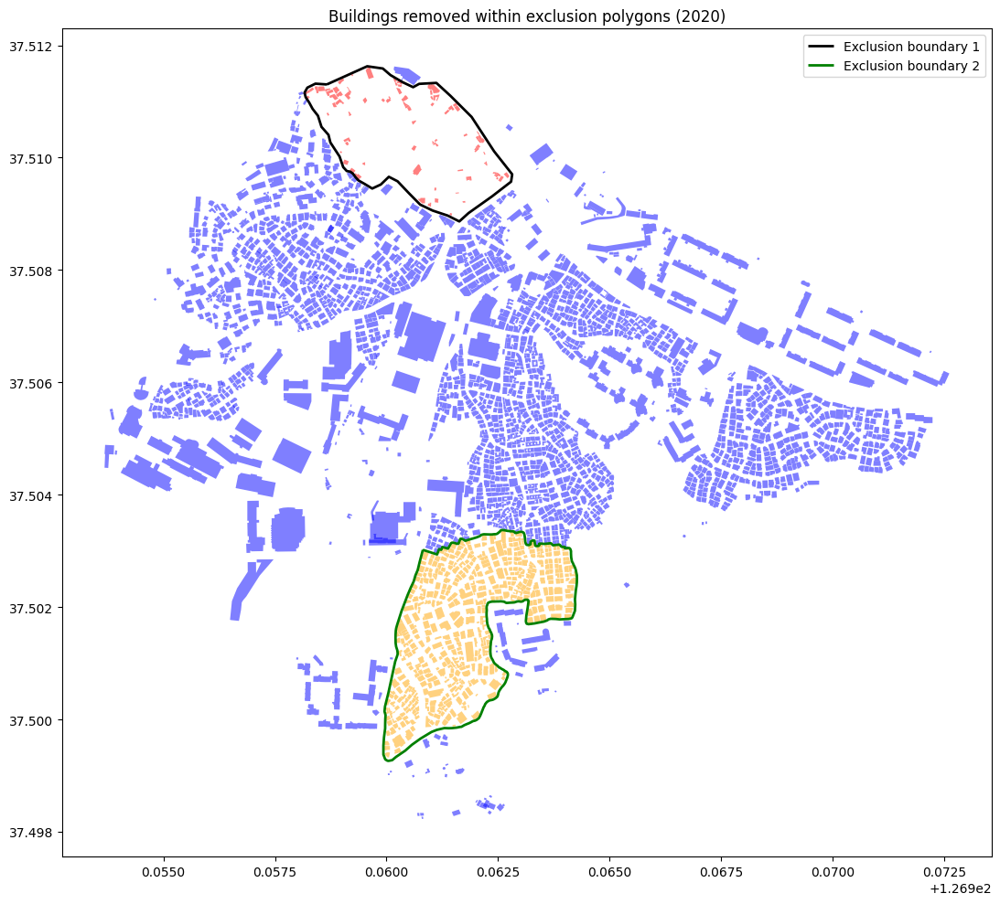

In [55]:
# Load the two exclusion polygon files
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg"
polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg"

exclusion_polygon_1 = gpd.read_file(polygon_path_1)
exclusion_polygon_2 = gpd.read_file(polygon_path_2)

# Display basic information
print(f"2020 Shapefile: {len(흑석동_1st_2020)} buildings")
print(f"First exclusion polygon file: {len(exclusion_polygon_1)} features")
print(f"Second exclusion polygon file: {len(exclusion_polygon_2)} features")

# Create a copy of the building data
흑석동_2nd_2020 = 흑석동_1st_2020.copy()

# Make sure all datasets have the same CRS
if 흑석동_2nd_2020.crs != exclusion_polygon_1.crs:
    print(f"Converting buildings CRS to match first exclusion polygon")
    흑석동_2nd_2020 = 흑석동_2nd_2020.to_crs(exclusion_polygon_1.crs)

if exclusion_polygon_2.crs != exclusion_polygon_1.crs:
    print(f"Converting second exclusion polygon CRS to match first")
    exclusion_polygon_2 = exclusion_polygon_2.to_crs(exclusion_polygon_1.crs)

# Process each exclusion polygon separately
# First, handle exclusion_polygon_1
print("Processing the first exclusion polygon...")
# Dissolve multiple polygons within the first file if needed
if len(exclusion_polygon_1) > 1:
    exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
    print(f"Dissolved {len(exclusion_polygon_1)} polygons into 1 for the first exclusion area")
else:
    exclusion_area_1 = exclusion_polygon_1

# Find buildings that intersect with the first exclusion polygon
intersects_mask_1 = 흑석동_2nd_2020.geometry.intersects(exclusion_area_1.geometry.iloc[0])
buildings_to_remove_1 = 흑석동_2nd_2020[intersects_mask_1].copy()
흑석동_2nd_2020 = 흑석동_2nd_2020[~intersects_mask_1].copy()
print(f"Removed {len(buildings_to_remove_1)} buildings using the first exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2020)}")

# Next, handle exclusion_polygon_2
print("Processing the second exclusion polygon...")
# Dissolve multiple polygons within the second file if needed
if len(exclusion_polygon_2) > 1:
    exclusion_area_2 = gpd.GeoDataFrame(geometry=[exclusion_polygon_2.unary_union], crs=exclusion_polygon_2.crs)
    print(f"Dissolved {len(exclusion_polygon_2)} polygons into 1 for the second exclusion area")
else:
    exclusion_area_2 = exclusion_polygon_2

# Find buildings that intersect with the second exclusion polygon
intersects_mask_2 = 흑석동_2nd_2020.geometry.intersects(exclusion_area_2.geometry.iloc[0])
buildings_to_remove_2 = 흑석동_2nd_2020[intersects_mask_2].copy()
흑석동_2nd_2020 = 흑석동_2nd_2020[~intersects_mask_2].copy()
print(f"Removed {len(buildings_to_remove_2)} buildings using the second exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2020)}")

# Combine the removed buildings for visualization
all_removed = pd.concat([buildings_to_remove_1, buildings_to_remove_2], ignore_index=True)
print(f"Total buildings removed: {len(all_removed)}")

# Visualize the results with both exclusion polygons
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2020.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')
buildings_to_remove_1.plot(ax=ax, color='red', alpha=0.5, label='Removed by polygon 1')
buildings_to_remove_2.plot(ax=ax, color='orange', alpha=0.5, label='Removed by polygon 2')
exclusion_area_1.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary 1')
exclusion_area_2.boundary.plot(ax=ax, color='green', linewidth=2, label='Exclusion boundary 2')
plt.legend()
plt.title('Buildings removed within exclusion polygons (2020)')
plt.tight_layout()
plt.show()

In [56]:
흑석동_3rd_2020 = 흑석동_2nd_2020.copy()

흑석동_3rd_2020=흑석동_3rd_2020.to_crs(흑석동_1st_2020.crs)

columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2020.columns:
        흑석동_3rd_2020[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2019 = {}
for idx, row in 흑석동_final_2019.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2019[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2020.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2019:
        matched_buildings += 1
        building_2019 = buildings_2019[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2019 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2020.at[idx, col] = building_2019[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2020 that match with 2019 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2019 data")


Found 2310 buildings in 2020 that match with 2019 data
Update statistics:
GFA (m2): 455 values transferred from 2019 data
Height (m): 1779 values transferred from 2019 data
Building footprint (m2): 445 values transferred from 2019 data
Plot area (m2): 1331 values transferred from 2019 data
floors: 2310 values transferred from 2019 data
Building to land ratio (%): 1288 values transferred from 2019 data


In [57]:
흑석동_with_additions_2020 = 흑석동_3rd_2020.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2020 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',

    # 아크로리버하임
    '1159010500101580001016570',
    '1159010500101580001016572',
    '1159010500101580001016573',
    '1159010500101580001016574',
    '1159010500101580001016575',
    '1159010500101580001016576',
    '1159010500101580001016577',
    '1159010500101580001016571',
    '1159010500101580001016578',
    '1159010500101580001016579',
    '1159010500103410003000001',
    '1159010500101580001016580',
    '1159010500101580001016581',
    '1159010500101580001016582',
    '1159010500101580001016583',
    '1159010500101730052017713',
    '1159010500101580001016584',
    '1159010500101580001016585',
    '1159010500101580001016586',
    '1159010500101580001016587',
    '1159010500101580001016588',
    '1159010500101580001016589',

    # 롯데캐슬에듀포레
    '1159010500102320055017114',
    '1159010500102320055017115',
    '1159010500102320055017116',
    '1159010500102320055017117',
    '1159010500102320055017118',
    '1159010500102320055017112',
    '1159010500102320055017113'
]

# Only run this if there are buildings to add
if buildings_to_add_2020:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2020)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2020)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2020.columns:
                흑석동_with_additions_2020[col] = None
        
        if 'floors' not in 흑석동_with_additions_2020.columns:
            흑석동_with_additions_2020['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2020.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2020 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2020.crs)
            흑석동_with_additions_2020 = pd.concat([흑석동_with_additions_2020, new_buildings_gdf_2020], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2020.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2020['Calculated Area'])
                흑석동_with_additions_2020.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2020.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 58 out of 58 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500101580001016584
Prepared building with GIS ID: 1159010500101580001016588
Prepared building with GIS ID: 1159010500101580001016587
Prepared building with GIS ID: 1159010500102320055017116
Prepared building with GIS ID: 1159010500101580001016570
Prepared building with GIS ID: 1159010500101580001016579
Prepared building with GIS ID: 1159010500101580001016580
Prepared building with GIS ID: 1159010500101580001016581
Prepared building with GIS ID: 1159010500101580001016577
Prepared building with GIS ID: 1159010500102320055017114
Prepared building with GIS ID: 1159010500102320055017115
Prepared building with GIS ID: 1159010500102320055017118
Prepared building with GIS ID: 1159010500101580001016585
Prepared building with GIS ID: 1159010500101580001016586
Prepared building with GIS ID: 1159010500101580001016573
Prepared building with GIS ID: 1159010500101580001016571
Prepared building with GIS ID: 115901050010232

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/300706466.py:137: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2020 = pd.concat([흑석동_with_additions_2020, new_buildings_gdf_2020], ignore_index=True)


In [58]:
흑석동_6th_2020 = 흑석동_with_additions_2020.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_6th_2020.columns:
        흑석동_6th_2020[col] = pd.to_numeric(흑석동_6th_2020[col], errors='coerce')
        흑석동_6th_2020[col] = 흑석동_6th_2020[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_6th_2020.columns:
    흑석동_6th_2020['Building to land ratio (%)'] = pd.to_numeric(흑석동_6th_2020['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_6th_2020.loc[흑석동_6th_2020['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_6th_2020['Building footprint (m2)'] == 0) & (흑석동_6th_2020['Calculated Area'] > 0)
흑석동_6th_2020.loc[mask, 'Building footprint (m2)'] = 흑석동_6th_2020.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_6th_2020['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_6th_2020['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_6th_2020['Calculated Area'] >= 30) & (흑석동_6th_2020['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_6th_2020['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_6th_2020.loc[small_buildings_mask, 'floors'] = 2
흑석동_6th_2020.loc[medium_buildings_mask, 'floors'] = 3
흑석동_6th_2020.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_6th_2020['GFA (m2)'] == 0) & 
                     (흑석동_6th_2020['Building footprint (m2)'] > 0) & 
                     (흑석동_6th_2020['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_6th_2020['Height (m)'] == 0) & 
                     (흑석동_6th_2020['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_3rd_2020['Plot area (m2)'] == 0) & 
                     (흑석동_3rd_2020['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_6th_2020.loc[mask, rel['target']] = rel['formula'](흑석동_6th_2020.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_6th_2020[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_6th_2020)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.43%
Updated 0 building footprints using calculated area
Set floors = 2 for 1 small buildings (area < 30 m²)
Set floors = 3 for 8 medium buildings (area 30-100 m²)
Set floors = 4 for 14 large buildings (area >= 100 m²)

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 58 buildings (2.43%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


<Axes: >

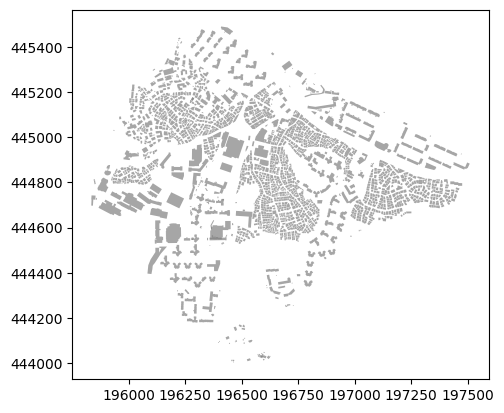

In [59]:
흑석동_with_additions_2020.plot(color='grey', alpha=0.7)

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/2162018440.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2020.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distri

Saved final 2020 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2020.shp


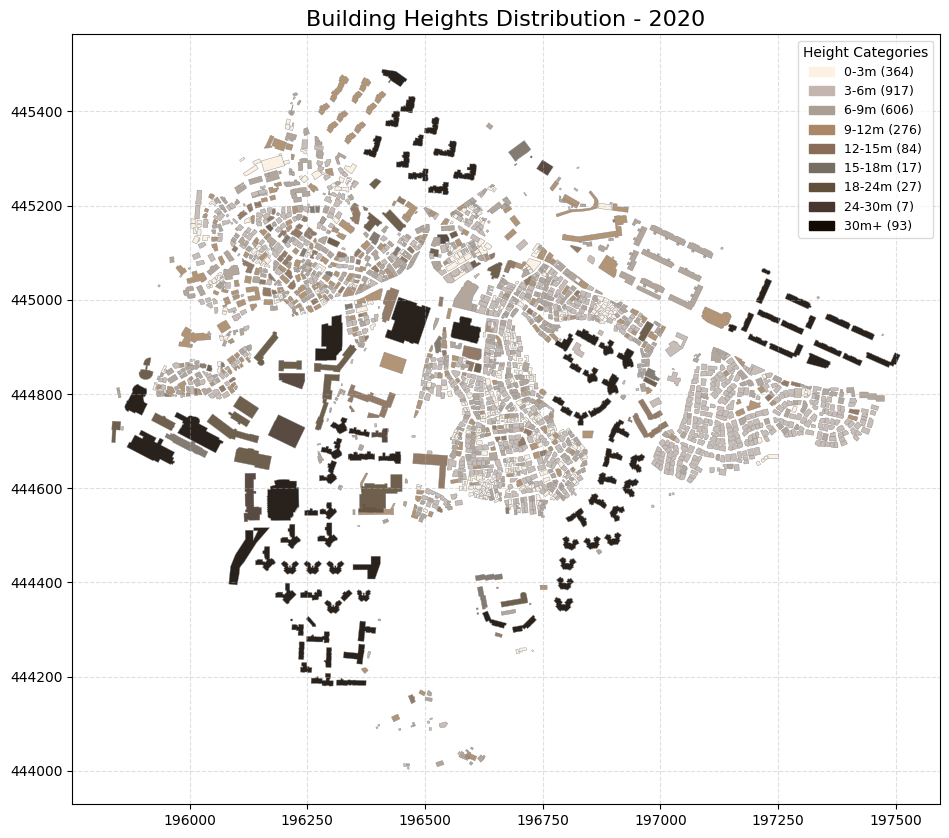

In [60]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2020.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2020 = 흑석동_6th_2020.copy()
흑석동_final_2020.to_file(output_path)
print(f"Saved final 2020 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2020['Height (m)'] = pd.to_numeric(흑석동_final_2020['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2020['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2020['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2020[흑석동_final_2020['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2020', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2020.png'), dpi=300, bbox_inches='tight')
plt.show()

In [61]:
흑석동_final_2020_check = 흑석동_final_2020[흑석동_final_2020['GIS building identification number'] == '1159010500102320055017116']
흑석동_final_2020_check

,Shape ID,GIS building identification number,Unique number,Dong code,Street name,Street number,Special district code,Special district name,Building use code,Building use name,...,Building to land ratio (%),FAR (%),Building ID,Violation?,Reference system key,Database date,geometry,Calculated Area,floors,Height Category
2336,33571,1159010500102320055017116,None,None,None,340-0,None,None,None,None,...,NaN,None,None,None,None,NaT,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",635.83717,23,30m+


In [62]:
len(흑석동_final_2020)

2391

## Shapefile 2021

In [64]:
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg" 
exclusion_polygon_2021_1 = gpd.read_file(polygon_path)

polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg" 
exclusion_polygon_2021_2 = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2021 Shapefile: {len(흑석동_1st_2021)} buildings")
print(f"2020 Shapefile: {len(흑석동_final_2020)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon_2021_1) + len(exclusion_polygon_2021_2)} features")

2021 Shapefile: 3065 buildings
2020 Shapefile: 2391 buildings
Exclusion polygon file loaded with 4 features


In [65]:
흑석동_1st_2021['Calculated Area'] = 흑석동_1st_2021['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2021['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2021 = 흑석동_1st_2021[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2021)}")

Removed 150 buildings with area < 10 sq meters
Remaining buildings: 2915


2021 Shapefile: 2915 buildings
First exclusion polygon file: 2 features
Second exclusion polygon file: 1 features
Converting buildings CRS to match first exclusion polygon
Processing the first exclusion polygon...
Dissolved 2 polygons into 1 for the first exclusion area
Removed 86 buildings using the first exclusion polygon
Remaining buildings: 2829
Processing the second exclusion polygon...
Removed 514 buildings using the second exclusion polygon
Remaining buildings: 2315
Total buildings removed: 600


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/380867306.py:30: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/380867306.py:69: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


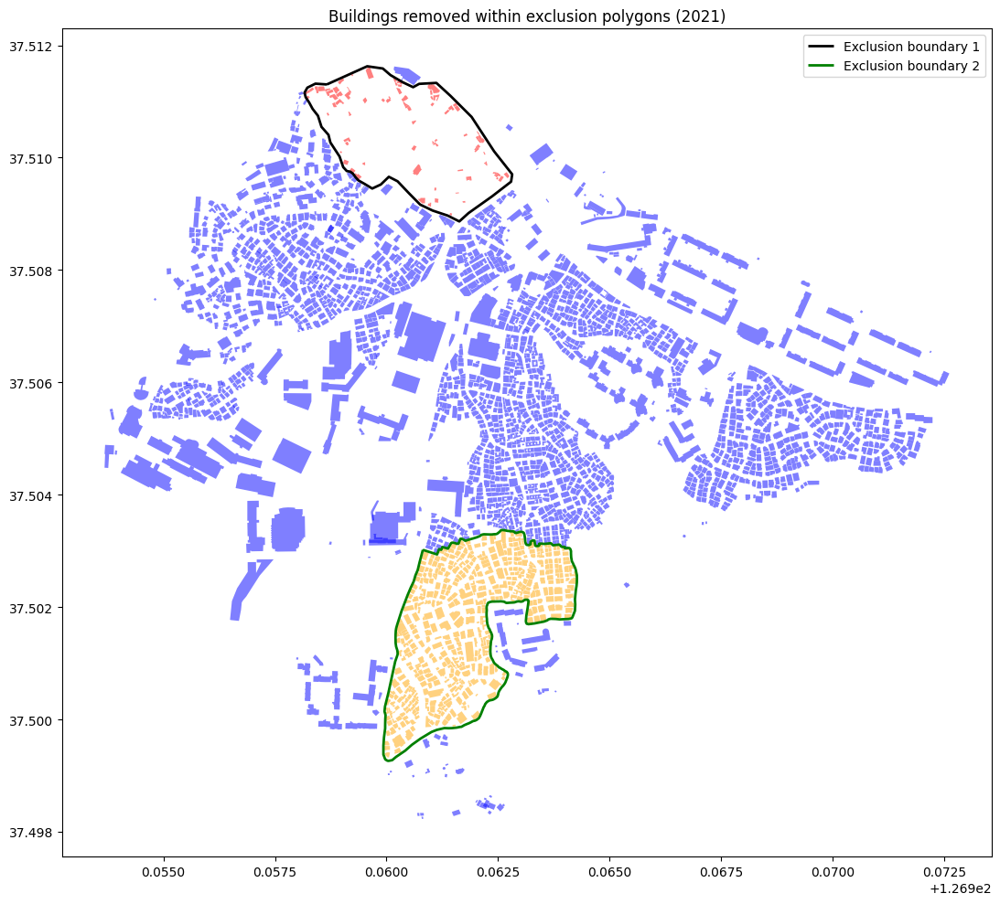

In [66]:
# Load the two exclusion polygon files
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg"
polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg"

exclusion_polygon_1 = gpd.read_file(polygon_path_1)
exclusion_polygon_2 = gpd.read_file(polygon_path_2)

# Display basic information
print(f"2021 Shapefile: {len(흑석동_1st_2021)} buildings")
print(f"First exclusion polygon file: {len(exclusion_polygon_1)} features")
print(f"Second exclusion polygon file: {len(exclusion_polygon_2)} features")

# Create a copy of the building data
흑석동_2nd_2021 = 흑석동_1st_2021.copy()

# Make sure all datasets have the same CRS
if 흑석동_2nd_2021.crs != exclusion_polygon_1.crs:
    print(f"Converting buildings CRS to match first exclusion polygon")
    흑석동_2nd_2021 = 흑석동_2nd_2021.to_crs(exclusion_polygon_1.crs)

if exclusion_polygon_2.crs != exclusion_polygon_1.crs:
    print(f"Converting second exclusion polygon CRS to match first")
    exclusion_polygon_2 = exclusion_polygon_2.to_crs(exclusion_polygon_1.crs)

# Process each exclusion polygon separately
# First, handle exclusion_polygon_1
print("Processing the first exclusion polygon...")
# Dissolve multiple polygons within the first file if needed
if len(exclusion_polygon_1) > 1:
    exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
    print(f"Dissolved {len(exclusion_polygon_1)} polygons into 1 for the first exclusion area")
else:
    exclusion_area_1 = exclusion_polygon_1

# Find buildings that intersect with the first exclusion polygon
intersects_mask_1 = 흑석동_2nd_2021.geometry.intersects(exclusion_area_1.geometry.iloc[0])
buildings_to_remove_1 = 흑석동_2nd_2021[intersects_mask_1].copy()
흑석동_2nd_2021 = 흑석동_2nd_2021[~intersects_mask_1].copy()
print(f"Removed {len(buildings_to_remove_1)} buildings using the first exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2021)}")

# Next, handle exclusion_polygon_2
print("Processing the second exclusion polygon...")
# Dissolve multiple polygons within the second file if needed
if len(exclusion_polygon_2) > 1:
    exclusion_area_2 = gpd.GeoDataFrame(geometry=[exclusion_polygon_2.unary_union], crs=exclusion_polygon_2.crs)
    print(f"Dissolved {len(exclusion_polygon_2)} polygons into 1 for the second exclusion area")
else:
    exclusion_area_2 = exclusion_polygon_2

# Find buildings that intersect with the second exclusion polygon
intersects_mask_2 = 흑석동_2nd_2021.geometry.intersects(exclusion_area_2.geometry.iloc[0])
buildings_to_remove_2 = 흑석동_2nd_2021[intersects_mask_2].copy()
흑석동_2nd_2021 = 흑석동_2nd_2021[~intersects_mask_2].copy()
print(f"Removed {len(buildings_to_remove_2)} buildings using the second exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2021)}")

# Combine the removed buildings for visualization
all_removed = pd.concat([buildings_to_remove_1, buildings_to_remove_2], ignore_index=True)
print(f"Total buildings removed: {len(all_removed)}")

# Visualize the results with both exclusion polygons
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2021.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')
buildings_to_remove_1.plot(ax=ax, color='red', alpha=0.5, label='Removed by polygon 1')
buildings_to_remove_2.plot(ax=ax, color='orange', alpha=0.5, label='Removed by polygon 2')
exclusion_area_1.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary 1')
exclusion_area_2.boundary.plot(ax=ax, color='green', linewidth=2, label='Exclusion boundary 2')
plt.legend()
plt.title('Buildings removed within exclusion polygons (2021)')
plt.tight_layout()
plt.show()

In [67]:
흑석동_3rd_2021 = 흑석동_2nd_2021.copy()

흑석동_3rd_2021 = 흑석동_3rd_2021.to_crs(흑석동_1st_2021.crs)

columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2021.columns:
        흑석동_3rd_2021[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2020 = {}
for idx, row in 흑석동_final_2020.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2020[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2021.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2020:
        matched_buildings += 1
        building_2020 = buildings_2020[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2020 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2021.at[idx, col] = building_2020[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2021 that match with 2020 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2020 data")


Found 2315 buildings in 2021 that match with 2020 data
Update statistics:
GFA (m2): 439 values transferred from 2020 data
Height (m): 1762 values transferred from 2020 data
Building footprint (m2): 431 values transferred from 2020 data
Plot area (m2): 1316 values transferred from 2020 data
floors: 2315 values transferred from 2020 data
Building to land ratio (%): 1271 values transferred from 2020 data


In [68]:
흑석동_with_additions_2021 = 흑석동_3rd_2021.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2021 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',

    # 아크로리버하임
    '1159010500101580001016570',
    '1159010500101580001016572',
    '1159010500101580001016573',
    '1159010500101580001016574',
    '1159010500101580001016575',
    '1159010500101580001016576',
    '1159010500101580001016577',
    '1159010500101580001016571',
    '1159010500101580001016578',
    '1159010500101580001016579',
    '1159010500103410003000001',
    '1159010500101580001016580',
    '1159010500101580001016581',
    '1159010500101580001016582',
    '1159010500101580001016583',
    '1159010500101730052017713',
    '1159010500101580001016584',
    '1159010500101580001016585',
    '1159010500101580001016586',
    '1159010500101580001016587',
    '1159010500101580001016588',
    '1159010500101580001016589',

    # 롯데캐슬에듀포레
    '1159010500102320055017114',
    '1159010500102320055017115',
    '1159010500102320055017116',
    '1159010500102320055017117',
    '1159010500102320055017118',
    '1159010500102320055017112',
    '1159010500102320055017113'
]

# Only run this if there are buildings to add
if buildings_to_add_2021:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2021)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2021)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2021.columns:
                흑석동_with_additions_2021[col] = None
        
        if 'floors' not in 흑석동_with_additions_2021.columns:
            흑석동_with_additions_2021['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2019.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2021 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2021.crs)
            흑석동_with_additions_2021 = pd.concat([흑석동_with_additions_2021, new_buildings_gdf_2019], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2021.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2021['Calculated Area'])
                흑석동_with_additions_2021.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2021.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 58 out of 58 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500101580001016584
Prepared building with GIS ID: 1159010500101580001016588
Prepared building with GIS ID: 1159010500101580001016587
Prepared building with GIS ID: 1159010500102320055017116
Prepared building with GIS ID: 1159010500101580001016570
Prepared building with GIS ID: 1159010500101580001016579
Prepared building with GIS ID: 1159010500101580001016580
Prepared building with GIS ID: 1159010500101580001016581
Prepared building with GIS ID: 1159010500101580001016577
Prepared building with GIS ID: 1159010500102320055017114
Prepared building with GIS ID: 1159010500102320055017115
Prepared building with GIS ID: 1159010500102320055017118
Prepared building with GIS ID: 1159010500101580001016585
Prepared building with GIS ID: 1159010500101580001016586
Prepared building with GIS ID: 1159010500101580001016573
Prepared building with GIS ID: 1159010500101580001016571
Prepared building with GIS ID: 115901050010232

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/995617620.py:137: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2021 = pd.concat([흑석동_with_additions_2021, new_buildings_gdf_2019], ignore_index=True)


In [69]:
# Create a copy to apply assumptions
흑석동_5th_2021 = 흑석동_with_additions_2021.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_5th_2021.columns:
        흑석동_5th_2021[col] = pd.to_numeric(흑석동_5th_2021[col], errors='coerce')
        흑석동_5th_2021[col] = 흑석동_5th_2021[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_5th_2021.columns:
    흑석동_5th_2021['Building to land ratio (%)'] = pd.to_numeric(흑석동_5th_2021['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_5th_2021.loc[흑석동_5th_2021['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_5th_2021['Building footprint (m2)'] == 0) & (흑석동_5th_2021['Calculated Area'] > 0)
흑석동_5th_2021.loc[mask, 'Building footprint (m2)'] = 흑석동_5th_2021.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_5th_2021['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_5th_2021['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_5th_2021['Calculated Area'] >= 30) & (흑석동_5th_2021['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_5th_2021['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_5th_2021.loc[small_buildings_mask, 'floors'] = 2
흑석동_5th_2021.loc[medium_buildings_mask, 'floors'] = 3
흑석동_5th_2021.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_5th_2021['GFA (m2)'] == 0) & 
                     (흑석동_5th_2021['Building footprint (m2)'] > 0) & 
                     (흑석동_5th_2021['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_5th_2021['Height (m)'] == 0) & 
                     (흑석동_5th_2021['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_5th_2021['Plot area (m2)'] == 0) & 
                     (흑석동_5th_2021['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_5th_2021.loc[mask, rel['target']] = rel['formula'](흑석동_5th_2021.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_5th_2021[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_5th_2021)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.43%
Updated 0 building footprints using calculated area
Set floors = 2 for 0 small buildings (area < 30 m²)
Set floors = 3 for 0 medium buildings (area 30-100 m²)
Set floors = 4 for 0 large buildings (area >= 100 m²)
Updated 58 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)


Saved final 2021 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2021.shp


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1614428856.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2021.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distri

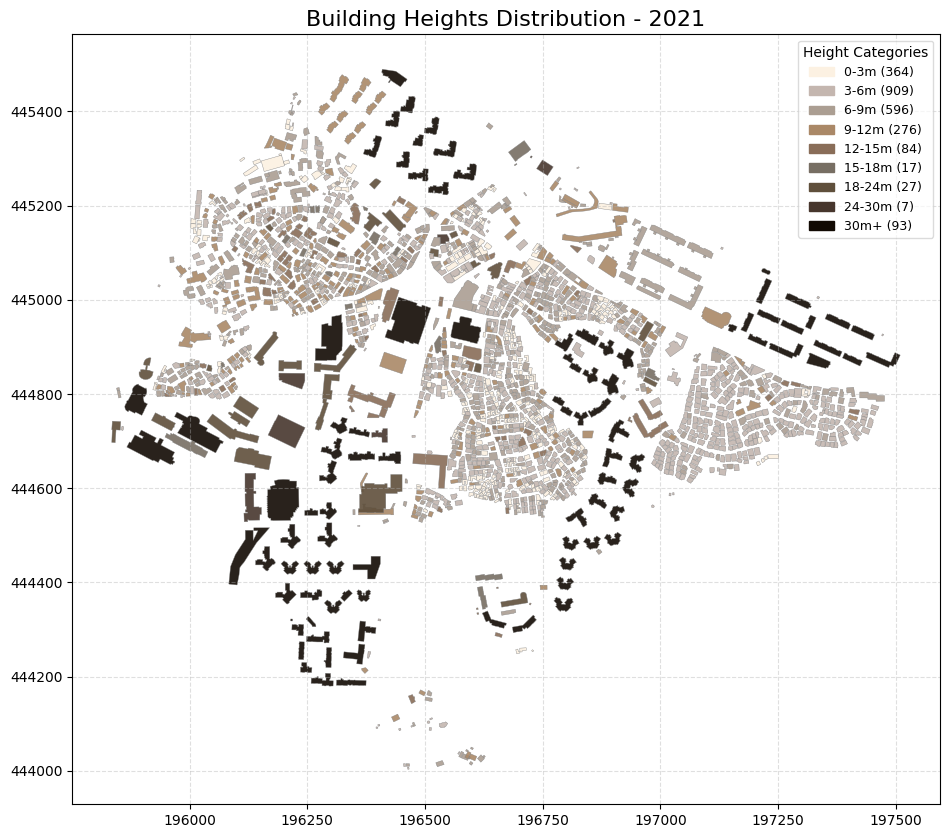

In [70]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2021.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2021 = 흑석동_5th_2021.copy()
흑석동_final_2021.to_file(output_path)
print(f"Saved final 2021 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2021['Height (m)'] = pd.to_numeric(흑석동_final_2021['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2021['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2021['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2021[흑석동_final_2021['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2021', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2021.png'), dpi=300, bbox_inches='tight')
plt.show()

In [71]:
len(흑석동_final_2021)

2373

## Shapefile 2022

In [73]:
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg" 
exclusion_polygon_2022_1 = gpd.read_file(polygon_path)

polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg" 
exclusion_polygon_2022_2 = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2022 Shapefile: {len(흑석동_1st_2022)} buildings")
print(f"2021 Shapefile: {len(흑석동_final_2021)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon_2022_1) + len(exclusion_polygon_2022_2)} features")

2022 Shapefile: 2953 buildings
2021 Shapefile: 2373 buildings
Exclusion polygon file loaded with 4 features


In [74]:
흑석동_1st_2022['Calculated Area'] = 흑석동_1st_2022['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2022['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2022 = 흑석동_1st_2022[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2022)}")

Removed 133 buildings with area < 10 sq meters
Remaining buildings: 2820


2022 Shapefile: 2820 buildings
First exclusion polygon file: 2 features
Second exclusion polygon file: 1 features
Converting buildings CRS to match first exclusion polygon
Processing the first exclusion polygon...
Dissolved 2 polygons into 1 for the first exclusion area
Removed 5 buildings using the first exclusion polygon
Remaining buildings: 2815
Processing the second exclusion polygon...
Removed 514 buildings using the second exclusion polygon
Remaining buildings: 2301
Total buildings removed: 519


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1566681473.py:30: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1566681473.py:69: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


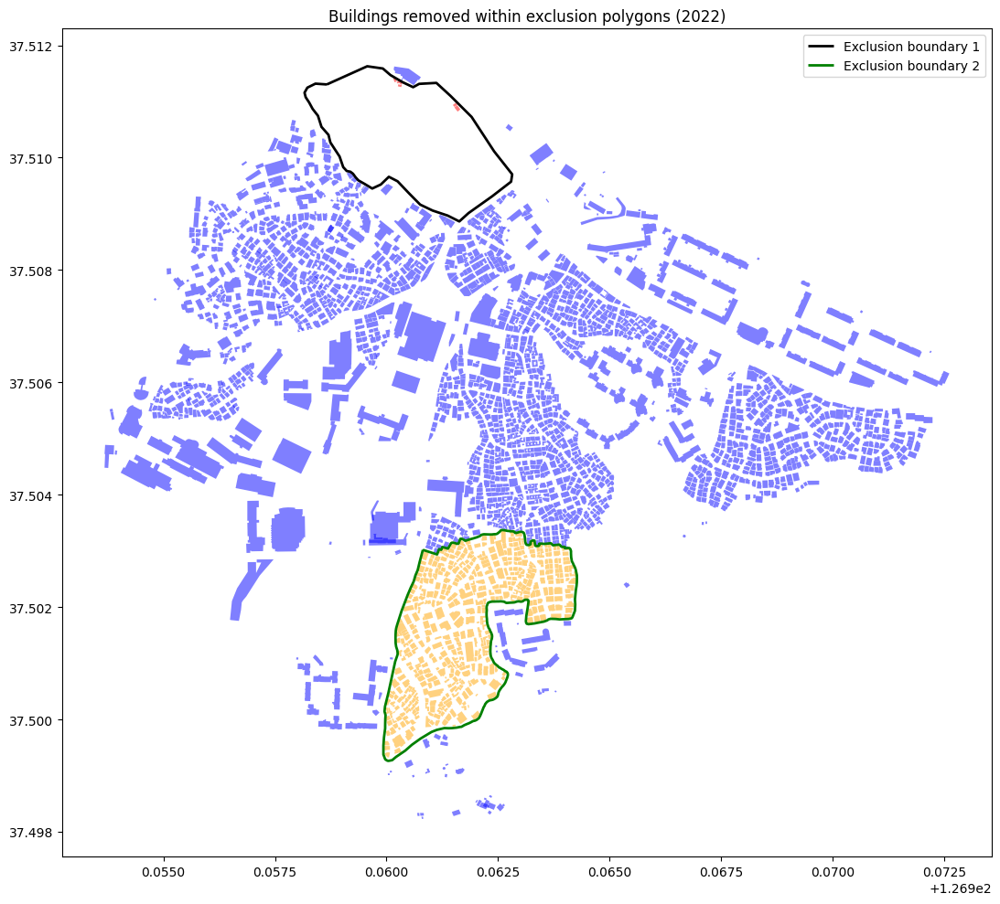

In [75]:
# Load the two exclusion polygon files
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg"
polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg"

exclusion_polygon_1 = gpd.read_file(polygon_path_1)
exclusion_polygon_2 = gpd.read_file(polygon_path_2)

# Display basic information
print(f"2022 Shapefile: {len(흑석동_1st_2022)} buildings")
print(f"First exclusion polygon file: {len(exclusion_polygon_1)} features")
print(f"Second exclusion polygon file: {len(exclusion_polygon_2)} features")

# Create a copy of the building data
흑석동_2nd_2022 = 흑석동_1st_2022.copy()

# Make sure all datasets have the same CRS
if 흑석동_2nd_2022.crs != exclusion_polygon_1.crs:
    print(f"Converting buildings CRS to match first exclusion polygon")
    흑석동_2nd_2022 = 흑석동_2nd_2022.to_crs(exclusion_polygon_1.crs)

if exclusion_polygon_2.crs != exclusion_polygon_1.crs:
    print(f"Converting second exclusion polygon CRS to match first")
    exclusion_polygon_2 = exclusion_polygon_2.to_crs(exclusion_polygon_1.crs)

# Process each exclusion polygon separately
# First, handle exclusion_polygon_1
print("Processing the first exclusion polygon...")
# Dissolve multiple polygons within the first file if needed
if len(exclusion_polygon_1) > 1:
    exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
    print(f"Dissolved {len(exclusion_polygon_1)} polygons into 1 for the first exclusion area")
else:
    exclusion_area_1 = exclusion_polygon_1

# Find buildings that intersect with the first exclusion polygon
intersects_mask_1 = 흑석동_2nd_2022.geometry.intersects(exclusion_area_1.geometry.iloc[0])
buildings_to_remove_1 = 흑석동_2nd_2022[intersects_mask_1].copy()
흑석동_2nd_2022 = 흑석동_2nd_2022[~intersects_mask_1].copy()
print(f"Removed {len(buildings_to_remove_1)} buildings using the first exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2022)}")

# Next, handle exclusion_polygon_2
print("Processing the second exclusion polygon...")
# Dissolve multiple polygons within the second file if needed
if len(exclusion_polygon_2) > 1:
    exclusion_area_2 = gpd.GeoDataFrame(geometry=[exclusion_polygon_2.unary_union], crs=exclusion_polygon_2.crs)
    print(f"Dissolved {len(exclusion_polygon_2)} polygons into 1 for the second exclusion area")
else:
    exclusion_area_2 = exclusion_polygon_2

# Find buildings that intersect with the second exclusion polygon
intersects_mask_2 = 흑석동_2nd_2022.geometry.intersects(exclusion_area_2.geometry.iloc[0])
buildings_to_remove_2 = 흑석동_2nd_2022[intersects_mask_2].copy()
흑석동_2nd_2022 = 흑석동_2nd_2022[~intersects_mask_2].copy()
print(f"Removed {len(buildings_to_remove_2)} buildings using the second exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2022)}")

# Combine the removed buildings for visualization
all_removed = pd.concat([buildings_to_remove_1, buildings_to_remove_2], ignore_index=True)
print(f"Total buildings removed: {len(all_removed)}")

# Visualize the results with both exclusion polygons
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2022.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')
buildings_to_remove_1.plot(ax=ax, color='red', alpha=0.5, label='Removed by polygon 1')
buildings_to_remove_2.plot(ax=ax, color='orange', alpha=0.5, label='Removed by polygon 2')
exclusion_area_1.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary 1')
exclusion_area_2.boundary.plot(ax=ax, color='green', linewidth=2, label='Exclusion boundary 2')
plt.legend()
plt.title('Buildings removed within exclusion polygons (2022)')
plt.tight_layout()
plt.show()

In [76]:
흑석동_3rd_2022 = 흑석동_2nd_2022.copy()

흑석동_3rd_2022 = 흑석동_3rd_2022.to_crs(흑석동_1st_2022.crs)

columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2022.columns:
        흑석동_3rd_2022[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2021 = {}
for idx, row in 흑석동_final_2021.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2021[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2022.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2021:
        matched_buildings += 1
        building_2021 = buildings_2021[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2021 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2022.at[idx, col] = building_2021[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2022 that match with 2021 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2021 data")


Found 2301 buildings in 2022 that match with 2021 data
Update statistics:
GFA (m2): 427 values transferred from 2021 data
Height (m): 1748 values transferred from 2021 data
Building footprint (m2): 420 values transferred from 2021 data
Plot area (m2): 1303 values transferred from 2021 data
floors: 2301 values transferred from 2021 data
Building to land ratio (%): 1257 values transferred from 2021 data


In [77]:
흑석동_with_additions_2022 = 흑석동_3rd_2022.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2022 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',

    # 아크로리버하임
    '1159010500101580001016570',
    '1159010500101580001016572',
    '1159010500101580001016573',
    '1159010500101580001016574',
    '1159010500101580001016575',
    '1159010500101580001016576',
    '1159010500101580001016577',
    '1159010500101580001016571',
    '1159010500101580001016578',
    '1159010500101580001016579',
    '1159010500103410003000001',
    '1159010500101580001016580',
    '1159010500101580001016581',
    '1159010500101580001016582',
    '1159010500101580001016583',
    '1159010500101730052017713',
    '1159010500101580001016584',
    '1159010500101580001016585',
    '1159010500101580001016586',
    '1159010500101580001016587',
    '1159010500101580001016588',
    '1159010500101580001016589',

    # 롯데캐슬에듀포레
    '1159010500102320055017114',
    '1159010500102320055017115',
    '1159010500102320055017116',
    '1159010500102320055017117',
    '1159010500102320055017118',
    '1159010500102320055017112',
    '1159010500102320055017113',

    # 흑석자이
    '1159010500102530089016058',
    '1159010500102530089016059',
    '1159010500102530089016056',
    '1159010500102530089016057',
    '1159010500102530089016054',
    '1159010500102530089016055',
    '1159010500102530089016052',
    '1159010500102530089016053',
    '1159010500102530089016051',
    '1159010500102530089016050',
    '1159010500102530089016049',
    '1159010500102530089016048',
    '1159010500102530089016042',
    '1159010500100760073014227',
    '1159010500102530089016047',
    '1159010500102530089016046',
    '1159010500102530089016045',
    '1159010500102530089016044',
    '1159010500102530089016043',
    '1159010500102530089016041',
    '1159010500102530089016040',
    '1159010500102530089016039',
    '1159010500102530089016038',
    '1159010500102530089016037',
    '1159010500102530089016036',
    '1159010500102530089016034',
    '1159010500102530089016035',
    '1159010500102570008018161'
]

# Only run this if there are buildings to add
if buildings_to_add_2022:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2022)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2022)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2022.columns:
                흑석동_with_additions_2022[col] = None
        
        if 'floors' not in 흑석동_with_additions_2022.columns:
            흑석동_with_additions_2022['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2022.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2022 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2022.crs)
            흑석동_with_additions_2022 = pd.concat([흑석동_with_additions_2022, new_buildings_gdf_2022], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2022.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2022['Calculated Area'])
                흑석동_with_additions_2022.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2022.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 86 out of 86 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500102530089016045
Prepared building with GIS ID: 1159010500102530089016046
Prepared building with GIS ID: 1159010500102530089016056
Prepared building with GIS ID: 1159010500102530089016039
Prepared building with GIS ID: 1159010500102530089016047
Prepared building with GIS ID: 1159010500102570008018161
Prepared building with GIS ID: 1159010500101580001016584
Prepared building with GIS ID: 1159010500102530089016051
Prepared building with GIS ID: 1159010500100760073014227
Prepared building with GIS ID: 1159010500101580001016588
Prepared building with GIS ID: 1159010500102530089016043
Prepared building with GIS ID: 1159010500102530089016041
Prepared building with GIS ID: 1159010500102530089016034
Prepared building with GIS ID: 1159010500102530089016037
Prepared building with GIS ID: 1159010500102530089016038
Prepared building with GIS ID: 1159010500102530089016036
Prepared building with GIS ID: 115901050010253

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/866336292.py:167: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2022 = pd.concat([흑석동_with_additions_2022, new_buildings_gdf_2022], ignore_index=True)


In [78]:
# Create a copy to apply assumptions
흑석동_5th_2022 = 흑석동_with_additions_2022.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors', 'Building to land ratio (%)']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_5th_2022.columns:
        흑석동_5th_2022[col] = pd.to_numeric(흑석동_5th_2022[col], errors='coerce')
        흑석동_5th_2022[col] = 흑석동_5th_2022[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_5th_2022.columns:
    흑석동_5th_2022['Building to land ratio (%)'] = pd.to_numeric(흑석동_5th_2022['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_5th_2022.loc[흑석동_5th_2022['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_5th_2022['Building footprint (m2)'] == 0) & (흑석동_5th_2022['Calculated Area'] > 0)
흑석동_5th_2022.loc[mask, 'Building footprint (m2)'] = 흑석동_5th_2022.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_5th_2022['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_5th_2022['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_5th_2022['Calculated Area'] >= 30) & (흑석동_5th_2022['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_5th_2022['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_5th_2022.loc[small_buildings_mask, 'floors'] = 2
흑석동_5th_2022.loc[medium_buildings_mask, 'floors'] = 3
흑석동_5th_2022.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_5th_2022['GFA (m2)'] == 0) & 
                     (흑석동_5th_2022['Building footprint (m2)'] > 0) & 
                     (흑석동_5th_2022['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_5th_2022['Height (m)'] == 0) & 
                     (흑석동_5th_2022['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_5th_2022['Plot area (m2)'] == 0) & 
                     (흑석동_5th_2022['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_5th_2022.loc[mask, rel['target']] = rel['formula'](흑석동_5th_2022.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_5th_2022[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_5th_2022)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.43%
Updated 0 building footprints using calculated area
Set floors = 2 for 0 small buildings (area < 30 m²)
Set floors = 3 for 0 medium buildings (area 30-100 m²)
Set floors = 4 for 0 large buildings (area >= 100 m²)
Updated 79 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)
Building to land ratio (%): 1271 buildings (53.25%)


Saved final 2021 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2022.shp


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/2760999332.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2022.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distri

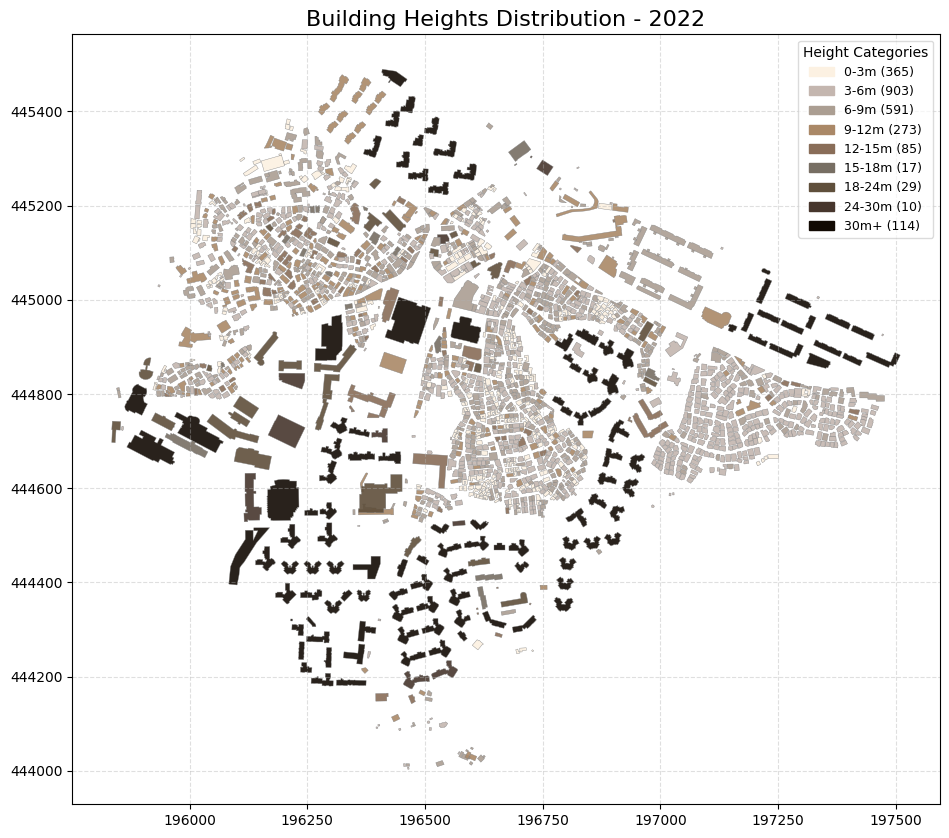

In [79]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2022.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2022 = 흑석동_5th_2022.copy()
흑석동_final_2022.to_file(output_path)
print(f"Saved final 2021 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2022['Height (m)'] = pd.to_numeric(흑석동_final_2022['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2022['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2022['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2022[흑석동_final_2022['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2022', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2022.png'), dpi=300, bbox_inches='tight')
plt.show()

In [80]:
len(흑석동_final_2022)

2387

## Shapefile 2023

In [82]:
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg" 
exclusion_polygon_2023_1 = gpd.read_file(polygon_path)

polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg" 
exclusion_polygon_2023_2 = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2023 Shapefile: {len(흑석동_1st_2023)} buildings")
print(f"2022 Shapefile: {len(흑석동_final_2022)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon_2023_1) + len(exclusion_polygon_2023_2)} features")

2023 Shapefile: 2954 buildings
2022 Shapefile: 2387 buildings
Exclusion polygon file loaded with 4 features


In [83]:
흑석동_1st_2023['Calculated Area'] = 흑석동_1st_2023['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2023['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2023 = 흑석동_1st_2023[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2023)}")

Removed 133 buildings with area < 10 sq meters
Remaining buildings: 2821


2022 Shapefile: 2821 buildings
First exclusion polygon file: 2 features
Second exclusion polygon file: 1 features
Converting buildings CRS to match first exclusion polygon
Processing the first exclusion polygon...
Dissolved 2 polygons into 1 for the first exclusion area
Removed 5 buildings using the first exclusion polygon
Remaining buildings: 2816
Processing the second exclusion polygon...
Removed 514 buildings using the second exclusion polygon
Remaining buildings: 2302
Total buildings removed: 519


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/89468195.py:30: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/89468195.py:69: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


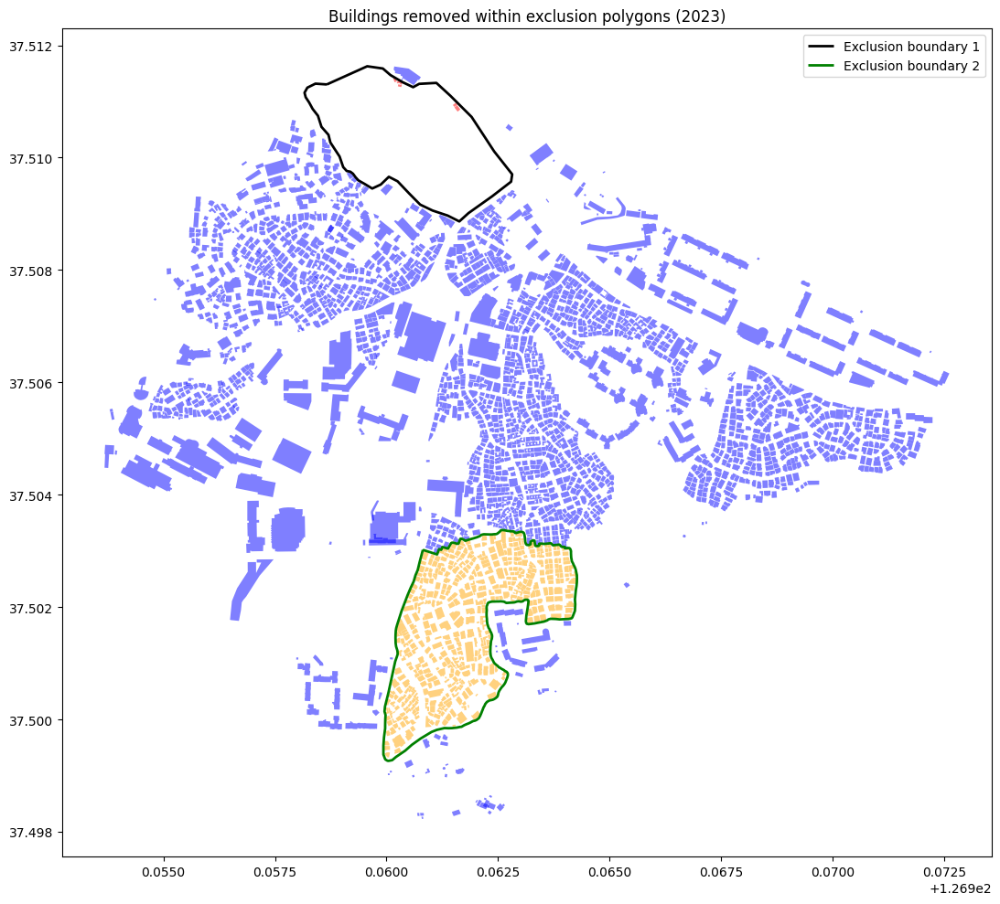

In [84]:
# Load the two exclusion polygon files
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg"
polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg"

exclusion_polygon_1 = gpd.read_file(polygon_path_1)
exclusion_polygon_2 = gpd.read_file(polygon_path_2)

# Display basic information
print(f"2022 Shapefile: {len(흑석동_1st_2023)} buildings")
print(f"First exclusion polygon file: {len(exclusion_polygon_1)} features")
print(f"Second exclusion polygon file: {len(exclusion_polygon_2)} features")

# Create a copy of the building data
흑석동_2nd_2023 = 흑석동_1st_2023.copy()

# Make sure all datasets have the same CRS
if 흑석동_2nd_2023.crs != exclusion_polygon_1.crs:
    print(f"Converting buildings CRS to match first exclusion polygon")
    흑석동_2nd_2023 = 흑석동_2nd_2023.to_crs(exclusion_polygon_1.crs)

if exclusion_polygon_2.crs != exclusion_polygon_1.crs:
    print(f"Converting second exclusion polygon CRS to match first")
    exclusion_polygon_2 = exclusion_polygon_2.to_crs(exclusion_polygon_1.crs)

# Process each exclusion polygon separately
# First, handle exclusion_polygon_1
print("Processing the first exclusion polygon...")
# Dissolve multiple polygons within the first file if needed
if len(exclusion_polygon_1) > 1:
    exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.unary_union], crs=exclusion_polygon_1.crs)
    print(f"Dissolved {len(exclusion_polygon_1)} polygons into 1 for the first exclusion area")
else:
    exclusion_area_1 = exclusion_polygon_1

# Find buildings that intersect with the first exclusion polygon
intersects_mask_1 = 흑석동_2nd_2023.geometry.intersects(exclusion_area_1.geometry.iloc[0])
buildings_to_remove_1 = 흑석동_2nd_2023[intersects_mask_1].copy()
흑석동_2nd_2023 = 흑석동_2nd_2023[~intersects_mask_1].copy()
print(f"Removed {len(buildings_to_remove_1)} buildings using the first exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2023)}")

# Next, handle exclusion_polygon_2
print("Processing the second exclusion polygon...")
# Dissolve multiple polygons within the second file if needed
if len(exclusion_polygon_2) > 1:
    exclusion_area_2 = gpd.GeoDataFrame(geometry=[exclusion_polygon_2.unary_union], crs=exclusion_polygon_2.crs)
    print(f"Dissolved {len(exclusion_polygon_2)} polygons into 1 for the second exclusion area")
else:
    exclusion_area_2 = exclusion_polygon_2

# Find buildings that intersect with the second exclusion polygon
intersects_mask_2 = 흑석동_2nd_2023.geometry.intersects(exclusion_area_2.geometry.iloc[0])
buildings_to_remove_2 = 흑석동_2nd_2023[intersects_mask_2].copy()
흑석동_2nd_2023 = 흑석동_2nd_2023[~intersects_mask_2].copy()
print(f"Removed {len(buildings_to_remove_2)} buildings using the second exclusion polygon")
print(f"Remaining buildings: {len(흑석동_2nd_2023)}")

# Combine the removed buildings for visualization
all_removed = pd.concat([buildings_to_remove_1, buildings_to_remove_2], ignore_index=True)
print(f"Total buildings removed: {len(all_removed)}")

# Visualize the results with both exclusion polygons
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2023.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')
buildings_to_remove_1.plot(ax=ax, color='red', alpha=0.5, label='Removed by polygon 1')
buildings_to_remove_2.plot(ax=ax, color='orange', alpha=0.5, label='Removed by polygon 2')
exclusion_area_1.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary 1')
exclusion_area_2.boundary.plot(ax=ax, color='green', linewidth=2, label='Exclusion boundary 2')
plt.legend()
plt.title('Buildings removed within exclusion polygons (2023)')
plt.tight_layout()
plt.show()

In [85]:
흑석동_3rd_2023 = 흑석동_2nd_2023.copy()

흑석동_3rd_2023 = 흑석동_3rd_2023.to_crs(흑석동_1st_2023.crs)

columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2023.columns:
        흑석동_3rd_2023[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2022 = {}
for idx, row in 흑석동_final_2022.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2022[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2023.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2022:
        matched_buildings += 1
        building_2022 = buildings_2022[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2022 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2023.at[idx, col] = building_2022[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2023 that match with 2022 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2022 data")


Found 2298 buildings in 2023 that match with 2022 data
Update statistics:
GFA (m2): 426 values transferred from 2022 data
Height (m): 1745 values transferred from 2022 data
Building footprint (m2): 418 values transferred from 2022 data
Plot area (m2): 1301 values transferred from 2022 data
floors: 2298 values transferred from 2022 data
Building to land ratio (%): 1254 values transferred from 2022 data


In [86]:
흑석동_with_additions_2023 = 흑석동_3rd_2023.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2023 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',

    # 아크로리버하임
    '1159010500101580001016570',
    '1159010500101580001016572',
    '1159010500101580001016573',
    '1159010500101580001016574',
    '1159010500101580001016575',
    '1159010500101580001016576',
    '1159010500101580001016577',
    '1159010500101580001016571',
    '1159010500101580001016578',
    '1159010500101580001016579',
    '1159010500103410003000001',
    '1159010500101580001016580',
    '1159010500101580001016581',
    '1159010500101580001016582',
    '1159010500101580001016583',
    '1159010500101730052017713',
    '1159010500101580001016584',
    '1159010500101580001016585',
    '1159010500101580001016586',
    '1159010500101580001016587',
    '1159010500101580001016588',
    '1159010500101580001016589',

    # 롯데캐슬에듀포레
    '1159010500102320055017114',
    '1159010500102320055017115',
    '1159010500102320055017116',
    '1159010500102320055017117',
    '1159010500102320055017118',
    '1159010500102320055017112',
    '1159010500102320055017113',

    # 흑석자이
    '1159010500102530089016058',
    '1159010500102530089016059',
    '1159010500102530089016056',
    '1159010500102530089016057',
    '1159010500102530089016054',
    '1159010500102530089016055',
    '1159010500102530089016052',
    '1159010500102530089016053',
    '1159010500102530089016051',
    '1159010500102530089016050',
    '1159010500102530089016049',
    '1159010500102530089016048',
    '1159010500102530089016042',
    '1159010500100760073014227',
    '1159010500102530089016047',
    '1159010500102530089016046',
    '1159010500102530089016045',
    '1159010500102530089016044',
    '1159010500102530089016043',
    '1159010500102530089016041',
    '1159010500102530089016040',
    '1159010500102530089016039',
    '1159010500102530089016038',
    '1159010500102530089016037',
    '1159010500102530089016036',
    '1159010500102530089016034',
    '1159010500102530089016035',
    '1159010500102570008018161'
]

# Only run this if there are buildings to add
if buildings_to_add_2023:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2023)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2023)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2023.columns:
                흑석동_with_additions_2023[col] = None
        
        if 'floors' not in 흑석동_with_additions_2023.columns:
            흑석동_with_additions_2023['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2023.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2023 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2023.crs)
            흑석동_with_additions_2023 = pd.concat([흑석동_with_additions_2023, new_buildings_gdf_2023], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2023.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2023['Calculated Area'])
                흑석동_with_additions_2023.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2023.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 86 out of 86 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500102530089016045
Prepared building with GIS ID: 1159010500102530089016046
Prepared building with GIS ID: 1159010500102530089016056
Prepared building with GIS ID: 1159010500102530089016039
Prepared building with GIS ID: 1159010500102530089016047
Prepared building with GIS ID: 1159010500102570008018161
Prepared building with GIS ID: 1159010500101580001016584
Prepared building with GIS ID: 1159010500102530089016051
Prepared building with GIS ID: 1159010500100760073014227
Prepared building with GIS ID: 1159010500101580001016588
Prepared building with GIS ID: 1159010500102530089016043
Prepared building with GIS ID: 1159010500102530089016041
Prepared building with GIS ID: 1159010500102530089016034
Prepared building with GIS ID: 1159010500102530089016037
Prepared building with GIS ID: 1159010500102530089016038
Prepared building with GIS ID: 1159010500102530089016036
Prepared building with GIS ID: 115901050010253

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/863921823.py:167: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2023 = pd.concat([흑석동_with_additions_2023, new_buildings_gdf_2023], ignore_index=True)


In [87]:
# Create a copy to apply assumptions
흑석동_5th_2023 = 흑석동_with_additions_2023.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors', 'Building to land ratio (%)']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_5th_2023.columns:
        흑석동_5th_2023[col] = pd.to_numeric(흑석동_5th_2023[col], errors='coerce')
        흑석동_5th_2023[col] = 흑석동_5th_2023[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_5th_2023.columns:
    흑석동_5th_2023['Building to land ratio (%)'] = pd.to_numeric(흑석동_5th_2023['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_5th_2023.loc[흑석동_5th_2023['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_5th_2023['Building footprint (m2)'] == 0) & (흑석동_5th_2023['Calculated Area'] > 0)
흑석동_5th_2023.loc[mask, 'Building footprint (m2)'] = 흑석동_5th_2023.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_5th_2023['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_5th_2023['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_5th_2023['Calculated Area'] >= 30) & (흑석동_5th_2023['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_5th_2023['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_5th_2023.loc[small_buildings_mask, 'floors'] = 2
흑석동_5th_2023.loc[medium_buildings_mask, 'floors'] = 3
흑석동_5th_2023.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_5th_2023['GFA (m2)'] == 0) & 
                     (흑석동_5th_2023['Building footprint (m2)'] > 0) & 
                     (흑석동_5th_2023['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_5th_2023['Height (m)'] == 0) & 
                     (흑석동_5th_2023['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_5th_2023['Plot area (m2)'] == 0) & 
                     (흑석동_5th_2023['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_5th_2023.loc[mask, rel['target']] = rel['formula'](흑석동_5th_2023.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_5th_2023[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_5th_2023)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.45%
Updated 3 building footprints using calculated area
Set floors = 2 for 2 small buildings (area < 30 m²)
Set floors = 3 for 2 medium buildings (area 30-100 m²)
Set floors = 4 for 0 large buildings (area >= 100 m²)
Updated 2 rows for GFA (m2) using relationship
Updated 4 rows for Height (m) using relationship
Updated 83 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)
Building to land ratio (%): 1271 buildings (53.22%)


Saved final 2021 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2023.shp


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/225135954.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2023.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distric

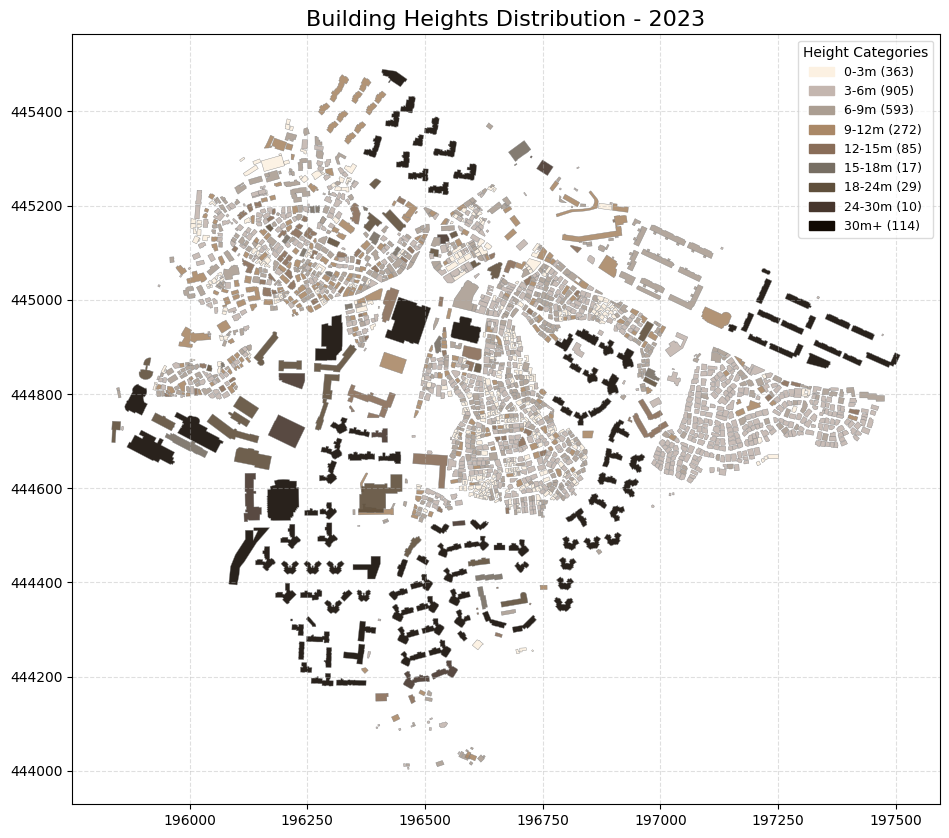

In [88]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2023.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2023 = 흑석동_5th_2023.copy()
흑석동_final_2023.to_file(output_path)
print(f"Saved final 2021 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2023['Height (m)'] = pd.to_numeric(흑석동_final_2023['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2023['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2023['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2023[흑석동_final_2023['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2023', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2023.png'), dpi=300, bbox_inches='tight')
plt.show()

In [89]:
len(흑석동_final_2023)

2388

## Shapefile 2024

In [91]:
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg" 
exclusion_polygon_2024_1 = gpd.read_file(polygon_path)

polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2024 Remove area 3.gpkg" 
exclusion_polygon_2024_2 = gpd.read_file(polygon_path)

# Display basic information about the loaded files
print(f"2024 Shapefile: {len(흑석동_1st_2024)} buildings")
print(f"2023 Shapefile: {len(흑석동_final_2023)} buildings")
print(f"Exclusion polygon file loaded with {len(exclusion_polygon_2024_1) + len(exclusion_polygon_2024_2)} features")

2024 Shapefile: 3578 buildings
2023 Shapefile: 2388 buildings
Exclusion polygon file loaded with 4 features


In [92]:
흑석동_1st_2024['Calculated Area'] = 흑석동_1st_2024['geometry'].area

# Remove buildings with area less than 10 square meters
small_area_mask = 흑석동_1st_2024['Calculated Area'] < 10
small_buildings = small_area_mask.sum()
흑석동_1st_2024 = 흑석동_1st_2024[~small_area_mask].copy()

print(f"Removed {small_buildings} buildings with area < 10 sq meters")
print(f"Remaining buildings: {len(흑석동_1st_2024)}")

Removed 180 buildings with area < 10 sq meters
Remaining buildings: 3398


2024 Shapefile: 3398 buildings
First exclusion polygon file: 2 features
Second exclusion polygon file: 1 features
Third exclusion polygon file: 1 features
Converting buildings CRS to match first exclusion polygon
Processing the first exclusion polygon...
Dissolved 2 polygons into 1 for the first exclusion area
Removed 88 buildings using the first exclusion polygon
Processing the second exclusion polygon...
Removed 529 buildings using the second exclusion polygon
Processing the third exclusion polygon...
Removed 414 buildings using the third exclusion polygon
Remaining buildings: 2367
Total buildings removed: 1031


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/1747138625.py:121: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


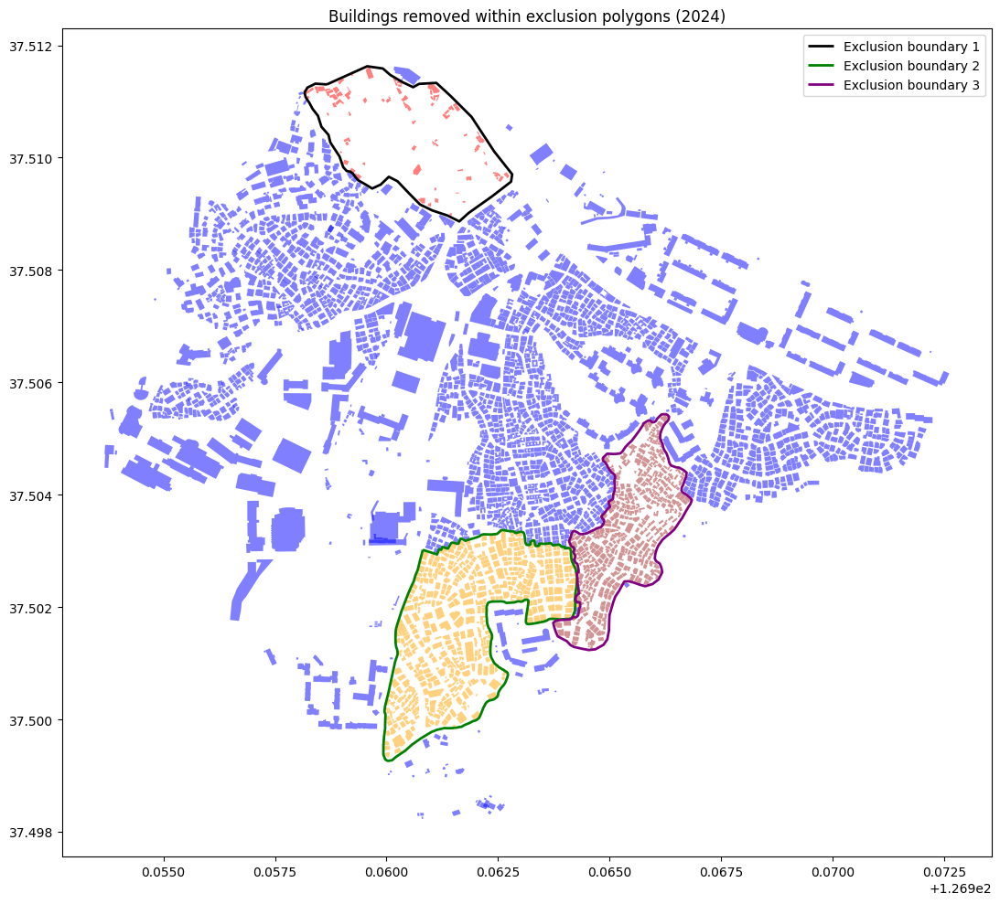

In [93]:
# Load the three exclusion polygon files
polygon_path_1 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2017 Remove area 1.gpkg"
polygon_path_2 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2019 Remove area 3.gpkg"
polygon_path_3 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/2024 Remove area 2.gpkg"

exclusion_polygon_1 = gpd.read_file(polygon_path_1)
exclusion_polygon_2 = gpd.read_file(polygon_path_2)
exclusion_polygon_3 = gpd.read_file(polygon_path_3)

# Display basic information
print(f"2024 Shapefile: {len(흑석동_1st_2024)} buildings")
print(f"First exclusion polygon file: {len(exclusion_polygon_1)} features")
print(f"Second exclusion polygon file: {len(exclusion_polygon_2)} features")
print(f"Third exclusion polygon file: {len(exclusion_polygon_3)} features")

# Create a copy of the building data
흑석동_2nd_2024 = 흑석동_1st_2024.copy()

# Make sure all datasets have the same CRS
if 흑석동_2nd_2024.crs != exclusion_polygon_1.crs:
    print(f"Converting buildings CRS to match first exclusion polygon")
    흑석동_2nd_2024 = 흑석동_2nd_2024.to_crs(exclusion_polygon_1.crs)

if exclusion_polygon_2.crs != exclusion_polygon_1.crs:
    print(f"Converting second exclusion polygon CRS to match first")
    exclusion_polygon_2 = exclusion_polygon_2.to_crs(exclusion_polygon_1.crs)

if exclusion_polygon_3.crs != exclusion_polygon_1.crs:
    print(f"Converting third exclusion polygon CRS to match first")
    exclusion_polygon_3 = exclusion_polygon_3.to_crs(exclusion_polygon_1.crs)

# Process each exclusion polygon separately
# First, handle exclusion_polygon_1
print("Processing the first exclusion polygon...")
if len(exclusion_polygon_1) > 0:
    if len(exclusion_polygon_1) > 1:
        exclusion_area_1 = gpd.GeoDataFrame(geometry=[exclusion_polygon_1.union_all()], crs=exclusion_polygon_1.crs)
        print(f"Dissolved {len(exclusion_polygon_1)} polygons into 1 for the first exclusion area")
    else:
        exclusion_area_1 = exclusion_polygon_1
    
    # Find buildings that intersect with the first exclusion polygon
    intersects_mask_1 = 흑석동_2nd_2024.geometry.intersects(exclusion_area_1.geometry.iloc[0])
    buildings_to_remove_1 = 흑석동_2nd_2024[intersects_mask_1].copy()
    흑석동_2nd_2024 = 흑석동_2nd_2024[~intersects_mask_1].copy()
    print(f"Removed {len(buildings_to_remove_1)} buildings using the first exclusion polygon")
else:
    print("First exclusion polygon file is empty, skipping...")
    buildings_to_remove_1 = gpd.GeoDataFrame(columns=흑석동_2nd_2024.columns, crs=흑석동_2nd_2024.crs)
    exclusion_area_1 = gpd.GeoDataFrame(columns=['geometry'], crs=흑석동_2nd_2024.crs)

# Next, handle exclusion_polygon_2
print("Processing the second exclusion polygon...")
if len(exclusion_polygon_2) > 0:
    if len(exclusion_polygon_2) > 1:
        exclusion_area_2 = gpd.GeoDataFrame(geometry=[exclusion_polygon_2.union_all()], crs=exclusion_polygon_2.crs)
        print(f"Dissolved {len(exclusion_polygon_2)} polygons into 1 for the second exclusion area")
    else:
        exclusion_area_2 = exclusion_polygon_2
    
    # Find buildings that intersect with the second exclusion polygon
    intersects_mask_2 = 흑석동_2nd_2024.geometry.intersects(exclusion_area_2.geometry.iloc[0])
    buildings_to_remove_2 = 흑석동_2nd_2024[intersects_mask_2].copy()
    흑석동_2nd_2024 = 흑석동_2nd_2024[~intersects_mask_2].copy()
    print(f"Removed {len(buildings_to_remove_2)} buildings using the second exclusion polygon")
else:
    print("Second exclusion polygon file is empty, skipping...")
    buildings_to_remove_2 = gpd.GeoDataFrame(columns=흑석동_2nd_2024.columns, crs=흑석동_2nd_2024.crs)
    exclusion_area_2 = gpd.GeoDataFrame(columns=['geometry'], crs=흑석동_2nd_2024.crs)

# Finally, handle exclusion_polygon_3
print("Processing the third exclusion polygon...")
if len(exclusion_polygon_3) > 0:
    if len(exclusion_polygon_3) > 1:
        exclusion_area_3 = gpd.GeoDataFrame(geometry=[exclusion_polygon_3.union_all()], crs=exclusion_polygon_3.crs)
        print(f"Dissolved {len(exclusion_polygon_3)} polygons into 1 for the third exclusion area")
    else:
        exclusion_area_3 = exclusion_polygon_3
    
    # Find buildings that intersect with the third exclusion polygon
    intersects_mask_3 = 흑석동_2nd_2024.geometry.intersects(exclusion_area_3.geometry.iloc[0])
    buildings_to_remove_3 = 흑석동_2nd_2024[intersects_mask_3].copy()
    흑석동_2nd_2024 = 흑석동_2nd_2024[~intersects_mask_3].copy()
    print(f"Removed {len(buildings_to_remove_3)} buildings using the third exclusion polygon")
else:
    print("Third exclusion polygon file is empty, skipping...")
    buildings_to_remove_3 = gpd.GeoDataFrame(columns=흑석동_2nd_2024.columns, crs=흑석동_2nd_2024.crs)
    exclusion_area_3 = gpd.GeoDataFrame(columns=['geometry'], crs=흑석동_2nd_2024.crs)

print(f"Remaining buildings: {len(흑석동_2nd_2024)}")

# Combine the removed buildings for visualization
all_removed_dfs = [buildings_to_remove_1, buildings_to_remove_2, buildings_to_remove_3]
non_empty_dfs = [df for df in all_removed_dfs if len(df) > 0]

if non_empty_dfs:
    all_removed = pd.concat(non_empty_dfs, ignore_index=True)
    print(f"Total buildings removed: {len(all_removed)}")
else:
    all_removed = gpd.GeoDataFrame(columns=흑석동_2nd_2024.columns, crs=흑석동_2nd_2024.crs)
    print("No buildings were removed by any exclusion polygon")

# Visualize the results with all three exclusion polygons
fig, ax = plt.subplots(figsize=(12, 10))
흑석동_2nd_2024.plot(ax=ax, color='blue', alpha=0.5, label='Kept buildings')

if len(buildings_to_remove_1) > 0:
    buildings_to_remove_1.plot(ax=ax, color='red', alpha=0.5, label='Removed by polygon 1')
if len(buildings_to_remove_2) > 0:
    buildings_to_remove_2.plot(ax=ax, color='orange', alpha=0.5, label='Removed by polygon 2')
if len(buildings_to_remove_3) > 0:
    buildings_to_remove_3.plot(ax=ax, color='brown', alpha=0.5, label='Removed by polygon 3')

if len(exclusion_area_1) > 0:
    exclusion_area_1.boundary.plot(ax=ax, color='black', linewidth=2, label='Exclusion boundary 1')
if len(exclusion_area_2) > 0:
    exclusion_area_2.boundary.plot(ax=ax, color='green', linewidth=2, label='Exclusion boundary 2')
if len(exclusion_area_3) > 0:
    exclusion_area_3.boundary.plot(ax=ax, color='purple', linewidth=2, label='Exclusion boundary 3')

plt.legend()
plt.title('Buildings removed within exclusion polygons (2024)')
plt.tight_layout()
plt.show()

In [94]:
흑석동_3rd_2024 = 흑석동_2nd_2024.copy()

흑석동_3rd_2024 = 흑석동_3rd_2024.to_crs(흑석동_1st_2024.crs)

columns_to_transfer = ['GFA (m2)', 'Height (m)', 'Building footprint (m2)', 'Plot area (m2)', 'floors', 'Building to land ratio (%)']

# Ensure all necessary columns exist in 2017 shapefile
for col in columns_to_transfer:
    if col not in 흑석동_3rd_2024.columns:
        흑석동_3rd_2024[col] = 0

# Create a dictionary of 2016 buildings for quick lookup
buildings_2023 = {}
for idx, row in 흑석동_final_2023.iterrows():
    gis_id = row['GIS building identification number']
    if pd.notnull(gis_id):
        buildings_2023[gis_id] = {col: row[col] for col in columns_to_transfer if col in row}

# Keep track of updates
update_counts = {col: 0 for col in columns_to_transfer}
matched_buildings = 0

# Process each 2017 building
for idx, row in 흑석동_3rd_2024.iterrows():
    gis_id = row['GIS building identification number']
    
    # Skip if GIS ID is missing
    if pd.isnull(gis_id):
        continue
    
    # Check if this building exists in 2016 data
    if gis_id in buildings_2023:
        matched_buildings += 1
        building_2023 = buildings_2023[gis_id]
        
        # Transfer values for each column
        for col in columns_to_transfer:
            if col in building_2023 and (pd.isnull(row[col]) or row[col] == 0):
                흑석동_3rd_2024.at[idx, col] = building_2023[col]
                update_counts[col] += 1

# Display update statistics
print(f"\nFound {matched_buildings} buildings in 2024 that match with 2023 data")
print("Update statistics:")
for col, count in update_counts.items():
    print(f"{col}: {count} values transferred from 2023 data")


Found 2299 buildings in 2024 that match with 2023 data
Update statistics:
GFA (m2): 425 values transferred from 2023 data
Height (m): 1746 values transferred from 2023 data
Building footprint (m2): 418 values transferred from 2023 data
Plot area (m2): 1301 values transferred from 2023 data
floors: 2299 values transferred from 2023 data
Building to land ratio (%): 1253 values transferred from 2023 data


In [95]:
흑석동_with_additions_2024 = 흑석동_3rd_2024.copy()

# List of GIS building identification numbers for buildings to add

buildings_to_add_2024 = [
    # 흑석센트레빌2차아파트
    '1159010500102740002015071',
    '1159010500102470002000001',
    '1159010500102470002000002',
    '1159010500102470002000003',
    '1159010500102470002000004',
    '1159010500102470002000005',
    '1159010500102470002000006',
    '1159010500102470002000007',
    '1159010500102470002000008',
    '1159010500102470002000009',
    '1159010500102470002000010',
    '1159010500102470002000011',
    '1159010500102470002000012',
    '1159010500102470002000013',

    # 흑석한강푸르지오,
    '1159010500103360000000014',
    '1159010500103360000000013',
    '1159010500103360000000012',
    '1159010500103360000000011',
    '1159010500103360000000005',
    '1159010500103360000000004',
    '1159010500103360000000010',
    '1159010500103360000000009',
    '1159010500103360000000003',
    '1159010500103360000000008',
    '1159010500103360000000002',
    '1159010500103360000000007',
    '1159010500100670000000001',
    '1159010500103360000000006',
    '1159010500100540236000001',

    # 아크로리버하임
    '1159010500101580001016570',
    '1159010500101580001016572',
    '1159010500101580001016573',
    '1159010500101580001016574',
    '1159010500101580001016575',
    '1159010500101580001016576',
    '1159010500101580001016577',
    '1159010500101580001016571',
    '1159010500101580001016578',
    '1159010500101580001016579',
    '1159010500103410003000001',
    '1159010500101580001016580',
    '1159010500101580001016581',
    '1159010500101580001016582',
    '1159010500101580001016583',
    '1159010500101730052017713',
    '1159010500101580001016584',
    '1159010500101580001016585',
    '1159010500101580001016586',
    '1159010500101580001016587',
    '1159010500101580001016588',
    '1159010500101580001016589',

    # 롯데캐슬에듀포레
    '1159010500102320055017114',
    '1159010500102320055017115',
    '1159010500102320055017116',
    '1159010500102320055017117',
    '1159010500102320055017118',
    '1159010500102320055017112',
    '1159010500102320055017113',

    # 흑석자이
    '1159010500102530089016058',
    '1159010500102530089016059',
    '1159010500102530089016056',
    '1159010500102530089016057',
    '1159010500102530089016054',
    '1159010500102530089016055',
    '1159010500102530089016052',
    '1159010500102530089016053',
    '1159010500102530089016051',
    '1159010500102530089016050',
    '1159010500102530089016049',
    '1159010500102530089016048',
    '1159010500102530089016042',
    '1159010500100760073014227',
    '1159010500102530089016047',
    '1159010500102530089016046',
    '1159010500102530089016045',
    '1159010500102530089016044',
    '1159010500102530089016043',
    '1159010500102530089016041',
    '1159010500102530089016040',
    '1159010500102530089016039',
    '1159010500102530089016038',
    '1159010500102530089016037',
    '1159010500102530089016036',
    '1159010500102530089016034',
    '1159010500102530089016035',
    '1159010500102570008018161'
]

# Only run this if there are buildings to add
if buildings_to_add_2024:
    # Find these buildings in the merge_흑석동 file
    buildings_found = merge_흑석동[merge_흑석동['BD_MGT_SN'].isin(buildings_to_add_2024)]
    buildings_count = len(buildings_found)

    print(f"Found {buildings_count} out of {len(buildings_to_add_2024)} buildings in merge_흑석동")

    if buildings_count > 0:
        # Column mapping between merge_흑석동 and updated shapefile
        column_mapping = {
            'gfa': 'GFA (m2)',
            'footprint': 'Building footprint (m2)',
            'PLATAREA': 'Plot area (m2)',
            'height_1': 'Height (m)',
            'BUL_MAN_NO': 'Shape ID',
            'PNU': 'Unique number',
            'BD_MGT_SN': 'GIS building identification number'
        }
        
        # Ensure target shapefile has all needed columns
        for col in column_mapping.values():
            if col not in 흑석동_with_additions_2024.columns:
                흑석동_with_additions_2024[col] = None
        
        if 'floors' not in 흑석동_with_additions_2024.columns:
            흑석동_with_additions_2024['floors'] = 0
        
        # Prepare a list to collect new rows
        new_rows = []
        
        # Add each building to the list
        for idx, building in buildings_found.iterrows():
            # Create a new row with all necessary columns
            new_row = {}
            
            # Copy all existing columns from target shapefile with default values
            for col in 흑석동_with_additions_2024.columns:
                if col == 'geometry':
                    new_row[col] = building['geometry']
                else:
                    new_row[col] = None
            
            # Transfer specific columns from merge_흑석동 with mapping
            for source_col, target_col in column_mapping.items():
                if source_col in building and pd.notnull(building[source_col]):
                    new_row[target_col] = building[source_col]
            
            # Transfer floors column directly
            if 'floors' in building and pd.notnull(building['floors']):
                new_row['floors'] = building['floors']
            
            # Create Street Number by combining LNBR_MNNM and LNBR_SLNO
            if 'LNBR_MNNM' in building and 'LNBR_SLNO' in building and pd.notnull(building['LNBR_MNNM']) and pd.notnull(building['LNBR_SLNO']):
                new_row['Street number'] = f"{int(building['LNBR_MNNM'])}-{int(building['LNBR_SLNO'])}"
            
            # Add the new row to our collection
            new_rows.append(new_row)
            
            print(f"Prepared building with GIS ID: {building['BD_MGT_SN']}")
        
        # Convert new rows to GeoDataFrame and append to original
        if new_rows:
            new_buildings_gdf_2024 = gpd.GeoDataFrame(new_rows, crs=흑석동_with_additions_2024.crs)
            흑석동_with_additions_2024 = pd.concat([흑석동_with_additions_2024, new_buildings_gdf_2024], ignore_index=True)
            print(f"Added {len(new_rows)} buildings to the shapefile")
            
            # Calculate 'Calculated Area' for the new buildings if it exists
            if 'Calculated Area' in 흑석동_with_additions_2024.columns:
                # Find rows missing Calculated Area
                mask = pd.isna(흑석동_with_additions_2024['Calculated Area'])
                흑석동_with_additions_2024.loc[mask, 'Calculated Area'] = 흑석동_with_additions_2024.loc[mask, 'geometry'].area
                print(f"Updated Calculated Area for {mask.sum()} buildings")

Found 86 out of 86 buildings in merge_흑석동
Prepared building with GIS ID: 1159010500102530089016045
Prepared building with GIS ID: 1159010500102530089016046
Prepared building with GIS ID: 1159010500102530089016056
Prepared building with GIS ID: 1159010500102530089016039
Prepared building with GIS ID: 1159010500102530089016047
Prepared building with GIS ID: 1159010500102570008018161
Prepared building with GIS ID: 1159010500101580001016584
Prepared building with GIS ID: 1159010500102530089016051
Prepared building with GIS ID: 1159010500100760073014227
Prepared building with GIS ID: 1159010500101580001016588
Prepared building with GIS ID: 1159010500102530089016043
Prepared building with GIS ID: 1159010500102530089016041
Prepared building with GIS ID: 1159010500102530089016034
Prepared building with GIS ID: 1159010500102530089016037
Prepared building with GIS ID: 1159010500102530089016038
Prepared building with GIS ID: 1159010500102530089016036
Prepared building with GIS ID: 115901050010253

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/2078817174.py:167: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  흑석동_with_additions_2024 = pd.concat([흑석동_with_additions_2024, new_buildings_gdf_2024], ignore_index=True)


In [96]:
# Create a copy to apply assumptions
흑석동_5th_2024 = 흑석동_with_additions_2024.copy()

# Define the columns to check
columns_to_check = ['Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'floors', 'Building to land ratio (%)']

# Convert columns to numeric to avoid type issues
for col in columns_to_check + ['Calculated Area']:
    if col in 흑석동_5th_2024.columns:
        흑석동_5th_2024[col] = pd.to_numeric(흑석동_5th_2024[col], errors='coerce')
        흑석동_5th_2024[col] = 흑석동_5th_2024[col].fillna(0)

# Convert Building to land ratio to numeric
if 'Building to land ratio (%)' in 흑석동_5th_2024.columns:
    흑석동_5th_2024['Building to land ratio (%)'] = pd.to_numeric(흑석동_5th_2024['Building to land ratio (%)'], errors='coerce')
    # Calculate average Building to land ratio for buildings that have it
    avg_building_to_land_ratio = 흑석동_5th_2024.loc[흑석동_5th_2024['Building to land ratio (%)'] > 0, 'Building to land ratio (%)'].mean()
    print(f"Average Building to land ratio: {avg_building_to_land_ratio:.2f}%")

# First, use Building footprint from Calculated Area if missing
mask = (흑석동_5th_2024['Building footprint (m2)'] == 0) & (흑석동_5th_2024['Calculated Area'] > 0)
흑석동_5th_2024.loc[mask, 'Building footprint (m2)'] = 흑석동_5th_2024.loc[mask, 'Calculated Area']
print(f"Updated {mask.sum()} building footprints using calculated area")

# For buildings with no floors, assign based on size
floors_missing_mask = 흑석동_5th_2024['floors'] == 0

# Define size categories
small_buildings_mask = floors_missing_mask & (흑석동_5th_2024['Calculated Area'] < 30)
medium_buildings_mask = floors_missing_mask & (흑석동_5th_2024['Calculated Area'] >= 30) & (흑석동_5th_2024['Calculated Area'] < 100)
large_buildings_mask = floors_missing_mask & (흑석동_5th_2024['Calculated Area'] >= 100)

# Assign floors based on building size
흑석동_5th_2024.loc[small_buildings_mask, 'floors'] = 2
흑석동_5th_2024.loc[medium_buildings_mask, 'floors'] = 3
흑석동_5th_2024.loc[large_buildings_mask, 'floors'] = 4

# Print floor assignment statistics
print(f"Set floors = 2 for {small_buildings_mask.sum()} small buildings (area < 30 m²)")
print(f"Set floors = 3 for {medium_buildings_mask.sum()} medium buildings (area 30-100 m²)")
print(f"Set floors = 4 for {large_buildings_mask.sum()} large buildings (area >= 100 m²)")

# Define architectural relationships
relationships = [
    # If we have footprint and floors but no GFA
    {
        'target': 'GFA (m2)',
        'condition': (흑석동_5th_2024['GFA (m2)'] == 0) & 
                     (흑석동_5th_2024['Building footprint (m2)'] > 0) & 
                     (흑석동_5th_2024['floors'] > 0),
        'formula': lambda df: df['Building footprint (m2)'] * df['floors']
    },
    # If we have floors but no height
    {
        'target': 'Height (m)',
        'condition': (흑석동_5th_2024['Height (m)'] == 0) & 
                     (흑석동_5th_2024['floors'] > 0),
        'formula': lambda df: df['floors'] * 3.0  # Assume 3m per floor
    },
    # If we have footprint but no plot area (use Building to land ratio)
    {
        'target': 'Plot area (m2)',
        'condition': (흑석동_5th_2024['Plot area (m2)'] == 0) & 
                     (흑석동_5th_2024['Building footprint (m2)'] > 0),
        'formula': lambda df: df.apply(
            lambda row: row['Building footprint (m2)'] / (row['Building to land ratio (%)'] / 100) 
            if row.get('Building to land ratio (%)', 0) > 0 
            else row['Building footprint (m2)'] / (avg_building_to_land_ratio / 100),
            axis=1
        )
    }
]

# Apply each relationship
for rel in relationships:
    mask = rel['condition']
    if mask.any():
        흑석동_5th_2024.loc[mask, rel['target']] = rel['formula'](흑석동_5th_2024.loc[mask])
        print(f"Updated {mask.sum()} rows for {rel['target']} using relationship")

# Count remaining zeros after assumptions
zeros_after = {col: (흑석동_5th_2024[col] == 0).sum() for col in columns_to_check}
print("\nRemaining zeros after applying assumptions:")
for col, count in zeros_after.items():
    percent = (count / len(흑석동_5th_2024)) * 100
    print(f"{col}: {count} buildings ({percent:.2f}%)")

Average Building to land ratio: 51.45%
Updated 50 building footprints using calculated area
Set floors = 2 for 32 small buildings (area < 30 m²)
Set floors = 3 for 28 medium buildings (area 30-100 m²)
Set floors = 4 for 8 large buildings (area >= 100 m²)
Updated 54 rows for GFA (m2) using relationship
Updated 66 rows for Height (m) using relationship
Updated 139 rows for Plot area (m2) using relationship

Remaining zeros after applying assumptions:
Building footprint (m2): 0 buildings (0.00%)
GFA (m2): 0 buildings (0.00%)
Plot area (m2): 0 buildings (0.00%)
Height (m): 0 buildings (0.00%)
floors: 0 buildings (0.00%)
Building to land ratio (%): 1334 buildings (54.38%)


Saved final 2021 shapefile to: /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동 Building 2024.shp


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/2628505971.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  흑석동_final_2024.to_file(output_path)
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Special distri

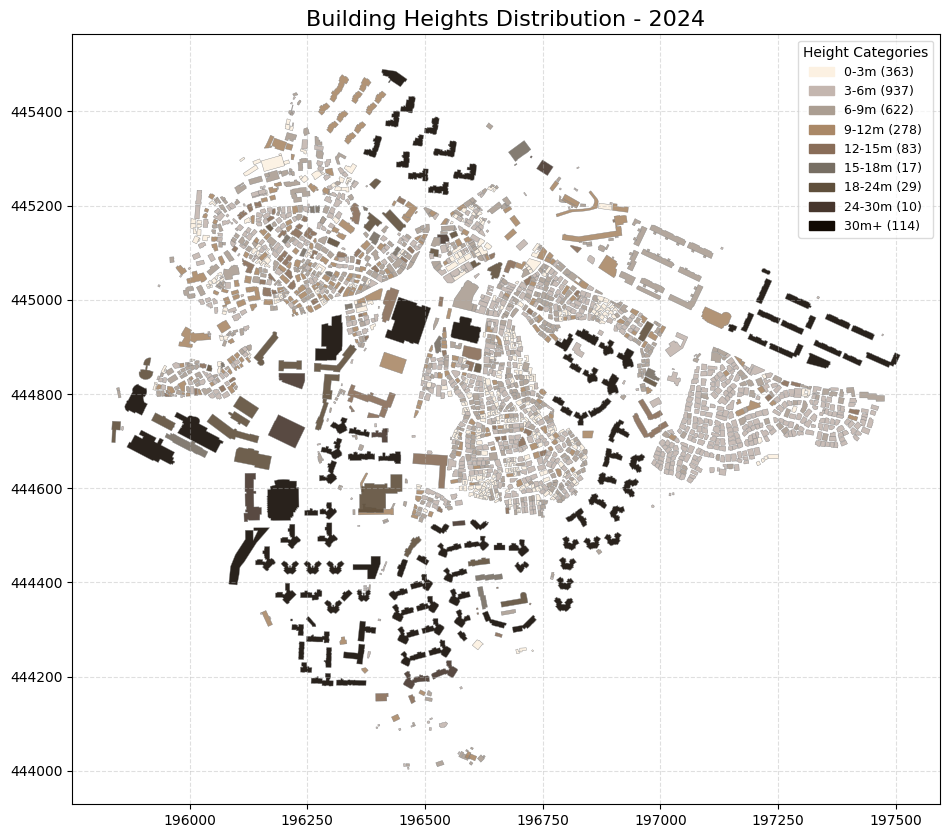

In [97]:
output_directory = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"
output_filename = "흑석동 Building 2024.shp"
output_path = os.path.join(output_directory, output_filename)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save the file
흑석동_final_2024 = 흑석동_5th_2024.copy()
흑석동_final_2024.to_file(output_path)
print(f"Saved final 2021 shapefile to: {output_path}")

# Create visualization of building heights
# Fix the data type issue before creating the visualization
흑석동_final_2024['Height (m)'] = pd.to_numeric(흑석동_final_2024['Height (m)'], errors='coerce')

# Now you can run the visualization code
fig, ax = plt.subplots(figsize=(12, 10))

# Define height categories
height_breaks = [0, 3, 6, 9, 12, 15, 18, 24, 30, float('inf')]
height_labels = ['0-3m', '3-6m', '6-9m', '9-12m', '12-15m', '15-18m', '18-24m', '24-30m', '30m+']

# Use specific color codes
custom_colors = ['#fcf1e2', '#c4b6af', '#ab9e92', '#aa8867', '#896d58', '#776e63', '#5f4f3b', '#47362d', '#120a03']

# Categorize buildings by height
height_categories = pd.cut(흑석동_final_2024['Height (m)'], bins=height_breaks, labels=height_labels)
흑석동_final_2024['Height Category'] = height_categories

# Plot each height category with its specific color
import matplotlib.patches as mpatches
legend_patches = []

for i, category in enumerate(height_labels):
    category_buildings = 흑석동_final_2024[흑석동_final_2024['Height Category'] == category]
    if len(category_buildings) > 0:
        color = custom_colors[i]
        category_buildings.plot(ax=ax, color=color, edgecolor='gray', linewidth=0.3, alpha=0.9)
        legend_patches.append(mpatches.Patch(color=color, label=f"{category} ({len(category_buildings)})"))

# Add title and legend
ax.set_title('Building Heights Distribution - 2024', fontsize=16)
ax.legend(handles=legend_patches, loc='upper right', title='Height Categories', 
          fontsize=9, title_fontsize=10, framealpha=0.7)

# Remove axis labels for cleaner look
ax.set_xlabel('')
ax.set_ylabel('')

# Add grid for better orientation
ax.grid(True, linestyle='--', alpha=0.4)

# Save the figure
plt.savefig(os.path.join(output_directory, 'building_heights_2024.png'), dpi=300, bbox_inches='tight')
plt.show()

In [98]:
len(흑석동_final_2024)

2453

## Overall cleaning

In [100]:
# Dictionary to store year:count mappings
data = []

# Define years and create the summary
years = range(2015, 2025)

for year in years:
    # Try to get the initial and final counts from the variables
    initial_var_name = f'흑석동_1st_{year}'
    final_var_name = f'흑석동_final_{year}'
    
    # Check if variables exist in the current namespace
    if initial_var_name in globals() and final_var_name in globals():
        initial_gdf = globals()[initial_var_name]
        final_gdf = globals()[final_var_name]
        
        initial_count = len(initial_gdf)
        final_count = len(final_gdf)
        change = final_count - initial_count
        percent_change = (change / initial_count) * 100 if initial_count > 0 else 0
        
        data.append({
            'Year': year,
            'Initial': initial_count,
            'Final': final_count,
            'Change': change,
            'Percent Change': f"{percent_change:.1f}%"
        })
    else:
        print(f"Variables not found for year {year}")

# Create DataFrame
summary_df = pd.DataFrame(data)

summary_df

,Year,Initial,Final,Change,Percent Change
0,2015,3400,3429,29,0.9%
1,2016,3400,3429,29,0.9%
2,2017,2945,2888,-57,-1.9%
3,2018,2947,2890,-57,-1.9%
4,2019,2948,2406,-542,-18.4%
5,2020,2933,2391,-542,-18.5%
6,2021,2915,2373,-542,-18.6%
7,2022,2820,2387,-433,-15.4%
8,2023,2821,2388,-433,-15.3%
9,2024,3398,2453,-945,-27.8%


In [101]:
columns = 흑석동_final_2015.columns

columns_df = pd.DataFrame(columns)
columns_df

,0
0,Shape ID
1,GIS building identification number
2,Unique number
3,Dong code
4,Street name
5,Street number
6,Special district code
7,Special district name
8,Building use code
9,Building use name


In [102]:
columns_to_show = ['Shape ID', 'GIS building identification number', 'Unique number', 'Street name', 'Street number', 'Special district name', 'Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'Calculated Area', 'floors', 'Building to land ratio (%)']

years = range(2015, 2025)

for year in years:
    final_var_name = f'흑석동_final_{year}'
    if final_var_name in globals():
        final_gdf = globals()[final_var_name]
        
        # Display only selected columns
        print(f"\n{final_var_name} - Selected columns:")
        print(final_gdf[columns_to_show].head())


흑석동_final_2015 - Selected columns:
   Shape ID GIS building identification number        Unique number  \
0     13179       1970196321754452744700000000  1159010500101730057   
1     13188       2002196593674446795600000000  1159010500100840047   
2     12482       2001196497384445410700000000  1159010500100860060   
3     12503       1974196530064442786900000000  1159010500100790132   
4     12511       1960196663114449837600000000  1159010500100540146   

     Street name Street number Special district name  Building footprint (m2)  \
0  서울특별시 동작구 흑석동        173-57                    일반                    74.81   
1  서울특별시 동작구 흑석동         84-47                    일반                    95.74   
2  서울특별시 동작구 흑석동         86-60                    일반                    82.94   
3  서울특별시 동작구 흑석동        79-132                    일반                   127.44   
4  서울특별시 동작구 흑석동        54-146                    일반                    49.09   

   GFA (m2)  Plot area (m2)  Height (m)  Calculate

In [103]:
흑석동_final_2015[columns_to_show].tail()

,Shape ID,GIS building identification number,Unique number,Street name,Street number,Special district name,Building footprint (m2),GFA (m2),Plot area (m2),Height (m),Calculated Area,floors,Building to land ratio (%)
3424,30952,1159010500102470002000009,None,None,339-0,None,811.252353,10892.863686,0.0,51.0,812.417730,17,None
3425,30953,1159010500102470002000010,None,None,339-0,None,612.136705,7735.806213,0.0,48.0,613.016049,16,None
3426,30954,1159010500102470002000011,None,None,339-0,None,584.592286,7387.716836,0.0,48.0,585.432062,16,None
3427,30955,1159010500102470002000012,None,None,339-0,None,299.244586,3781.668551,0.0,48.0,299.674455,16,None
3428,30956,1159010500102470002000013,None,None,339-0,None,458.473239,4345.426570,0.0,36.0,459.131844,12,None


In [104]:
# Define apartment brands and their building IDs with building to land ratios
apartment_brands = {
    '흑석센트레빌2차아파트': {
        'ratio': 19,
        'ids': [
            '1159010500102740002015071',
            '1159010500102470002000001',
            '1159010500102470002000002',
            '1159010500102470002000003',
            '1159010500102470002000004',
            '1159010500102470002000005',
            '1159010500102470002000006',
            '1159010500102470002000007',
            '1159010500102470002000008',
            '1159010500102470002000009',
            '1159010500102470002000010',
            '1159010500102470002000011',
            '1159010500102470002000012',
            '1159010500102470002000013'
        ]
    },
    '흑석한강푸르지오': {
        'ratio': 22,
        'ids': [
            '1159010500103360000000014',
            '1159010500103360000000013',
            '1159010500103360000000012',
            '1159010500103360000000011',
            '1159010500103360000000005',
            '1159010500103360000000004',
            '1159010500103360000000010',
            '1159010500103360000000009',
            '1159010500103360000000003',
            '1159010500103360000000008',
            '1159010500103360000000002',
            '1159010500103360000000007',
            '1159010500100670000000001',
            '1159010500103360000000006',
            '1159010500100540236000001'
        ]
    },
    '아크로리버하임': {
        'ratio': 30,
        'ids': [
            '1159010500101580001016570',
            '1159010500101580001016572',
            '1159010500101580001016573',
            '1159010500101580001016574',
            '1159010500101580001016575',
            '1159010500101580001016576',
            '1159010500101580001016577',
            '1159010500101580001016571',
            '1159010500101580001016578',
            '1159010500101580001016579',
            '1159010500103410003000001',
            '1159010500101580001016580',
            '1159010500101580001016581',
            '1159010500101580001016582',
            '1159010500101580001016583',
            '1159010500101730052017713',
            '1159010500101580001016584',
            '1159010500101580001016585',
            '1159010500101580001016586',
            '1159010500101580001016587',
            '1159010500101580001016588',
            '1159010500101580001016589'
        ]
    },
    '롯데캐슬에듀포레': {
        'ratio': 21,
        'ids': [
            '1159010500102320055017114',
            '1159010500102320055017115',
            '1159010500102320055017116',
            '1159010500102320055017117',
            '1159010500102320055017118',
            '1159010500102320055017112',
            '1159010500102320055017113'
        ]
    },
    '흑석자이': {
        'ratio': 23.67,
        'ids': [
            '1159010500102530089016058',
            '1159010500102530089016059',
            '1159010500102530089016056',
            '1159010500102530089016057',
            '1159010500102530089016054',
            '1159010500102530089016055',
            '1159010500102530089016052',
            '1159010500102530089016053',
            '1159010500102530089016051',
            '1159010500102530089016050',
            '1159010500102530089016049',
            '1159010500102530089016048',
            '1159010500102530089016042',
            '1159010500100760073014227',
            '1159010500102530089016047',
            '1159010500102530089016046',
            '1159010500102530089016045',
            '1159010500102530089016044',
            '1159010500102530089016043',
            '1159010500102530089016041',
            '1159010500102530089016040',
            '1159010500102530089016039',
            '1159010500102530089016038',
            '1159010500102530089016037',
            '1159010500102530089016036',
            '1159010500102530089016034',
            '1159010500102530089016035',
            '1159010500102570008018161'
        ]
    }
}

# Apply to all final files
years = range(2015, 2025)  # Adjust as needed

for year in years:
    final_var_name = f'흑석동_final_{year}'
    if final_var_name in globals():
        gdf = globals()[final_var_name]
        
        print(f"\nUpdating {final_var_name}...")
        total_updated = 0
        
        # Process each apartment brand
        for brand, data in apartment_brands.items():
            # Find buildings matching the IDs
            mask = gdf['GIS building identification number'].isin(data['ids'])
            
            if mask.any():
                # Update building to land ratio
                gdf.loc[mask, 'Building to land ratio (%)'] = data['ratio']
                
                # Recalculate plot area
                gdf.loc[mask, 'Plot area (m2)'] = gdf.loc[mask, 'Building footprint (m2)'] / (data['ratio'] / 100)
                
                updated_count = mask.sum()
                total_updated += updated_count
                print(f"  {brand}: Updated {updated_count} buildings with ratio {data['ratio']}%")
        
        print(f"Total buildings updated in {year}: {total_updated}")
        
        # Update the global variable
        globals()[final_var_name] = gdf

흑석동_final_2015[columns_to_show].tail()


Updating 흑석동_final_2015...
  흑석센트레빌2차아파트: Updated 14 buildings with ratio 19%
  흑석한강푸르지오: Updated 15 buildings with ratio 22%
Total buildings updated in 2015: 29

Updating 흑석동_final_2016...
  흑석센트레빌2차아파트: Updated 14 buildings with ratio 19%
  흑석한강푸르지오: Updated 15 buildings with ratio 22%
Total buildings updated in 2016: 29

Updating 흑석동_final_2017...
  흑석센트레빌2차아파트: Updated 14 buildings with ratio 19%
  흑석한강푸르지오: Updated 15 buildings with ratio 22%
Total buildings updated in 2017: 29

Updating 흑석동_final_2018...
  흑석센트레빌2차아파트: Updated 14 buildings with ratio 19%
  흑석한강푸르지오: Updated 15 buildings with ratio 22%
Total buildings updated in 2018: 29

Updating 흑석동_final_2019...
  흑석센트레빌2차아파트: Updated 14 buildings with ratio 19%
  흑석한강푸르지오: Updated 15 buildings with ratio 22%
  아크로리버하임: Updated 22 buildings with ratio 30%
  롯데캐슬에듀포레: Updated 7 buildings with ratio 21%
Total buildings updated in 2019: 58

Updating 흑석동_final_2020...
  흑석센트레빌2차아파트: Updated 14 buildings with ratio 19%
  흑석한강푸르지오: 

,Shape ID,GIS building identification number,Unique number,Street name,Street number,Special district name,Building footprint (m2),GFA (m2),Plot area (m2),Height (m),Calculated Area,floors,Building to land ratio (%)
3424,30952,1159010500102470002000009,None,None,339-0,None,811.252353,10892.863686,4269.749226,51.0,812.417730,17,19
3425,30953,1159010500102470002000010,None,None,339-0,None,612.136705,7735.806213,3221.772129,48.0,613.016049,16,19
3426,30954,1159010500102470002000011,None,None,339-0,None,584.592286,7387.716836,3076.801505,48.0,585.432062,16,19
3427,30955,1159010500102470002000012,None,None,339-0,None,299.244586,3781.668551,1574.971503,48.0,299.674455,16,19
3428,30956,1159010500102470002000013,None,None,339-0,None,458.473239,4345.426570,2413.017050,36.0,459.131844,12,19


In [105]:
# Function to calculate new columns
def calculate_columns(gdf):
    # Volume (m³) = footprint * height
    gdf['Volume (m3)'] = gdf['Building footprint (m2)'] * gdf['Height (m)']
    
    # FSI = GFA / plot area
    gdf['FSI'] = gdf.apply(
        lambda row: row['GFA (m2)'] / row['Plot area (m2)'] if row['Plot area (m2)'] > 0 else 0,
        axis=1
    )
    
    # GSI = footprint / plot area
    gdf['GSI'] = gdf.apply(
        lambda row: row['Building footprint (m2)'] / row['Plot area (m2)'] if row['Plot area (m2)'] > 0 else 0,
        axis=1
    )
    
    return gdf

# Apply to all final files
years = range(2015, 2025)  # Adjust as needed

for year in years:
    # Process final files
    final_var_name = f'흑석동_final_{year}'
    if final_var_name in globals():
        print(f"Processing {final_var_name}...")
        globals()[final_var_name] = calculate_columns(globals()[final_var_name])

    # Also process initial files
    initial_var_name = f'흑석동_1st_{year}'
    if initial_var_name in globals():
        globals()[initial_var_name] = calculate_columns(globals()[initial_var_name])

Processing 흑석동_final_2015...
Processing 흑석동_final_2016...
Processing 흑석동_final_2017...
Processing 흑석동_final_2018...
Processing 흑석동_final_2019...
Processing 흑석동_final_2020...
Processing 흑석동_final_2021...
Processing 흑석동_final_2022...
Processing 흑석동_final_2023...
Processing 흑석동_final_2024...


In [106]:
columns_to_check = ['Shape ID', 'GIS building identification number', 'Unique number', 'Street name', 'Street number', 'Special district name', 'Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'Calculated Area', 'floors', 'Building to land ratio (%)', 'Volume (m3)', 'FSI', 'GSI']
흑석동_final_2024[columns_to_check].tail(30)

,Shape ID,GIS building identification number,Unique number,Street name,Street number,Special district name,Building footprint (m2),GFA (m2),Plot area (m2),Height (m),Calculated Area,floors,Building to land ratio (%),Volume (m3),FSI,GSI
2423,31141,1159010500103360000000011,None,None,336-0,None,558.332489,8819.827150,2537.874952,57.0,559.134543,19,22.0,31824.951899,3.475280,0.22
2424,31142,1159010500103360000000012,None,None,336-0,None,558.329123,7937.796579,2537.859652,51.0,559.131172,17,22.0,28474.785294,3.127752,0.22
2425,31143,1159010500103360000000013,None,None,336-0,None,558.332335,7055.859767,2537.874250,45.0,559.134389,15,22.0,25124.955074,2.780224,0.22
2426,31144,1159010500103360000000014,None,None,336-0,None,705.382551,8357.052868,3206.284324,42.0,706.395845,14,22.0,29626.067153,2.606460,0.22
2427,31131,1159010500100670000000001,None,None,336-0,None,705.380913,7242.762328,3206.276876,39.0,706.394204,13,22.0,27509.855596,2.258932,0.22
2428,31133,1159010500103360000000003,None,None,336-0,None,558.329788,6173.849135,2537.862673,39.0,559.131838,13,22.0,21774.861738,2.432696,0.22
2429,31134,1159010500103360000000004,None,None,336-0,None,558.329472,6173.845636,2537.861235,39.0,559.131521,13,22.0,21774.849397,2.432696,0.22
2430,31135,1159010500103360000000005,None,None,336-0,None,558.326867,7055.790670,2537.849397,42.0,559.128913,14,22.0,23449.728426,2.780224,0.22
2431,31136,1159010500103360000000006,None,None,336-0,None,859.673810,8827.022350,3907.608225,39.0,860.908745,13,22.0,33527.278572,2.258932,0.22
2432,31137,1159010500103360000000007,None,None,336-0,None,718.744011,7379.972938,3267.018232,39.0,719.776499,13,22.0,28031.016430,2.258932,0.22


In [107]:
output_path = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final"

# Create the directory if it doesn't exist
if not os.path.exists(output_path):
    os.makedirs(output_path)

# Define the specific buildings that need their street number changed to '341-3'
specific_buildings = [
    '1159010500101580001016575',
    '1159010500101580001016576',
    '1159010500101580001016577',
    '1159010500101580001016573',
    '1159010500101580001016574',
    '1159010500101580001016572',
    '1159010500101580001016570'
]

# Process each year
for year in range(2015, 2025):
    var_name = f'흑석동_final_{year}'
    
    if var_name in globals():
        print(f"\nProcessing {var_name}...")
        
        # Create a copy of the data
        gdf = globals()[var_name].copy()
        
        # Store original count for verification
        original_no_dash = len(gdf[~gdf['Street number'].astype(str).str.contains('-')])
        
        # 1. Add '-0' to street numbers without dash
        gdf['Street number'] = gdf['Street number'].astype(str).apply(
            lambda x: x + '-0' if '-' not in x else x
        )
        
        # 2. Change '340-0' to '340-1'
        gdf.loc[gdf['Street number'] == '341-0', 'Street number'] = '341-1'
        
        # 3. Change specific buildings to '341-3'
        gdf.loc[gdf['GIS building identification number'].isin(specific_buildings), 'Street number'] = '341-3'
        
        # Update the global variable
        globals()[var_name] = gdf
        
        # Save to file as shapefile
        file_path = os.path.join(output_path, f'{var_name}.shp')
        gdf.to_file(file_path, driver="ESRI Shapefile", encoding='utf-8')
        print(f"Saved {var_name} to {file_path}")
        
        # Verification statistics
        fixed_count = original_no_dash - len(gdf[~gdf['Street number'].astype(str).str.contains('-')])
        changed_340_0 = len(gdf[gdf['Street number'] == '341-1']) - len(globals()[var_name][globals()[var_name]['Street number'] == '341-1'])
        changed_specific = len(gdf[gdf['GIS building identification number'].isin(specific_buildings) & (gdf['Street number'] == '341-3')])
        
        print(f"  - Fixed {fixed_count} street numbers without dash")
        print(f"  - Changed {changed_340_0} buildings from '341-0' to '341-1'")
        print(f"  - Changed {changed_specific} specific buildings to '341-3'")


Processing 흑석동_final_2015...
Saved 흑석동_final_2015 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2015.shp
  - Fixed 184 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 0 specific buildings to '341-3'

Processing 흑석동_final_2016...


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3725599094.py:47: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(file_path, driver="ESRI Shapefile", encoding='utf-8')
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/launder

Saved 흑석동_final_2016 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2016.shp
  - Fixed 184 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 0 specific buildings to '341-3'

Processing 흑석동_final_2017...
Saved 흑석동_final_2017 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2017.shp
  - Fixed 171 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 0 specific buildings to '341-3'

Processing 흑석동_final_2018...


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3725599094.py:47: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(file_path, driver="ESRI Shapefile", encoding='utf-8')
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/launder

Saved 흑석동_final_2018 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2018.shp
  - Fixed 169 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 0 specific buildings to '341-3'

Processing 흑석동_final_2019...
Saved 흑석동_final_2019 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2019.shp
  - Fixed 163 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 7 specific buildings to '341-3'

Processing 흑석동_final_2020...
Saved 흑석동_final_2020 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2020.shp
  - Fixed 163 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 7 specific buildings to '341-3'

Processing 흑석동_final_2021...


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3725599094.py:47: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(file_path, driver="ESRI Shapefile", encoding='utf-8')
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/launder

Saved 흑석동_final_2021 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2021.shp
  - Fixed 163 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 7 specific buildings to '341-3'

Processing 흑석동_final_2022...
Saved 흑석동_final_2022 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2022.shp
  - Fixed 163 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 7 specific buildings to '341-3'

Processing 흑석동_final_2023...
Saved 흑석동_final_2023 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2023.shp
  - Fixed 163 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 7 specific buildings to '341-3'

Processing 흑석동_final_2024...


/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3725599094.py:47: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(file_path, driver="ESRI Shapefile", encoding='utf-8')
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GIS building identification number' to 'GIS buildi'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unique number' to 'Unique num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street name' to 'Street nam'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Street number' to 'Street num'
  ogr_write(
/opt/anaconda3/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/launder

Saved 흑석동_final_2024 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2024.shp
  - Fixed 163 street numbers without dash
  - Changed 0 buildings from '341-0' to '341-1'
  - Changed 7 specific buildings to '341-3'


## Energy consumption

### Data cleaning

Find the buildings that share the same address

Number of buildings per street number:
Street number
10-0      31
335-4     29
253-89    26
221-0     23
28-0      16
336-0     14
335-0     14
339-0     14
335-10    14
341-1     13
Name: count, dtype: int64

Total street numbers with multiple buildings: 229

Breakdown:
Street number 10-0: 31 buildings
Street number 335-4: 29 buildings
Street number 253-89: 26 buildings
Street number 221-0: 23 buildings
Street number 28-0: 16 buildings
Street number 336-0: 14 buildings
Street number 335-0: 14 buildings
Street number 339-0: 14 buildings
Street number 335-10: 14 buildings
Street number 341-1: 13 buildings
Street number 245-1: 12 buildings
Street number 327-0: 11 buildings
Street number 61-34: 9 buildings
Street number 328-0: 9 buildings
Street number 7-1: 9 buildings
Street number 341-3: 8 buildings
Street number 340-0: 7 buildings
Street number 198-79: 6 buildings
Street number 198-71: 5 buildings
Street number 233-2: 5 buildings
Street number 173-155: 5 buildings
Street number 173-81:

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3872994630.py:48: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


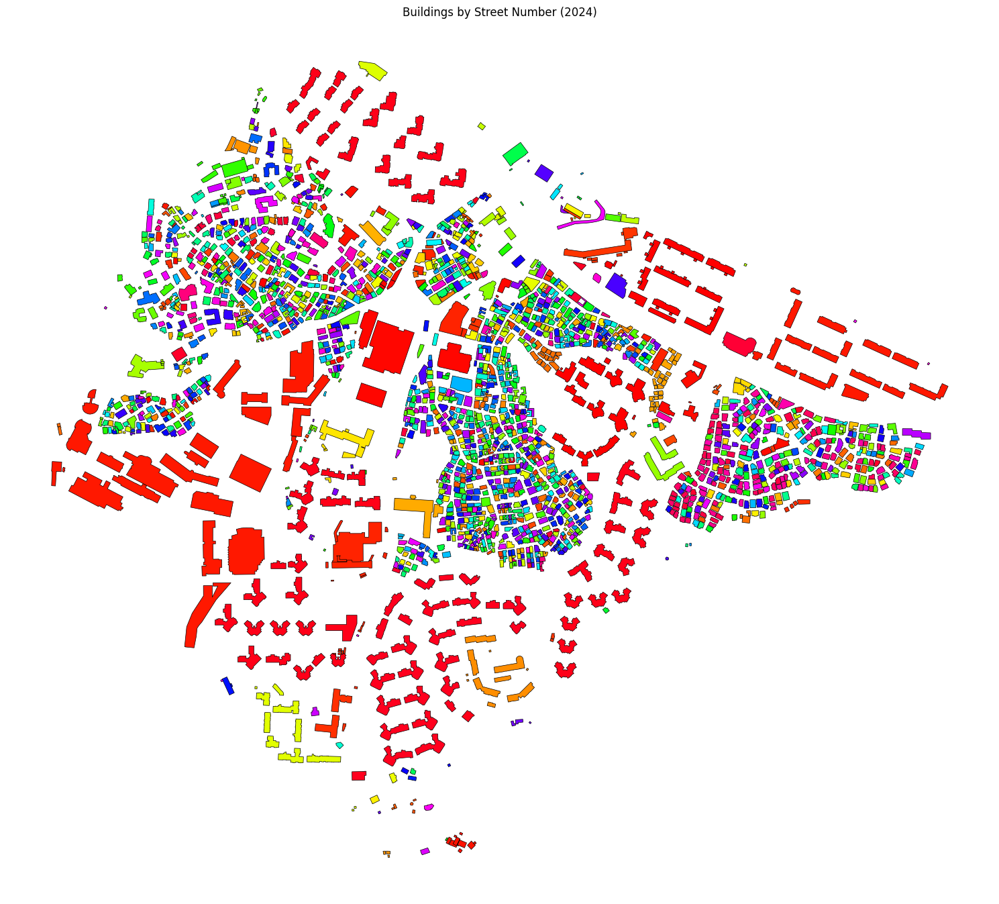

/var/folders/5v/5nwj3q8d66j_03jpgzv73xt40000gn/T/ipykernel_75579/3872994630.py:79: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper left', bbox_to_anchor=(1.01, 1))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


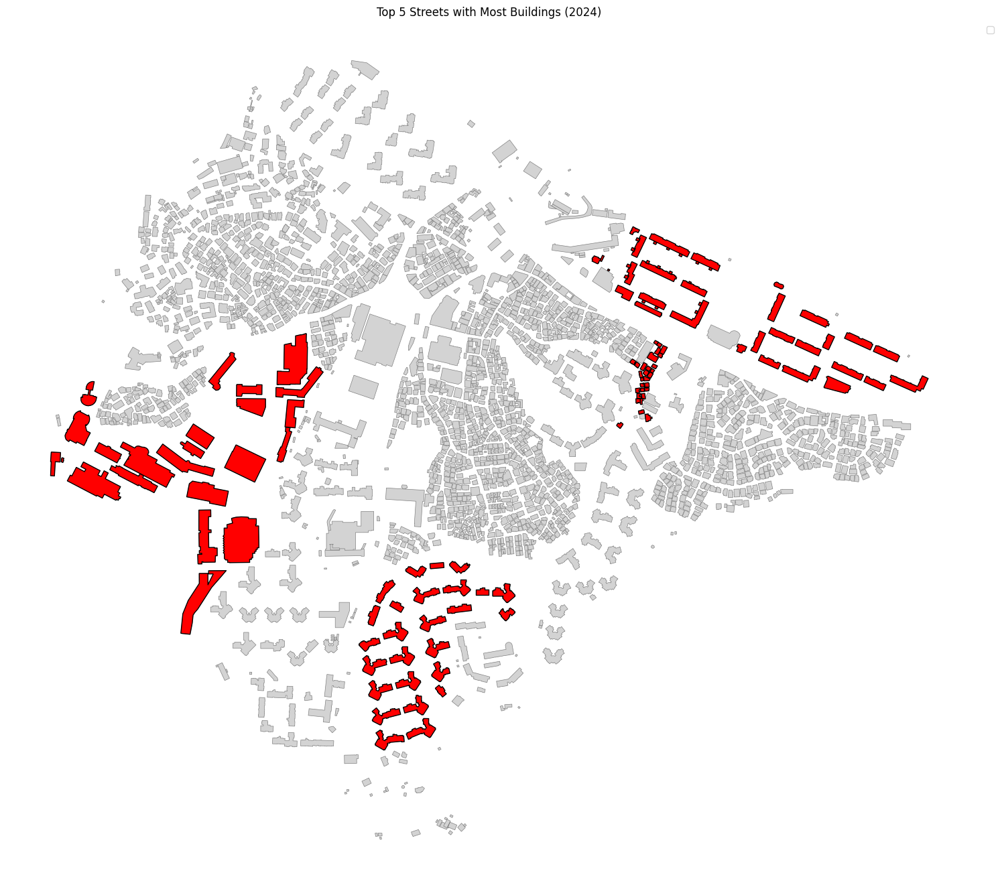

In [111]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
import numpy as np
from collections import Counter

# Work with 2024 data
if '흑석동_final_2024' in globals():
    gdf = 흑석동_final_2024
    
    # Count buildings per street number
    street_counts = gdf['Street number'].value_counts()
    
    print("Number of buildings per street number:")
    print(street_counts.head(10))  # Show top 10
    
    # Find street numbers shared by multiple buildings
    shared_streets = street_counts[street_counts > 1]
    print(f"\nTotal street numbers with multiple buildings: {len(shared_streets)}")
    print("\nBreakdown:")
    for street, count in shared_streets.items():
        print(f"Street number {street}: {count} buildings")
    
    # Create visualization
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    
    # Get unique street numbers and create color map
    unique_streets = gdf['Street number'].unique()
    num_streets = len(unique_streets)
    
    # Create a color palette
    if num_streets <= 20:
        colors = plt.cm.tab20.colors
    else:
        colors = plt.cm.hsv(np.linspace(0, 1, num_streets))
    
    # Create a color dictionary
    color_dict = {street: colors[i % len(colors)] for i, street in enumerate(unique_streets)}
    
    # Plot each street number with its own color
    for street in unique_streets:
        buildings = gdf[gdf['Street number'] == street]
        buildings.plot(ax=ax, color=color_dict[street], 
                      edgecolor='black', linewidth=0.5,
                      label=f'Street {street} ({len(buildings)})')
    
    # Add legend for streets with multiple buildings
    handles, labels = ax.get_legend_handles_labels()
    # Filter to show only streets with multiple buildings in legend
    filtered_handles_labels = [(h, l) for h, l in zip(handles, labels) 
                              if int(l.split('(')[1].split(')')[0]) > 1]
    
    if filtered_handles_labels:
        filtered_handles, filtered_labels = zip(*filtered_handles_labels)
        ax.legend(filtered_handles, filtered_labels, 
                 loc='upper left', bbox_to_anchor=(1.01, 1),
                 fontsize=8)
    
    plt.title('Buildings by Street Number (2024)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Create a detailed map for streets with most buildings
    top_streets = street_counts.head(5).index.tolist()
    
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    
    # Plot all buildings in light gray as background
    gdf.plot(ax=ax, color='lightgray', edgecolor='gray', linewidth=0.5)
    
    # Highlight buildings from top streets
    for i, street in enumerate(top_streets):
        buildings = gdf[gdf['Street number'] == street]
        buildings.plot(ax=ax, color=colors[i], 
                      edgecolor='black', linewidth=1,
                      label=f'Street {street} ({len(buildings)} buildings)')
    
    ax.legend(loc='upper left', bbox_to_anchor=(1.01, 1))
    plt.title('Top 5 Streets with Most Buildings (2024)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()


Create a new column 'Percentage (%)' that shows what percentage each building's GFA represents out of the total GFA for all buildings sharing the same street number

In [113]:
# Define years range
years = range(2015, 2025)

# Process each final file
for year in years:
    final_var_name = f'흑석동_final_{year}'
    if final_var_name in globals():
        gdf = globals()[final_var_name]
        
        print(f"\nProcessing {final_var_name}...")
        
        # Group by Street number and calculate total GFA for each street
        street_gfa_totals = gdf.groupby('Street number')['GFA (m2)'].sum()
        
        # Calculate percentage for each building
        gdf['Percentage (%)'] = gdf.apply(
            lambda row: (row['GFA (m2)'] / street_gfa_totals[row['Street number']]) * 100,
            axis=1
        )
        
        # Update the global variable
        globals()[final_var_name] = gdf
        
        # Verification statistics
        building_count = len(gdf)
        streets_shared = gdf['Street number'].value_counts()[gdf['Street number'].value_counts() > 1]
        single_buildings = gdf['Street number'].value_counts()[gdf['Street number'].value_counts() == 1]
        
        print(f"  Total buildings: {building_count}")
        print(f"  Street numbers with multiple buildings: {len(streets_shared)}")
        print(f"  Street numbers with single building: {len(single_buildings)}")
        
        # Check that percentage adds up to 100 for each street
        verification = gdf.groupby('Street number')['Percentage (%)'].sum()
        errors = verification[abs(verification - 100) > 0.01]  # Allow small floating point differences
        
        if len(errors) > 0:
            print(f"  Warning: {len(errors)} streets have percentages not summing to 100%")
        else:
            print("  All street percentages correctly sum to 100%")


Processing 흑석동_final_2015...
  Total buildings: 3429
  Street numbers with multiple buildings: 319
  Street numbers with single building: 2468
  All street percentages correctly sum to 100%

Processing 흑석동_final_2016...
  Total buildings: 3429
  Street numbers with multiple buildings: 319
  Street numbers with single building: 2468
  All street percentages correctly sum to 100%

Processing 흑석동_final_2017...
  Total buildings: 2888
  Street numbers with multiple buildings: 263
  Street numbers with single building: 2066
  All street percentages correctly sum to 100%

Processing 흑석동_final_2018...
  Total buildings: 2890
  Street numbers with multiple buildings: 266
  Street numbers with single building: 2070
  All street percentages correctly sum to 100%

Processing 흑석동_final_2019...
  Total buildings: 2406
  Street numbers with multiple buildings: 234
  Street numbers with single building: 1655
  All street percentages correctly sum to 100%

Processing 흑석동_final_2020...
  Total buildin

In [114]:
# Verify results for year 2024
year = 2024
if f'흑석동_final_{year}' in globals():
    df = globals()[f'흑석동_final_{year}']
    
    # Find examples of shared street numbers
    shared_streets = df['Street number'].value_counts()[df['Street number'].value_counts() > 1].index
    
    if len(shared_streets) > 0:
        example_street = shared_streets[0]
        
        print(f"\nExample for year {year} - Street number {example_street}:")
        example_buildings = df[df['Street number'] == example_street]
        print(example_buildings[['GIS building identification number', 'Street number', 
                                'GFA (m2)', 'Percentage (%)']].to_string())
        print(f"Total percentage: {example_buildings['Percentage (%)'].sum():.2f}%")
    
    # Check buildings with 100% (single buildings on their street)
    single_buildings = df[df['Percentage (%)'] == 100]
    print(f"\nBuildings with 100% (unshared streets): {len(single_buildings)}")


Example for year 2024 - Street number 10-0:
     GIS building identification number Street number  GFA (m2)  Percentage (%)
2          1988196930024450462100000000          10-0   2524.80        2.641303
8          1988196957524451351300000000          10-0   6061.20        6.340886
63         1988196982984450307900000000          10-0   8742.72        9.146141
100        1988196933094450766000000000          10-0    583.00        0.609902
349        1988196994314450875800000000          10-0  10884.36       11.386604
436        1988197054574450657700000000          10-0    583.00        0.609902
573        1988197017684450847200000000          10-0    583.00        0.609902
587        0000196948374451648500000000          10-0    583.00        0.609902
701        1988196966184450295700000000          10-0    583.00        0.609902
837        1988196945754451290000000000          10-0    583.00        0.609902
857        1988196974174451048000000000          10-0    583.00        0.60

In [115]:
columns_to_check = ['Shape ID', 'GIS building identification number', 'Unique number', 'Street name', 'Street number', 'Special district name', 'Building footprint (m2)', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'Calculated Area', 'floors', 'Building to land ratio (%)', 'Volume (m3)', 'FSI', 'GSI', 'Percentage (%)']
흑석동_final_2024[columns_to_check].tail(5)

,Shape ID,GIS building identification number,Unique number,Street name,Street number,Special district name,Building footprint (m2),GFA (m2),Plot area (m2),Height (m),Calculated Area,floors,Building to land ratio (%),Volume (m3),FSI,GSI,Percentage (%)
2448,33533,1159010500102320055017113,None,None,340-0,None,753.808591,7144.626117,3589.564719,36.0,754.891449,12,21.0,27137.109276,1.990388,0.21,10.753756
2449,34130,1159010500101730052017713,None,None,341-2,None,226.732719,716.327074,755.775731,9.0,227.058425,3,30.0,2040.594474,0.947804,0.30,100.000000
2450,33554,1159010500101580001016575,None,None,341-3,None,620.931035,11279.981342,2069.770118,69.0,621.823013,23,30.0,42844.241436,5.449872,0.30,12.919786
2451,33555,1159010500101580001016576,None,None,341-3,None,380.204128,6906.878902,1267.347093,69.0,380.750297,23,30.0,26234.084815,5.449872,0.30,7.910953
2452,37133,1159010500103410003000001,None,None,341-3,None,281.175298,444.165005,937.250993,3.0,281.579211,1,30.0,843.525894,0.473902,0.30,0.508735


### Electricity demand (전기에너지)

In [117]:
전기에너지 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/전기에너지.xlsx"
전기에너지 = pd.read_excel(전기에너지)

전기에너지.tail(5)

,Unnamed: 0,대지위치,시군구코드,법정동코드,대지구분코드,번,지,사용년월,도로명대지위치,새주소일련번호,새주소도로코드,새주소지상지하코드,새주소본번,새주소부번,사용량(KWh)
89612,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202408,서울특별시 동작구 서달로 지상 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,19572
89613,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202409,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,17056
89614,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202410,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,11310
89615,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202411,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,13286
89616,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202412,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,21614


Create column 'Street number' to match buildings with final shapefiles using "번-지"

In [119]:
전기에너지['Street number'] = 전기에너지.apply(
    lambda row: f"{int(row['번'])}-{int(row['지'])}" if pd.notnull(row['번']) and pd.notnull(row['지']) else None, 
    axis=1)
전기에너지.tail(5)

,Unnamed: 0,대지위치,시군구코드,법정동코드,대지구분코드,번,지,사용년월,도로명대지위치,새주소일련번호,새주소도로코드,새주소지상지하코드,새주소본번,새주소부번,사용량(KWh),Street number
89612,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202408,서울특별시 동작구 서달로 지상 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,19572,61-34
89613,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202409,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,17056,61-34
89614,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202410,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,11310,61-34
89615,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202411,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,13286,61-34
89616,NaN,서울특별시 동작구 흑석동 산61-34,11590,10500,1,61,34,202412,서울특별시 동작구 서달로 50-26 (흑석동),1,1.159031e+11,0.0,50.0,26.0,21614,61-34


In [120]:
# Process electricity data for all months and years
if '전기에너지' in globals():
    electricity_data = 전기에너지
    
    # First, let's check what columns we have in the electricity data
    print("Columns in electricity data:")
    print(electricity_data.columns.tolist())
    
    # Extract year and month from '사용년월'
    electricity_data['year'] = electricity_data['사용년월'].astype(str).str[:4]
    electricity_data['month'] = electricity_data['사용년월'].astype(str).str[4:6]
    
    # Only process data from 2015 onwards
    electricity_data = electricity_data[electricity_data['year'].astype(int) >= 2015]
    
    # Get unique year-month combinations
    unique_periods = electricity_data['사용년월'].unique()
    
    print(f"Total periods to process: {len(unique_periods)}")
    
    # Process each period
    for period in unique_periods:
        year = str(period)[:4]
        month = str(period)[4:6]
        
        # Get the corresponding final shapefile
        final_var_name = f'흑석동_final_{year}'
        
        if final_var_name in globals():
            building_gdf = globals()[final_var_name].copy()
            
            # Filter electricity data for this period
            period_data = electricity_data[electricity_data['사용년월'] == period].copy()
            
            # Print available columns in period_data
            print(f"\nProcessing {period}")
            print(f"Columns in period_data: {period_data.columns.tolist()}")
            
            # Merge building data with electricity data based on Street number
            merged_data = building_gdf.merge(
                period_data,
                left_on='Street number',
                right_on='Street number',
                how='left',
                suffixes=('_building', '_electricity')
            )
            
            # Print columns after merge
            print(f"Columns after merge: {merged_data.columns.tolist()}")
            
            # Check if the usage column exists and calculate allocated usage
            if '사용량 (KWh)' in merged_data.columns:
                merged_data['Electricity usage (KWh)'] = merged_data['사용량 (KWh)'].fillna(0) * (merged_data['Percentage (%)'] / 100)
            else:
                # If not found, check for similar column names
                usage_columns = [col for col in merged_data.columns if '사용량' in col]
                if usage_columns:
                    print(f"Found usage columns: {usage_columns}")
                    usage_col = usage_columns[0]  # Use the first match
                    merged_data['Electricity usage (KWh)'] = merged_data[usage_col].fillna(0) * (merged_data['Percentage (%)'] / 100)
                else:
                    print(f"No usage column found for {period}")
                    merged_data['Electricity usage (KWh)'] = 0
            
            # Create final output with available columns
            output_columns = [
                'GIS building identification number',
                'Street number',
                'Building footprint (m2)',
                'GFA (m2)',
                'Height (m)',
                'floors',
                'Percentage (%)',
                '사용량 (KWh)',
                'FSI',
                'GSI',
                'Electricity usage (KWh)',
                'geometry'
            ]
            
            # Add the usage column if it exists
            if '사용량 (KWh)' in merged_data.columns:
                output_columns.insert(-2, '사용량 (KWh)')
            
            existing_columns = [col for col in output_columns if col in merged_data.columns]
            output_gdf = merged_data[existing_columns].copy()
            
            # Store in variable
            var_name = f'전기에너지_{period}'
            globals()[var_name] = output_gdf
            
            # Stats for verification
            buildings_matched = output_gdf[output_gdf['Electricity usage (KWh)'] > 0].shape[0]
            total_buildings = output_gdf.shape[0]
            
            print(f"{var_name}: {buildings_matched}/{total_buildings} buildings matched ({(buildings_matched/total_buildings)*100:.1f}%)")
            
        else:
            print(f"No shapefile for year {year}, skipping {period}")
    
    print("\nProcessing complete!")

Columns in electricity data:
['Unnamed: 0', '대지위치', '시군구코드', '법정동코드', '대지구분코드', '번', '지', '사용년월', '도로명대지위치', '새주소일련번호', '새주소도로코드', '새주소지상지하코드', '새주소본번', '새주소부번', '사용량(KWh)', 'Street number']
Total periods to process: 113

Processing 201501
Columns in period_data: ['Unnamed: 0', '대지위치', '시군구코드', '법정동코드', '대지구분코드', '번', '지', '사용년월', '도로명대지위치', '새주소일련번호', '새주소도로코드', '새주소지상지하코드', '새주소본번', '새주소부번', '사용량(KWh)', 'Street number', 'year', 'month']
Columns after merge: ['Shape ID', 'GIS building identification number', 'Unique number', 'Dong code', 'Street name', 'Street number', 'Special district code', 'Special district name', 'Building use code', 'Building use name', 'Building structure code', 'Building structure name', 'Building footprint (m2)', 'Date of approval for use', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'Building to land ratio (%)', 'FAR (%)', 'Building ID', 'Violation?', 'Reference system key', 'Database date', 'geometry', 'Calculated Area', 'floors', 'Height Category', 'Volume

In [121]:
전기에너지_201904

,GIS building identification number,Street number,Building footprint (m2),GFA (m2),Height (m),floors,Percentage (%),FSI,GSI,Electricity usage (KWh),geometry
0,0000196783774452558500000000,1-2,52.568217,157.704652,9.0,3,100.000000,1.558640,0.519547,0.000000,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
1,0000196725364453033800000000,1-3,2189.256070,24208.159733,30.0,10,50.000000,5.744996,0.519547,28215.000000,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
2,1983196754594452804800000000,1-3,2189.256070,24208.159733,30.0,10,50.000000,5.744996,0.519547,28215.000000,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
3,0000196822264452328700000000,2-1,14.466251,28.932501,6.0,2,52.976510,1.039093,0.519547,71.518288,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
4,0000196818334452356900000000,2-1,12.840665,25.681329,6.0,2,47.023490,1.039093,0.519547,63.481712,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
...,...,...,...,...,...,...,...,...,...,...,...
2401,1159010500102320055017113,340-0,753.808591,7144.626117,36.0,12,10.753756,1.990388,0.210000,0.000000,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."
2402,1159010500101730052017713,341-2,226.732719,716.327074,9.0,3,100.000000,0.947804,0.300000,0.000000,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."
2403,1159010500101580001016575,341-3,620.931035,11279.981342,69.0,23,12.919786,5.449872,0.300000,0.000000,"POLYGON ((1.96e+05 4.45e+05, 1.97e+05 4.45e+05..."
2404,1159010500101580001016576,341-3,380.204128,6906.878902,69.0,23,7.910953,5.449872,0.300000,0.000000,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."


Implement the IQR method for outlier detection for electricity usage data

In [123]:
example_month = '202403'  # March 2024 as an example

if f'전기에너지_{example_month}' in globals():
    data = globals()[f'전기에너지_{example_month}'].copy()
    
    # Filter out buildings with zero electricity usage
    data_with_usage = data[data['Electricity usage (KWh)'] > 0].copy()
    
    print(f"Total buildings in {example_month}: {len(data)}")
    print(f"Buildings with actual usage: {len(data_with_usage)}")
    print(f"Buildings with zero usage removed: {len(data) - len(data_with_usage)}")

Total buildings in 202403: 2453
Buildings with actual usage: 473
Buildings with zero usage removed: 1980


In [124]:
# Calculate EUI for buildings with usage
if 'data_with_usage' in locals():
    # Calculate EUI (kWh/m²)
    data_with_usage['EUI_electricity'] = data_with_usage['Electricity usage (KWh)'] / data_with_usage['GFA (m2)']
    
    # Check the distribution
    print(f"\nEUI Statistics for {example_month}:")
    print(f"Mean EUI: {data_with_usage['EUI_electricity'].mean():.2f} kWh/m²")
    print(f"Median EUI: {data_with_usage['EUI_electricity'].median():.2f} kWh/m²")
    print(f"Min EUI: {data_with_usage['EUI_electricity'].min():.2f} kWh/m²")
    print(f"Max EUI: {data_with_usage['EUI_electricity'].max():.2f} kWh/m²")


EUI Statistics for 202403:
Mean EUI: 10.03 kWh/m²
Median EUI: 3.56 kWh/m²
Min EUI: 0.00 kWh/m²
Max EUI: 333.14 kWh/m²


In [125]:
# Calculate IQR for EUI
if 'data_with_usage' in locals():
    Q1 = data_with_usage['EUI_electricity'].quantile(0.25)
    Q3 = data_with_usage['EUI_electricity'].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    print(f"\nIQR Analysis for {example_month}:")
    print(f"Q1 (25th percentile): {Q1:.2f} kWh/m²")
    print(f"Q3 (75th percentile): {Q3:.2f} kWh/m²")
    print(f"IQR: {IQR:.2f} kWh/m²")
    print(f"Lower bound: {lower_bound:.2f} kWh/m²")
    print(f"Upper bound: {upper_bound:.2f} kWh/m²")
    
    # Identify outliers
    outliers = data_with_usage[
        (data_with_usage['EUI_electricity'] < lower_bound) | 
        (data_with_usage['EUI_electricity'] > upper_bound)
    ]
    
    normal_data = data_with_usage[
        (data_with_usage['EUI_electricity'] >= lower_bound) & 
        (data_with_usage['EUI_electricity'] <= upper_bound)
    ]
    
    print(f"\nNumber of outliers: {len(outliers)}")
    print(f"Number of normal buildings: {len(normal_data)}")


IQR Analysis for 202403:
Q1 (25th percentile): 2.16 kWh/m²
Q3 (75th percentile): 12.30 kWh/m²
IQR: 10.14 kWh/m²
Lower bound: -13.06 kWh/m²
Upper bound: 27.52 kWh/m²

Number of outliers: 35
Number of normal buildings: 438


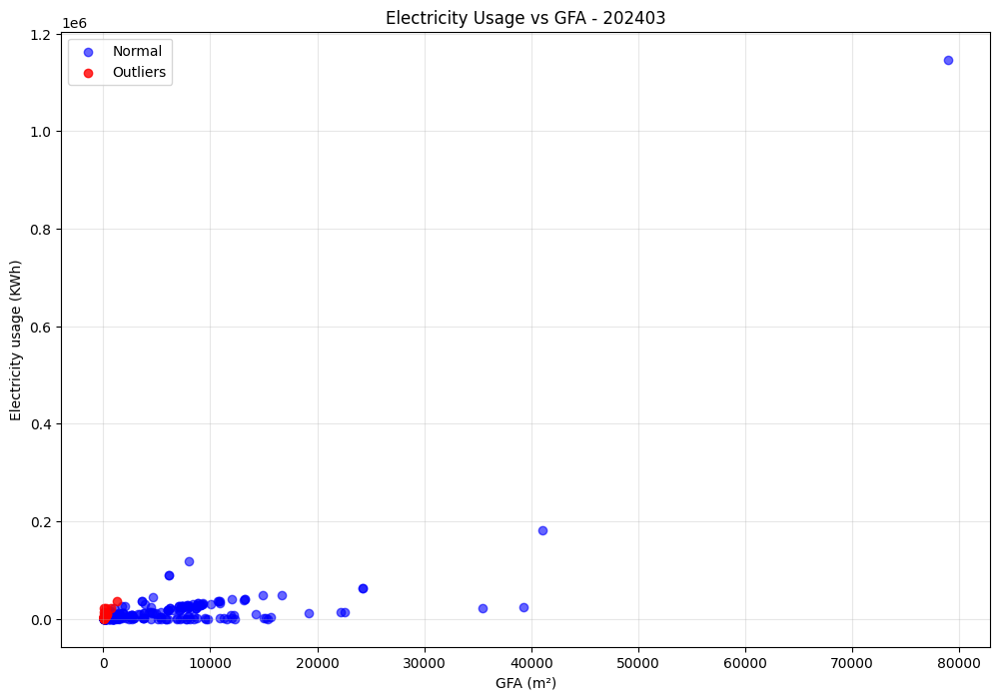

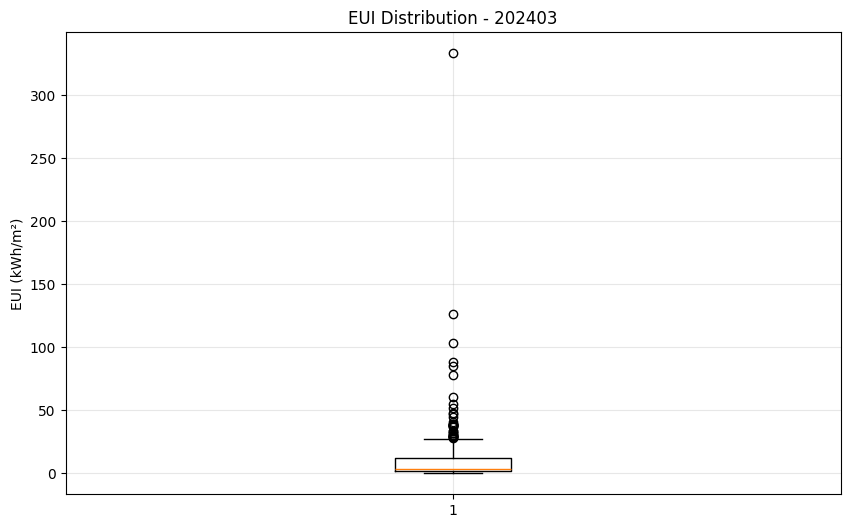

In [126]:
import matplotlib.pyplot as plt

# Create a scatter plot with outliers highlighted
if 'data_with_usage' in locals():
    plt.figure(figsize=(12, 8))
    
    # Plot normal data points
    plt.scatter(normal_data['GFA (m2)'], normal_data['Electricity usage (KWh)'], 
               alpha=0.6, color='blue', label='Normal')
    
    # Plot outliers
    plt.scatter(outliers['GFA (m2)'], outliers['Electricity usage (KWh)'], 
               alpha=0.8, color='red', label='Outliers')
    
    plt.xlabel('GFA (m²)')
    plt.ylabel('Electricity usage (KWh)')
    plt.title(f'Electricity Usage vs GFA - {example_month}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Box plot for EUI
    plt.figure(figsize=(10, 6))
    plt.boxplot(data_with_usage['EUI_electricity'])
    plt.ylabel('EUI (kWh/m²)')
    plt.title(f'EUI Distribution - {example_month}')
    plt.grid(True, alpha=0.3)
    plt.show()

In [127]:
# Process all months with the IQR method
cleaned_data_dict = {}

# Get all electricity data variables
electricity_vars = [var for var in globals() if var.startswith('전기에너지_')]

print(f"Found {len(electricity_vars)} electricity data files\n")

for var_name in electricity_vars:
    period = var_name.split('_')[1]  # Extract YYYYMM
    data = globals()[var_name].copy()
    
    # 1. Filter out zero usage
    data_with_usage = data[data['Electricity usage (KWh)'] > 0].copy()
    
    if len(data_with_usage) == 0:
        print(f"No buildings with usage in {period}")
        continue
    
    # 2. Calculate EUI
    data_with_usage['EUI_electricity'] = data_with_usage['Electricity usage (KWh)'] / data_with_usage['GFA (m2)']
    
    # 3. Calculate IQR boundaries
    Q1 = data_with_usage['EUI_electricity'].quantile(0.25)
    Q3 = data_with_usage['EUI_electricity'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # 4. Filter outliers
    normal_data = data_with_usage[
        (data_with_usage['EUI_electricity'] >= lower_bound) & 
        (data_with_usage['EUI_electricity'] <= upper_bound)
    ].copy()
    
    outliers = data_with_usage[
        (data_with_usage['EUI_electricity'] < lower_bound) | 
        (data_with_usage['EUI_electricity'] > upper_bound)
    ].copy()
    
    # 5. Store cleaned data
    cleaned_data_dict[period] = normal_data
    
    # 6. Statistics
    print(f"{period}:")
    print(f"  Original buildings: {len(data)}")
    print(f"  Buildings with usage: {len(data_with_usage)}")
    print(f"  Outliers removed: {len(outliers)}")
    print(f"  Clean data: {len(normal_data)}")
    print(f"  EUI range: {lower_bound:.2f} to {upper_bound:.2f} kWh/m²")
    print()

Found 113 electricity data files

201501:
  Original buildings: 3438
  Buildings with usage: 787
  Outliers removed: 71
  Clean data: 716
  EUI range: -12.90 to 26.21 kWh/m²

201502:
  Original buildings: 3438
  Buildings with usage: 789
  Outliers removed: 71
  Clean data: 718
  EUI range: -12.25 to 24.98 kWh/m²

201503:
  Original buildings: 3438
  Buildings with usage: 789
  Outliers removed: 65
  Clean data: 724
  EUI range: -10.41 to 20.89 kWh/m²

201504:
  Original buildings: 3438
  Buildings with usage: 790
  Outliers removed: 59
  Clean data: 731
  EUI range: -10.63 to 21.48 kWh/m²

201505:
  Original buildings: 3438
  Buildings with usage: 789
  Outliers removed: 66
  Clean data: 723
  EUI range: -9.30 to 18.89 kWh/m²

201506:
  Original buildings: 3438
  Buildings with usage: 790
  Outliers removed: 67
  Clean data: 723
  EUI range: -9.86 to 19.82 kWh/m²

201507:
  Original buildings: 3438
  Buildings with usage: 790
  Outliers removed: 79
  Clean data: 711
  EUI range: -11.3

In [128]:
# Create new variables with cleaned data
for period, clean_data in cleaned_data_dict.items():
    # Check if period is in the expected format (YYYYMM)
    if len(str(period)) == 6 and str(period).isdigit():
        var_name = f'전기에너지_cleaned_{period}'
        globals()[var_name] = clean_data
    else:
        print(f"Skipping invalid period format: {period}")
    
# Create a summary DataFrame
summary_data = []

for period, clean_data in cleaned_data_dict.items():
    # Check if period is in the expected format
    if len(str(period)) != 6 or not str(period).isdigit():
        print(f"Skipping invalid period: {period}")
        continue
        
    original_var = f'전기에너지_{period}'
    
    # Check if original variable exists
    if original_var not in globals():
        print(f"Original variable {original_var} not found, skipping")
        continue
    
    original_data = globals()[original_var]
    
    # Check for EUI column name
    eui_column = 'EUI_electricity'
    if 'EUI_electricity' in clean_data.columns:
        eui_column = 'EUI_electricity'
    
    summary_data.append({
        'Period': period,
        'Year': period[:4],
        'Month': period[4:6],
        'Total_buildings': len(original_data),
        'Buildings_with_usage': len(original_data[original_data['Electricity usage (KWh)'] > 0]),
        'Buildings_after_cleaning': len(clean_data),
        'Mean_EUI_electricity': clean_data[eui_column].mean(),
        'Median_EUI': clean_data[eui_column].median(),
        'Min_EUI': clean_data[eui_column].min(),
        'Max_EUI': clean_data[eui_column].max()
    })

if summary_data:
    summary_df = pd.DataFrame(summary_data)
    print("Cleaning Summary:")
    print(summary_df)
else:
    print("No valid periods found to create summary")

Cleaning Summary:
     Period  Year Month  Total_buildings  Buildings_with_usage  \
0    201501  2015    01             3438                   787   
1    201502  2015    02             3438                   789   
2    201503  2015    03             3438                   789   
3    201504  2015    04             3438                   790   
4    201505  2015    05             3438                   789   
..      ...   ...   ...              ...                   ...   
108  202408  2024    08             2453                   482   
109  202409  2024    09             2453                   482   
110  202410  2024    10             2453                   486   
111  202411  2024    11             2453                   482   
112  202412  2024    12             2453                   482   

     Buildings_after_cleaning  Mean_EUI_electricity  Median_EUI   Min_EUI  \
0                         716              5.903027    3.884363  0.006798   
1                         718      

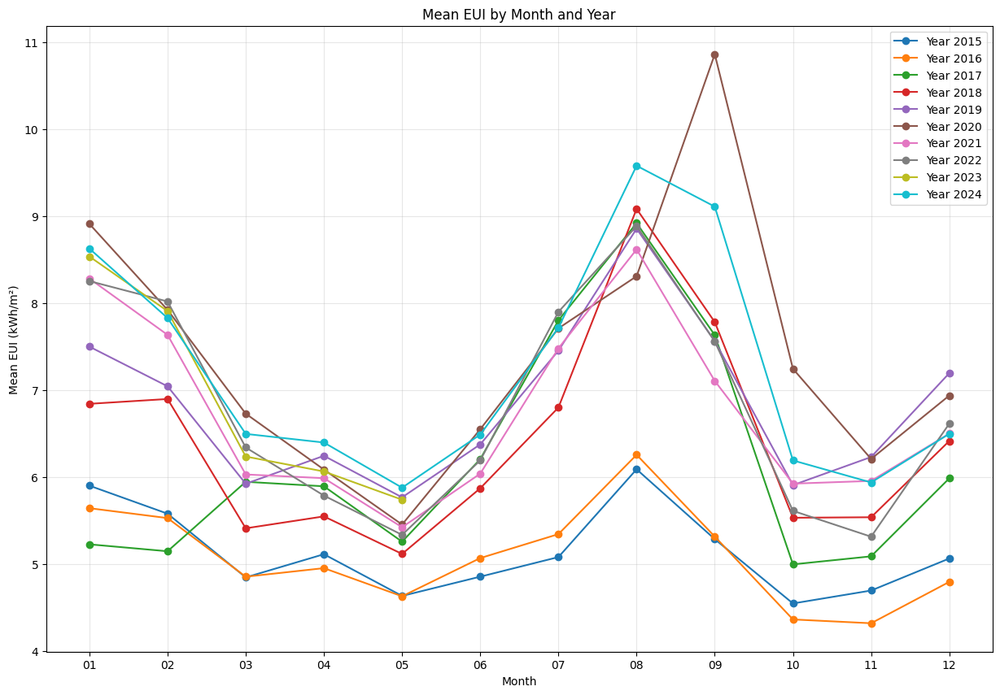

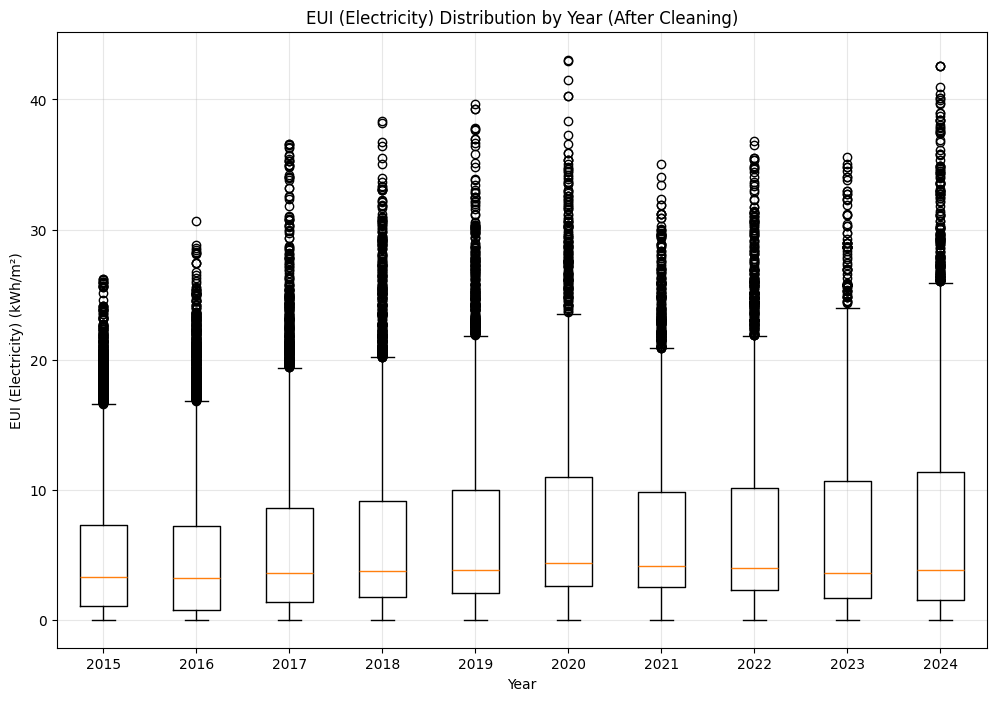

In [129]:
# Create visualization of EUI trends across months
plt.figure(figsize=(15, 10))

# Prepare data for plotting
years = sorted(summary_df['Year'].unique())
colors = plt.cm.tab10(np.linspace(0, 1, len(years)))

for idx, year in enumerate(years):
    year_data = summary_df[summary_df['Year'] == year].sort_values('Month')
    plt.plot(year_data['Month'], year_data['Mean_EUI_electricity'], 
             marker='o', label=f'Year {year}', color=colors[idx])

plt.xlabel('Month')
plt.ylabel('Mean EUI (kWh/m²)')
plt.title('Mean EUI by Month and Year')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Box plot of EUI distribution by year
plt.figure(figsize=(12, 8))
all_eui_data = []
year_labels = []

for year in years:
    year_periods = summary_df[summary_df['Year'] == year]['Period']
    year_eui = []
    
    for period in year_periods:
        if period in cleaned_data_dict:
            year_eui.extend(cleaned_data_dict[period]['EUI_electricity'].values)
    
    if year_eui:
        all_eui_data.append(year_eui)
        year_labels.append(year)

plt.boxplot(all_eui_data, labels=year_labels)
plt.ylabel('EUI (Electricity) (kWh/m²)')
plt.xlabel('Year')
plt.title('EUI (Electricity) Distribution by Year (After Cleaning)')
plt.grid(True, alpha=0.3)
plt.show()

In [130]:
전기에너지_cleaned_202402

,GIS building identification number,Street number,Building footprint (m2),GFA (m2),Height (m),floors,Percentage (%),FSI,GSI,Electricity usage (KWh),geometry,EUI_electricity
2,1988196930024450462100000000,10-0,493.680000,2524.800000,9.0,3,2.641303,2.657088,0.519547,8.608536e+03,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",3.409591
5,2011196830984447496200000000,335-0,443.860000,5074.730000,49.0,16,7.132348,5.940068,0.519547,5.884187e+01,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",0.011595
8,1988196957524451351300000000,10-0,401.160000,6061.200000,9.0,3,6.340886,7.849925,0.519547,2.066621e+04,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",3.409591
9,2004196464214449531300000000,224-1,9461.490000,78965.530000,71.7,4,86.611184,3.425093,0.410388,1.277395e+06,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",16.176621
10,2010196586444449342900000000,332-0,2557.500000,41030.940000,65.4,20,100.000000,9.335185,0.581872,2.007340e+05,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",4.892259
...,...,...,...,...,...,...,...,...,...,...,...,...
2447,1159010500101580001016589,341-1,305.814347,966.173287,12.0,4,2.636661,0.947804,0.300000,1.463874e+02,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",0.151513
2448,1159010500102320055017113,340-0,753.808591,7144.626117,36.0,12,10.753756,1.990388,0.210000,1.178612e+02,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",0.016496
2450,1159010500101580001016575,341-3,620.931035,11279.981342,69.0,23,12.919786,5.449872,0.300000,2.214968e+03,"POLYGON ((1.96e+05 4.45e+05, 1.97e+05 4.45e+05...",0.196363
2451,1159010500101580001016576,341-3,380.204128,6906.878902,69.0,23,7.910953,5.449872,0.300000,1.356254e+03,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",0.196363


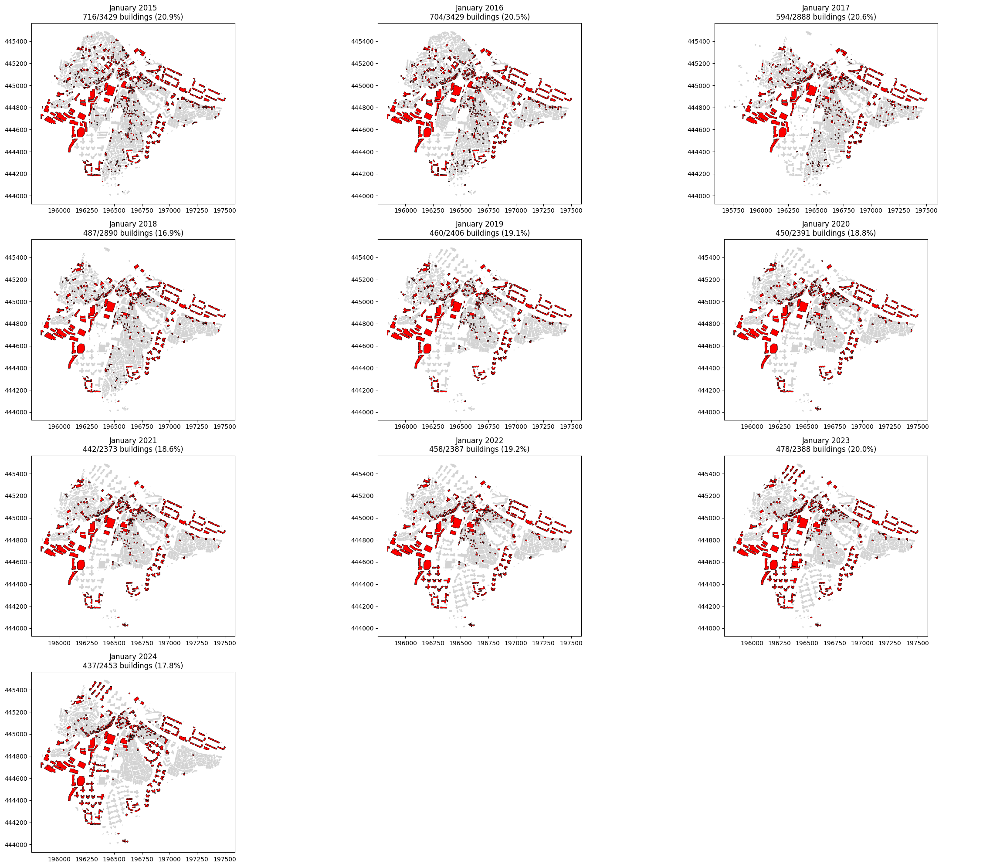

In [131]:
# Calculate overall summary statistics first (across all months and years)
all_buildings_count = 0
all_cleaned_buildings_count = 0
year_months_processed = 0

for year in range(2015, 2025):
    for month in range(1, 13):
        month_str = f"{month:02d}"
        cleaned_var = f'전기에너지_cleaned_{year}{month_str}'
        original_var = f'흑석동_final_{year}'
        
        if cleaned_var in globals() and original_var in globals():
            cleaned_data = globals()[cleaned_var]
            original_data = globals()[original_var]
            
            all_buildings_count += len(original_data)
            all_cleaned_buildings_count += len(cleaned_data)
            year_months_processed += 1

# Calculate average per month (to avoid multiplying by 12 months)
avg_buildings_count = all_buildings_count / year_months_processed if year_months_processed > 0 else 0
avg_cleaned_buildings_count = all_cleaned_buildings_count / year_months_processed if year_months_processed > 0 else 0
overall_coverage_pct = (avg_cleaned_buildings_count / avg_buildings_count * 100) if avg_buildings_count > 0 else 0

# Now collect January data for each year
january_data = {}
january_stats = []

for year in range(2015, 2025):
    # Check if January data exists for this year
    cleaned_var = f'전기에너지_cleaned_{year}01'
    original_var = f'흑석동_final_{year}'
    
    if cleaned_var in globals() and original_var in globals():
        cleaned_data = globals()[cleaned_var]
        original_data = globals()[original_var]
        
        january_data[year] = {
            'cleaned': cleaned_data,
            'original': original_data
        }
        
        # Statistics
        january_stats.append({
            'Year': year,
            'Total_buildings': len(original_data),
            'Buildings_with_clean_data': len(cleaned_data),
            'Coverage_percentage': (len(cleaned_data) / len(original_data)) * 100 if len(original_data) > 0 else 0
        })

# Create plots for each January
fig, axes = plt.subplots(4, 3, figsize=(24, 20))
axes = axes.flatten()

for idx, year in enumerate(range(2015, 2025)):
    ax = axes[idx]
    
    if year in january_data:
        original_data = january_data[year]['original']
        cleaned_data = january_data[year]['cleaned']
        
        # Create a column to identify buildings with cleaned data
        original_data_plot = original_data.copy()
        original_data_plot['has_clean_data'] = original_data_plot['GIS building identification number'].isin(
            cleaned_data['GIS building identification number']
        )
        
        # Plot all buildings in gray
        original_data_plot[~original_data_plot['has_clean_data']].plot(
            ax=ax, color='lightgray', edgecolor='lightgray', linewidth=0.5
        )
        
        # Plot buildings with cleaned data in blue
        original_data_plot[original_data_plot['has_clean_data']].plot(
            ax=ax, color='red', edgecolor='black', linewidth=0.5
        )
        
        # Add title with statistics
        total_buildings = len(original_data)
        buildings_with_data = len(cleaned_data)
        coverage_pct = (buildings_with_data / total_buildings) * 100 if total_buildings > 0 else 0
        
        ax.set_title(f'January {year}\n{buildings_with_data}/{total_buildings} buildings ({coverage_pct:.1f}%)')

# Hide unused subplots
for idx in range(10, 12):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('january_electricity_coverage.png', dpi=300, bbox_inches='tight')
plt.show()

In [132]:
전기에너지_202403

,GIS building identification number,Street number,Building footprint (m2),GFA (m2),Height (m),floors,Percentage (%),FSI,GSI,Electricity usage (KWh),geometry
0,1965196746124450252800000000,50-70,47.570000,87.900000,6.0,2,100.000000,0.887879,0.480505,0.000000,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
1,0000196655954447400800000000,93-101,42.980000,42.980000,3.0,1,100.000000,0.519547,0.519547,0.000000,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
2,1988196930024450462100000000,10-0,493.680000,2524.800000,9.0,3,2.641303,2.657088,0.519547,7307.720538,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
3,2001196345274450858100000000,191-7,107.630000,307.170000,9.0,3,100.000000,1.575231,0.551949,0.000000,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."
4,1994196562364446144900000000,79-20,115.430000,399.650000,10.2,3,100.000000,2.073734,0.598952,0.000000,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05..."
...,...,...,...,...,...,...,...,...,...,...,...
2448,1159010500102320055017113,340-0,753.808591,7144.626117,36.0,12,10.753756,1.990388,0.210000,82.481310,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."
2449,1159010500101730052017713,341-2,226.732719,716.327074,9.0,3,100.000000,0.947804,0.300000,0.000000,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."
2450,1159010500101580001016575,341-3,620.931035,11279.981342,69.0,23,12.919786,5.449872,0.300000,1813.292018,"POLYGON ((1.96e+05 4.45e+05, 1.97e+05 4.45e+05..."
2451,1159010500101580001016576,341-3,380.204128,6906.878902,69.0,23,7.910953,5.449872,0.300000,1110.302225,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05..."


### Gas demand (가스에너지)

In [134]:
가스에너지 = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/가스에너지.xlsx"
가스에너지 = pd.read_excel(가스에너지)

가스에너지.tail(5)

,Unnamed: 0,대지위치,시군구코드,법정동코드,대지구분코드,번,지,사용년월,도로명대지위치,새주소일련번호,새주소도로코드,새주소지상지하코드,새주소본번,새주소부번,사용량(KWh)
76884,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202408,NaN,1,NaN,NaN,NaN,NaN,142
76885,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202409,NaN,1,NaN,NaN,NaN,NaN,142
76886,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202410,NaN,1,NaN,NaN,NaN,NaN,106
76887,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202411,NaN,1,NaN,NaN,NaN,NaN,378
76888,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202412,NaN,1,NaN,NaN,NaN,NaN,1964


In [135]:
가스에너지['Street number'] = 가스에너지.apply(
    lambda row: f"{int(row['번'])}-{int(row['지'])}" if pd.notnull(row['번']) and pd.notnull(row['지']) else None, 
    axis=1)
가스에너지.tail(5)

,Unnamed: 0,대지위치,시군구코드,법정동코드,대지구분코드,번,지,사용년월,도로명대지위치,새주소일련번호,새주소도로코드,새주소지상지하코드,새주소본번,새주소부번,사용량(KWh),Street number
76884,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202408,NaN,1,NaN,NaN,NaN,NaN,142,198-90
76885,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202409,NaN,1,NaN,NaN,NaN,NaN,142,198-90
76886,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202410,NaN,1,NaN,NaN,NaN,NaN,106,198-90
76887,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202411,NaN,1,NaN,NaN,NaN,NaN,378,198-90
76888,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202412,NaN,1,NaN,NaN,NaN,NaN,1964,198-90


In [136]:
# Process gas data for all months and years
if '가스에너지' in globals():
    gas_data = 가스에너지
    
    # First, check what columns we have in the electricity data
    print("Columns in gas data:")
    print(gas_data.columns.tolist())
    
    # Extract year and month from '사용년월'
    gas_data['year'] = gas_data['사용년월'].astype(str).str[:4]
    gas_data['month'] = gas_data['사용년월'].astype(str).str[4:6]
    
    # Only process data from 2015 onwards
    gas_data = gas_data[gas_data['year'].astype(int) >= 2015]
    
    # Get unique year-month combinations
    unique_periods = gas_data['사용년월'].unique()
    
    print(f"Total periods to process: {len(unique_periods)}")
    
    # Process each period
    for period in unique_periods:
        year = str(period)[:4]
        month = str(period)[4:6]
        
        # Get the corresponding final shapefile
        final_var_name = f'흑석동_final_{year}'
        
        if final_var_name in globals():
            building_gdf = globals()[final_var_name].copy()
            
            # Filter gas data for this period
            period_data = gas_data[gas_data['사용년월'] == period].copy()
            
            # Print available columns in period_data
            print(f"\nProcessing {period}")
            print(f"Columns in period_data: {period_data.columns.tolist()}")
            
            # Merge building data with gas data based on Street number
            merged_data = building_gdf.merge(
                period_data,
                left_on='Street number',
                right_on='Street number',
                how='left',
                suffixes=('_building', '_gas')
            )
            
            # Print columns after merge
            print(f"Columns after merge: {merged_data.columns.tolist()}")
            
            # Check if the usage column exists and calculate allocated usage
            if '사용량 (KWh)' in merged_data.columns:
                merged_data['Gas usage (KWh)'] = merged_data['사용량 (KWh)'].fillna(0) * (merged_data['Percentage (%)'] / 100)
            else:
                # If not found, check for similar column names
                usage_columns = [col for col in merged_data.columns if '사용량' in col]
                if usage_columns:
                    print(f"Found usage columns: {usage_columns}")
                    usage_col = usage_columns[0]  # Use the first match
                    merged_data['Gas usage (KWh)'] = merged_data[usage_col].fillna(0) * (merged_data['Percentage (%)'] / 100)
                else:
                    print(f"No usage column found for {period}")
                    merged_data['Gas usage (KWh)'] = 0
            
            # Create final output with available columns
            output_columns = [
                'GIS building identification number',
                'Street number',
                'Building footprint (m2)',
                'GFA (m2)',
                'Height (m)',
                'floors',
                'Percentage (%)',
                '사용량 (KWh)',
                'FSI',
                'GSI',
                'Gas usage (KWh)',
                'geometry'
            ]
            
            # Add the usage column if it exists
            if '사용량 (KWh)' in merged_data.columns:
                output_columns.insert(-2, '사용량 (KWh)')
            
            existing_columns = [col for col in output_columns if col in merged_data.columns]
            output_gdf = merged_data[existing_columns].copy()
            
            # Store in variable
            var_name = f'가스에너지_{period}'
            globals()[var_name] = output_gdf
            
            # Stats for verification
            buildings_matched = output_gdf[output_gdf['Gas usage (KWh)'] > 0].shape[0]
            total_buildings = output_gdf.shape[0]
            
            print(f"{var_name}: {buildings_matched}/{total_buildings} buildings matched ({(buildings_matched/total_buildings)*100:.1f}%)")
            
        else:
            print(f"No shapefile for year {year}, skipping {period}")
    
    print("\nProcessing complete!")

Columns in gas data:
['Unnamed: 0', '대지위치', '시군구코드', '법정동코드', '대지구분코드', '번', '지', '사용년월', '도로명대지위치', '새주소일련번호', '새주소도로코드', '새주소지상지하코드', '새주소본번', '새주소부번', '사용량(KWh)', 'Street number']
Total periods to process: 113

Processing 201501
Columns in period_data: ['Unnamed: 0', '대지위치', '시군구코드', '법정동코드', '대지구분코드', '번', '지', '사용년월', '도로명대지위치', '새주소일련번호', '새주소도로코드', '새주소지상지하코드', '새주소본번', '새주소부번', '사용량(KWh)', 'Street number', 'year', 'month']
Columns after merge: ['Shape ID', 'GIS building identification number', 'Unique number', 'Dong code', 'Street name', 'Street number', 'Special district code', 'Special district name', 'Building use code', 'Building use name', 'Building structure code', 'Building structure name', 'Building footprint (m2)', 'Date of approval for use', 'GFA (m2)', 'Plot area (m2)', 'Height (m)', 'Building to land ratio (%)', 'FAR (%)', 'Building ID', 'Violation?', 'Reference system key', 'Database date', 'geometry', 'Calculated Area', 'floors', 'Height Category', 'Volume (m3)', 

In [137]:
가스에너지

,Unnamed: 0,대지위치,시군구코드,법정동코드,대지구분코드,번,지,사용년월,도로명대지위치,새주소일련번호,새주소도로코드,새주소지상지하코드,새주소본번,새주소부번,사용량(KWh),Street number,year,month
0,0.0,서울특별시 동작구 흑석동,11590,10500,0,0,0,201101,NaN,1,NaN,NaN,NaN,NaN,0,0-0,2011,01
1,1.0,서울특별시 동작구 흑석동,11590,10500,0,0,0,201102,NaN,1,NaN,NaN,NaN,NaN,0,0-0,2011,02
2,2.0,서울특별시 동작구 흑석동,11590,10500,0,0,0,201103,NaN,1,NaN,NaN,NaN,NaN,0,0-0,2011,03
3,3.0,서울특별시 동작구 흑석동,11590,10500,0,0,0,201104,NaN,1,NaN,NaN,NaN,NaN,0,0-0,2011,04
4,4.0,서울특별시 동작구 흑석동,11590,10500,0,0,0,201105,NaN,1,NaN,NaN,NaN,NaN,0,0-0,2011,05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76884,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202408,NaN,1,NaN,NaN,NaN,NaN,142,198-90,2024,08
76885,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202409,NaN,1,NaN,NaN,NaN,NaN,142,198-90,2024,09
76886,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202410,NaN,1,NaN,NaN,NaN,NaN,106,198-90,2024,10
76887,NaN,서울특별시 동작구 흑석동 산198-90,11590,10500,1,198,90,202411,NaN,1,NaN,NaN,NaN,NaN,378,198-90,2024,11


Implement the IQR method for outlier detection for gas usage data

In [139]:
example_month = '202403'  # March 2024 as an example

if f'가스에너지_{example_month}' in globals():
    data = globals()[f'가스에너지_{example_month}'].copy()
    
    # Filter out buildings with zero electricity usage
    data_with_usage = data[data['Gas usage (KWh)'] > 0].copy()
    
    print(f"Total buildings in {example_month}: {len(data)}")
    print(f"Buildings with actual usage: {len(data_with_usage)}")
    print(f"Buildings with zero usage removed: {len(data) - len(data_with_usage)}")

Total buildings in 202403: 2457
Buildings with actual usage: 430
Buildings with zero usage removed: 2027


In [140]:
# Calculate EUI for buildings with usage
if 'data_with_usage' in locals():
    # Calculate EUI (kWh/m²)
    data_with_usage['EUI_gas'] = data_with_usage['Gas usage (KWh)'] / data_with_usage['GFA (m2)']
    
    # Check the distribution
    print(f"\nEUI Statistics for {example_month}:")
    print(f"Mean EUI: {data_with_usage['EUI_gas'].mean():.2f} kWh/m²")
    print(f"Median EUI: {data_with_usage['EUI_gas'].median():.2f} kWh/m²")
    print(f"Min EUI: {data_with_usage['EUI_gas'].min():.2f} kWh/m²")
    print(f"Max EUI: {data_with_usage['EUI_gas'].max():.2f} kWh/m²")


EUI Statistics for 202403:
Mean EUI: 16.29 kWh/m²
Median EUI: 10.90 kWh/m²
Min EUI: 0.08 kWh/m²
Max EUI: 212.80 kWh/m²


In [141]:
# Calculate IQR for EUI
if 'data_with_usage' in locals():
    Q1 = data_with_usage['EUI_gas'].quantile(0.25)
    Q3 = data_with_usage['EUI_gas'].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    print(f"\nIQR Analysis for {example_month}:")
    print(f"Q1 (25th percentile): {Q1:.2f} kWh/m²")
    print(f"Q3 (75th percentile): {Q3:.2f} kWh/m²")
    print(f"IQR: {IQR:.2f} kWh/m²")
    print(f"Lower bound: {lower_bound:.2f} kWh/m²")
    print(f"Upper bound: {upper_bound:.2f} kWh/m²")
    
    # Identify outliers
    outliers = data_with_usage[
        (data_with_usage['EUI_gas'] < lower_bound) | 
        (data_with_usage['EUI_gas'] > upper_bound)
    ]
    
    normal_data = data_with_usage[
        (data_with_usage['EUI_gas'] >= lower_bound) & 
        (data_with_usage['EUI_gas'] <= upper_bound)
    ]
    
    print(f"\nNumber of outliers: {len(outliers)}")
    print(f"Number of normal buildings: {len(normal_data)}")


IQR Analysis for 202403:
Q1 (25th percentile): 6.75 kWh/m²
Q3 (75th percentile): 18.10 kWh/m²
IQR: 11.35 kWh/m²
Lower bound: -10.28 kWh/m²
Upper bound: 35.14 kWh/m²

Number of outliers: 39
Number of normal buildings: 391


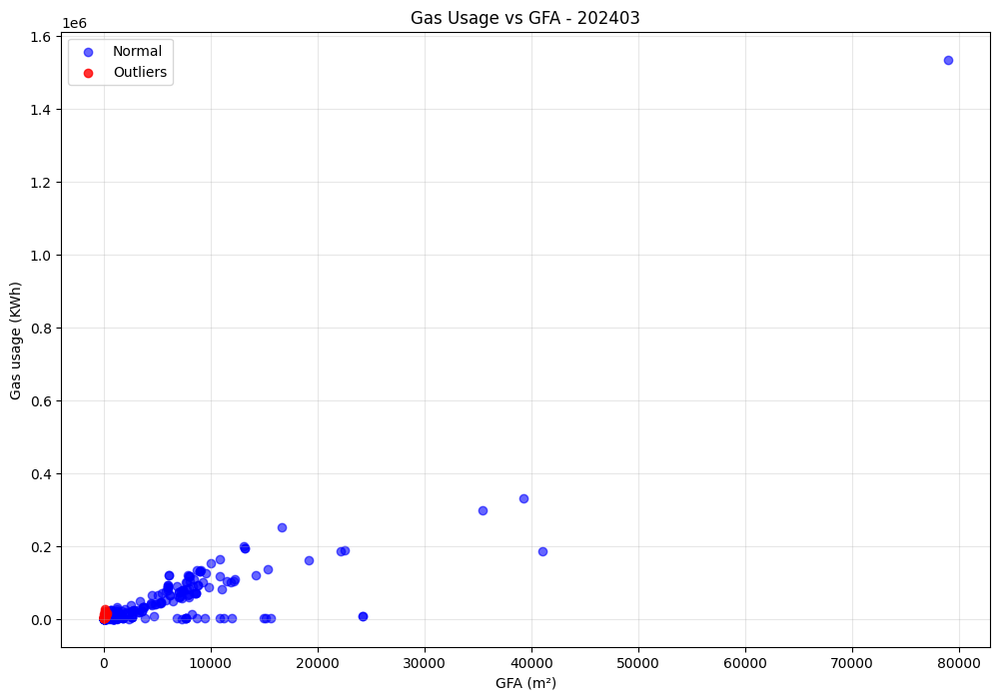

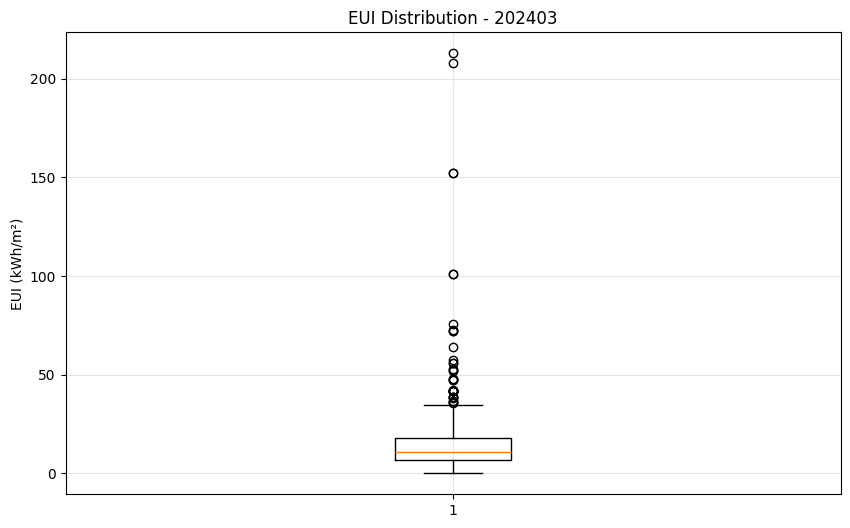

In [142]:
import matplotlib.pyplot as plt

# Create a scatter plot with outliers highlighted
if 'data_with_usage' in locals():
    plt.figure(figsize=(12, 8))
    
    # Plot normal data points
    plt.scatter(normal_data['GFA (m2)'], normal_data['Gas usage (KWh)'], 
               alpha=0.6, color='blue', label='Normal')
    
    # Plot outliers
    plt.scatter(outliers['GFA (m2)'], outliers['Gas usage (KWh)'], 
               alpha=0.8, color='red', label='Outliers')
    
    plt.xlabel('GFA (m²)')
    plt.ylabel('Gas usage (KWh)')
    plt.title(f'Gas Usage vs GFA - {example_month}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Box plot for EUI
    plt.figure(figsize=(10, 6))
    plt.boxplot(data_with_usage['EUI_gas'])
    plt.ylabel('EUI (kWh/m²)')
    plt.title(f'EUI Distribution - {example_month}')
    plt.grid(True, alpha=0.3)
    plt.show()

In [143]:
# Process all months with the IQR method
cleaned_data_dict = {}

# Get all gas data variables
gas_vars = [var for var in globals() if var.startswith('가스에너지_')]

print(f"Found {len(electricity_vars)} gas data files\n")

for var_name in gas_vars:
    period = var_name.split('_')[1]  # Extract YYYYMM
    data = globals()[var_name].copy()
    
    # 1. Filter out zero usage
    data_with_usage = data[data['Gas usage (KWh)'] > 0].copy()
    
    if len(data_with_usage) == 0:
        print(f"No buildings with usage in {period}")
        continue
    
    # 2. Calculate EUI
    data_with_usage['EUI_gas'] = data_with_usage['Gas usage (KWh)'] / data_with_usage['GFA (m2)']
    
    # 3. Calculate IQR boundaries
    Q1 = data_with_usage['EUI_gas'].quantile(0.25)
    Q3 = data_with_usage['EUI_gas'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # 4. Filter outliers
    normal_data = data_with_usage[
        (data_with_usage['EUI_gas'] >= lower_bound) & 
        (data_with_usage['EUI_gas'] <= upper_bound)
    ].copy()
    
    outliers = data_with_usage[
        (data_with_usage['EUI_gas'] < lower_bound) | 
        (data_with_usage['EUI_gas'] > upper_bound)
    ].copy()
    
    # 5. Store cleaned data
    cleaned_data_dict[period] = normal_data
    
    # 6. Statistics
    print(f"{period}:")
    print(f"  Original buildings: {len(data)}")
    print(f"  Buildings with usage: {len(data_with_usage)}")
    print(f"  Outliers removed: {len(outliers)}")
    print(f"  Clean data: {len(normal_data)}")
    print(f"  EUI range: {lower_bound:.2f} to {upper_bound:.2f} kWh/m²")
    print()

Found 113 gas data files

201501:
  Original buildings: 3438
  Buildings with usage: 755
  Outliers removed: 54
  Clean data: 701
  EUI range: -25.12 to 63.88 kWh/m²

201502:
  Original buildings: 3438
  Buildings with usage: 755
  Outliers removed: 61
  Clean data: 694
  EUI range: -20.50 to 52.52 kWh/m²

201503:
  Original buildings: 3438
  Buildings with usage: 759
  Outliers removed: 56
  Clean data: 703
  EUI range: -16.64 to 43.70 kWh/m²

201504:
  Original buildings: 3438
  Buildings with usage: 755
  Outliers removed: 65
  Clean data: 690
  EUI range: -14.01 to 30.85 kWh/m²

201505:
  Original buildings: 3438
  Buildings with usage: 748
  Outliers removed: 92
  Clean data: 656
  EUI range: -6.82 to 15.70 kWh/m²

201506:
  Original buildings: 3438
  Buildings with usage: 740
  Outliers removed: 80
  Clean data: 660
  EUI range: -5.66 to 12.05 kWh/m²

201507:
  Original buildings: 3438
  Buildings with usage: 736
  Outliers removed: 81
  Clean data: 655
  EUI range: -4.47 to 9.29

In [144]:
# Create new variables with cleaned data
for period, clean_data in cleaned_data_dict.items():
    # Check if period is in the expected format (YYYYMM)
    if len(str(period)) == 6 and str(period).isdigit():
        var_name = f'가스에너지_cleaned_{period}'
        globals()[var_name] = clean_data
    else:
        print(f"Skipping invalid period format: {period}")
    
# Create a summary DataFrame
summary_data = []

for period, clean_data in cleaned_data_dict.items():
    # Check if period is in the expected format
    if len(str(period)) != 6 or not str(period).isdigit():
        print(f"Skipping invalid period: {period}")
        continue
        
    original_var = f'가스에너지_{period}'
    
    # Check if original variable exists
    if original_var not in globals():
        print(f"Original variable {original_var} not found, skipping")
        continue
    
    original_data = globals()[original_var]
    
    # Check for EUI column name
    eui_column = 'EUI_gas'
    if 'EUI_gas' in clean_data.columns:
        eui_column = 'EUI_gas'
    
    summary_data.append({
        'Period': period,
        'Year': period[:4],
        'Month': period[4:6],
        'Total_buildings': len(original_data),
        'Buildings_with_usage': len(original_data[original_data['Gas usage (KWh)'] > 0]),
        'Buildings_after_cleaning': len(clean_data),
        'Mean_EUI_gas': clean_data[eui_column].mean(),
        'Median_EUI': clean_data[eui_column].median(),
        'Min_EUI': clean_data[eui_column].min(),
        'Max_EUI': clean_data[eui_column].max()
    })

if summary_data:
    summary_df = pd.DataFrame(summary_data)
    print("Cleaning Summary:")
    print(summary_df)
else:
    print("No valid periods found to create summary")

Cleaning Summary:
     Period  Year Month  Total_buildings  Buildings_with_usage  \
0    201501  2015    01             3438                   755   
1    201502  2015    02             3438                   755   
2    201503  2015    03             3438                   759   
3    201504  2015    04             3438                   755   
4    201505  2015    05             3438                   748   
..      ...   ...   ...              ...                   ...   
108  202408  2024    08             2457                   414   
109  202409  2024    09             2457                   414   
110  202410  2024    10             2457                   413   
111  202411  2024    11             2457                   420   
112  202412  2024    12             2457                   424   

     Buildings_after_cleaning  Mean_EUI_gas  Median_EUI   Min_EUI    Max_EUI  
0                         701     18.236753   15.827668  0.054605  62.454094  
1                         694  

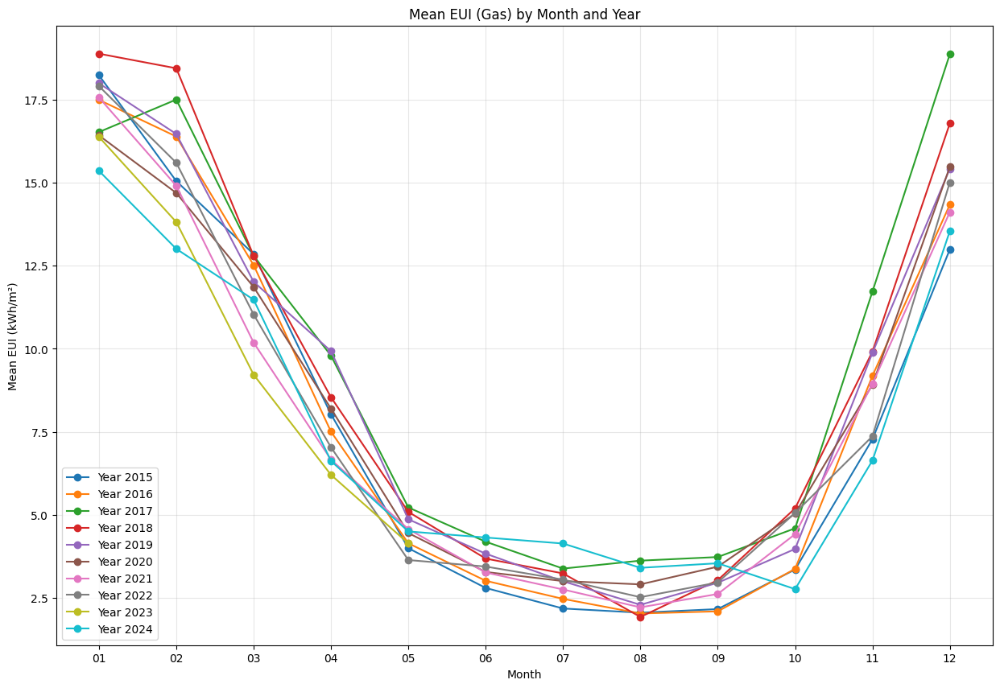

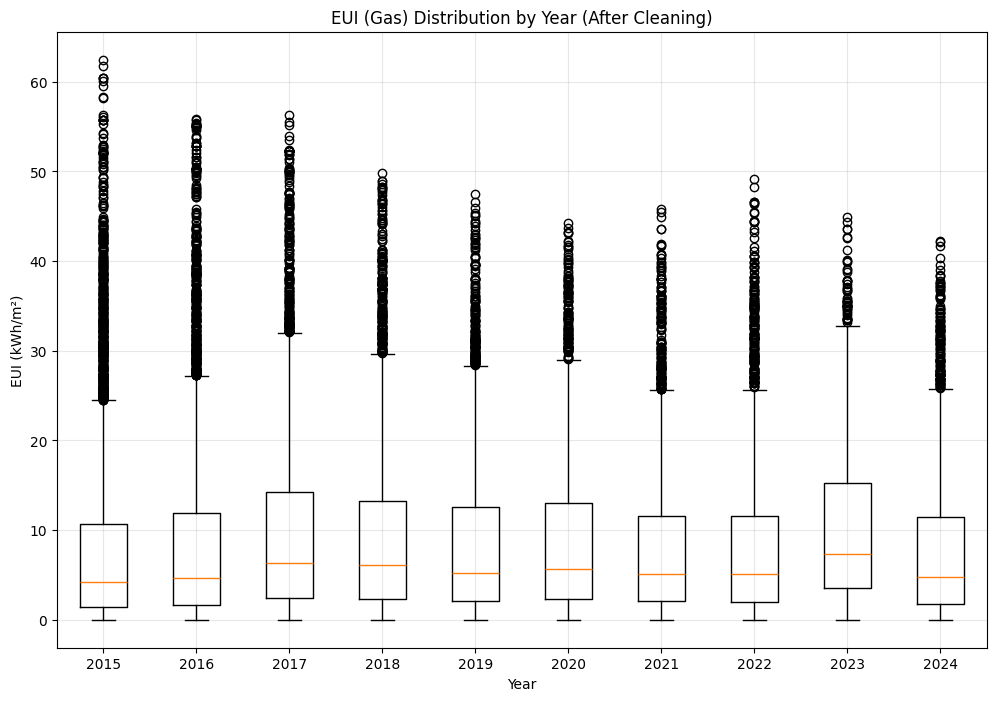

In [145]:
# Create visualization of EUI trends across months
plt.figure(figsize=(15, 10))

# Prepare data for plotting
years = sorted(summary_df['Year'].unique())
colors = plt.cm.tab10(np.linspace(0, 1, len(years)))

for idx, year in enumerate(years):
    year_data = summary_df[summary_df['Year'] == year].sort_values('Month')
    plt.plot(year_data['Month'], year_data['Mean_EUI_gas'], 
             marker='o', label=f'Year {year}', color=colors[idx])

plt.xlabel('Month')
plt.ylabel('Mean EUI (kWh/m²)')
plt.title('Mean EUI (Gas) by Month and Year')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Box plot of EUI distribution by year
plt.figure(figsize=(12, 8))
all_eui_data = []
year_labels = []

for year in years:
    year_periods = summary_df[summary_df['Year'] == year]['Period']
    year_eui = []
    
    for period in year_periods:
        if period in cleaned_data_dict:
            year_eui.extend(cleaned_data_dict[period]['EUI_gas'].values)
    
    if year_eui:
        all_eui_data.append(year_eui)
        year_labels.append(year)

plt.boxplot(all_eui_data, labels=year_labels)
plt.ylabel('EUI (kWh/m²)')
plt.xlabel('Year')
plt.title('EUI (Gas) Distribution by Year (After Cleaning)')
plt.grid(True, alpha=0.3)
plt.show()

In [146]:
가스에너지_cleaned_202402

,GIS building identification number,Street number,Building footprint (m2),GFA (m2),Height (m),floors,Percentage (%),FSI,GSI,Gas usage (KWh),geometry,EUI_gas
2,1988196930024450462100000000,10-0,493.680000,2524.800000,9.0,3,2.641303,2.657088,0.519547,4.767019e+04,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",18.880779
5,2011196830984447496200000000,335-0,443.860000,5074.730000,49.0,16,7.132348,5.940068,0.519547,8.469136e+04,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",16.688840
8,1988196957524451351300000000,10-0,401.160000,6061.200000,9.0,3,6.340886,7.849925,0.519547,1.144402e+05,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",18.880779
9,2004196464214449531300000000,224-1,9461.490000,78965.530000,71.7,4,86.611184,3.425093,0.410388,1.920693e+06,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",24.323184
10,2010196586444449342900000000,332-0,2557.500000,41030.940000,65.4,20,100.000000,9.335185,0.581872,2.655350e+05,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",6.471580
...,...,...,...,...,...,...,...,...,...,...,...,...
2452,1159010500102320055017113,340-0,753.808591,7144.626117,36.0,12,10.753756,1.990388,0.210000,8.069855e+04,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",11.295000
2453,1159010500101730052017713,341-2,226.732719,716.327074,9.0,3,100.000000,0.947804,0.300000,5.297000e+03,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",7.394667
2454,1159010500101580001016575,341-3,620.931035,11279.981342,69.0,23,12.919786,5.449872,0.300000,1.451667e+03,"POLYGON ((1.96e+05 4.45e+05, 1.97e+05 4.45e+05...",0.128694
2455,1159010500101580001016576,341-3,380.204128,6906.878902,69.0,23,7.910953,5.449872,0.300000,8.888747e+02,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",0.128694


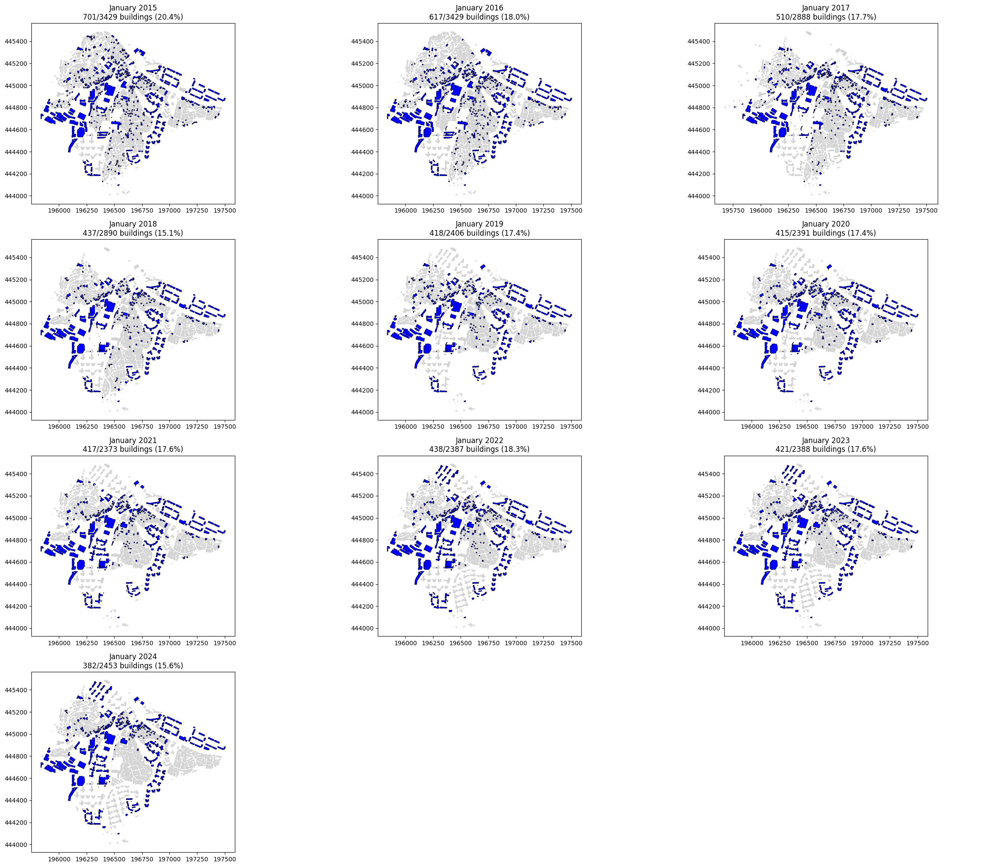

In [147]:
# Calculate overall summary statistics first (across all months and years)
all_buildings_count = 0
all_cleaned_buildings_count = 0
year_months_processed = 0

for year in range(2015, 2025):
    for month in range(1, 13):
        month_str = f"{month:02d}"
        cleaned_var = f'가스에너지_cleaned_{year}{month_str}'
        original_var = f'흑석동_final_{year}'
        
        if cleaned_var in globals() and original_var in globals():
            cleaned_data = globals()[cleaned_var]
            original_data = globals()[original_var]
            
            all_buildings_count += len(original_data)
            all_cleaned_buildings_count += len(cleaned_data)
            year_months_processed += 1

# Calculate average per month (to avoid multiplying by 12 months)
avg_buildings_count = all_buildings_count / year_months_processed if year_months_processed > 0 else 0
avg_cleaned_buildings_count = all_cleaned_buildings_count / year_months_processed if year_months_processed > 0 else 0
overall_coverage_pct = (avg_cleaned_buildings_count / avg_buildings_count * 100) if avg_buildings_count > 0 else 0

# Now collect January data for each year
january_data = {}
january_stats = []

for year in range(2015, 2025):
    # Check if January data exists for this year
    cleaned_var = f'가스에너지_cleaned_{year}01'
    original_var = f'흑석동_final_{year}'
    
    if cleaned_var in globals() and original_var in globals():
        cleaned_data = globals()[cleaned_var]
        original_data = globals()[original_var]
        
        january_data[year] = {
            'cleaned': cleaned_data,
            'original': original_data
        }
        
        # Statistics
        january_stats.append({
            'Year': year,
            'Total_buildings': len(original_data),
            'Buildings_with_clean_data': len(cleaned_data),
            'Coverage_percentage': (len(cleaned_data) / len(original_data)) * 100 if len(original_data) > 0 else 0
        })

# Create plots for each January
fig, axes = plt.subplots(4, 3, figsize=(24, 20))
axes = axes.flatten()

for idx, year in enumerate(range(2015, 2025)):
    ax = axes[idx]
    
    if year in january_data:
        original_data = january_data[year]['original']
        cleaned_data = january_data[year]['cleaned']
        
        # Create a column to identify buildings with cleaned data
        original_data_plot = original_data.copy()
        original_data_plot['has_clean_data'] = original_data_plot['GIS building identification number'].isin(
            cleaned_data['GIS building identification number']
        )
        
        # Plot all buildings in gray
        original_data_plot[~original_data_plot['has_clean_data']].plot(
            ax=ax, color='lightgray', edgecolor='lightgray', linewidth=0.5
        )
        
        # Plot buildings with cleaned data in blue
        original_data_plot[original_data_plot['has_clean_data']].plot(
            ax=ax, color='blue', edgecolor='black', linewidth=0.5
        )
        
        # Add title with statistics
        total_buildings = len(original_data)
        buildings_with_data = len(cleaned_data)
        coverage_pct = (buildings_with_data / total_buildings) * 100 if total_buildings > 0 else 0
        
        ax.set_title(f'January {year}\n{buildings_with_data}/{total_buildings} buildings ({coverage_pct:.1f}%)')

# Hide unused subplots
for idx in range(10, 12):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('january_gas_coverage.png', dpi=300, bbox_inches='tight')
plt.show()

In [166]:
electricity_folder = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지"
gas_folder = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/가스에너지"

# Create folders if they don't exist
for folder in [electricity_folder, gas_folder]:
    if not os.path.exists(folder):
        os.makedirs(folder)
        print(f"Created folder: {folder}")

# Find and save all electricity data
electricity_files = 0
for var_name in list(globals().keys()):
    if var_name.startswith('전기에너지_cleaned_') and len(var_name) > 15:
        # Extract period from variable name
        period = var_name.split('_')[-1]
        
        # Skip if period is not in YYYYMM format
        if not (len(period) == 6 and period.isdigit()):
            print(f"Skipping {var_name}: Invalid period format")
            continue
        
        try:
            # Save to CSV
            data = globals()[var_name]
            output_file = os.path.join(electricity_folder, f"electricity_{period}.csv")
            
            # Drop geometry column if it exists to save as CSV
            if 'geometry' in data.columns:
                data = data.drop(columns=['geometry'])
            
            data.to_csv(output_file, index=False, encoding='utf-8')
            print(f"Saved {var_name} to {output_file}")
            electricity_files += 1
        except Exception as e:
            print(f"Error saving {var_name}: {e}")

# Find and save all gas data
gas_files = 0
for var_name in list(globals().keys()):
    if var_name.startswith('가스에너지_cleaned_') and len(var_name) > 15:
        # Extract period from variable name
        period = var_name.split('_')[-1]
        
        # Skip if period is not in YYYYMM format
        if not (len(period) == 6 and period.isdigit()):
            print(f"Skipping {var_name}: Invalid period format")
            continue
        
        try:
            # Save to CSV
            data = globals()[var_name]
            output_file = os.path.join(gas_folder, f"gas_{period}.csv")
            
            # Drop geometry column if it exists to save as CSV
            if 'geometry' in data.columns:
                data = data.drop(columns=['geometry'])
            
            data.to_csv(output_file, index=False, encoding='utf-8')
            print(f"Saved {var_name} to {output_file}")
            gas_files += 1
        except Exception as e:
            print(f"Error saving {var_name}: {e}")

# Print summary
print("\nSummary:")
print(f"Saved {electricity_files} electricity data files to {electricity_folder}")
print(f"Saved {gas_files} gas data files to {gas_folder}")

# List saved files
print("\nElectricity files:")
for file in sorted(os.listdir(electricity_folder)):
    if file.startswith('electricity_') and file.endswith('.csv'):
        print(f"  {file}")

print("\nGas files:")
for file in sorted(os.listdir(gas_folder)):
    if file.startswith('gas_') and file.endswith('.csv'):
        print(f"  {file}")

Saved 전기에너지_cleaned_201501 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electricity_201501.csv
Saved 전기에너지_cleaned_201502 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electricity_201502.csv
Saved 전기에너지_cleaned_201503 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electricity_201503.csv
Saved 전기에너지_cleaned_201504 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electricity_201504.csv
Saved 전기에너지_cleaned_201505 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electricity_201505.csv
Saved 전기에너지_cleaned_201506 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electricity_201506.csv
Saved 전기에너지_cleaned_201507 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electricity_201507.csv
Saved 전기에너지_cleaned_201508 to /Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/전기에너지/electri

## New Research Area

In [149]:
import os
import rasterio
import geopandas as gpd
from rasterio.mask import mask
from shapely.geometry import mapping
import numpy as np

In [150]:
airtemp_folder = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/1st MLP/air_temp_maps"  # Path to air temperature raster files
ndvi_folder = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/GEE/NDVI"  # Path to NDVI raster files
shapefile_path = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/New shape.shp"  # Path to your research area shapefile
output_airtemp_folder = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/New research area/AT distribution"
output_ndvi_folder = "/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/New research area/NDVI"

In [151]:
research_area = gpd.read_file(shapefile_path)
research_area_geom = [mapping(geom) for geom in research_area.geometry]
research_area_shape = research_area.geometry[0]

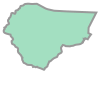

In [152]:
research_area_shape

In [153]:
clip_threshold = 0.3  # 30% coverage threshold

Clipping Air temperature raster files with new area

In [155]:
airtemp_files = [f for f in os.listdir(airtemp_folder) if f.startswith("AirTemp_") and f.endswith(".tif")]
for airtemp_file in airtemp_files:
    input_path = os.path.join(airtemp_folder, airtemp_file)
    output_path = os.path.join(output_airtemp_folder, f"clipped_{airtemp_file}")
    
    # Open raster file
    with rasterio.open(input_path) as src:
        # Read the data
        data = src.read(1)  # Assuming single band raster
        transform = src.transform
        nodata = src.nodata if src.nodata is not None else -9999
        
        # Create a mask to track pixels to keep (initially all False)
        pixel_mask = np.zeros_like(data, dtype=bool)
        
        # Get the pixel size
        pixel_width = transform[0]
        pixel_height = -transform[4]  # Height is negative in the transform
        
        # Iterate through the raster
        for i in range(src.height):
            for j in range(src.width):
                # Skip if already nodata
                if data[i, j] == nodata:
                    continue
                    
                # Get the bounds of the pixel
                x_min = transform[2] + j * transform[0]
                y_max = transform[5] + i * transform[4]
                x_max = x_min + pixel_width
                y_min = y_max - pixel_height
                
                # Create a polygon for the pixel
                pixel_poly = box(x_min, y_min, x_max, y_max)
                
                # Check if pixel intersects with research area
                if pixel_poly.intersects(research_area_shape):
                    # Calculate the area of intersection
                    intersection = pixel_poly.intersection(research_area_shape)
                    if intersection.area / pixel_poly.area >= clip_threshold:
                        pixel_mask[i, j] = True
                    else:
                        # Set pixels with less than 30% coverage to nodata
                        data[i, j] = nodata
                else:
                    # Set pixels outside research area to nodata
                    data[i, j] = nodata
        
        # Check if there are any pixels to keep
        if np.any(pixel_mask):
            # Update the data with the filtered values
            out_meta = src.meta.copy()
            
            # Clip the raster to the bounding box of remaining pixels
            rows, cols = np.where(pixel_mask)
            if len(rows) > 0 and len(cols) > 0:
                row_min, row_max = np.min(rows), np.max(rows)
                col_min, col_max = np.min(cols), np.max(cols)
                
                # New dimensions
                new_height = row_max - row_min + 1
                new_width = col_max - col_min + 1
                
                # Update the transform for the clipped raster
                new_transform = rasterio.transform.from_origin(
                    transform[2] + col_min * transform[0],
                    transform[5] + row_min * transform[4],
                    transform[0],
                    -transform[4]
                )
                
                # Extract the clipped data
                clipped_data = data[row_min:row_max+1, col_min:col_max+1]
                
                # Update metadata
                out_meta.update({
                    "driver": "GTiff",
                    "height": new_height,
                    "width": new_width,
                    "transform": new_transform,
                    "nodata": nodata
                })
                
                # Write the output
                with rasterio.open(output_path, "w", **out_meta) as dest:
                    dest.write(clipped_data, 1)
                
                print(f"Processed {airtemp_file} - Pixels retained: {np.sum(pixel_mask)}")
            else:
                print(f"No pixels met the threshold for {airtemp_file}")
        else:
            print(f"No pixels met the threshold for {airtemp_file}")

NameError: name 'box' is not defined

In [ ]:
ndvi_files = [f for f in os.listdir(ndvi_folder) if f.startswith("NDVI_") and f.endswith(".tif")]
for ndvi_file in ndvi_files:
    input_path = os.path.join(ndvi_folder, ndvi_file)
    output_path = os.path.join(output_ndvi_folder, f"clipped_{ndvi_file}")
    
    # Open raster file
    with rasterio.open(input_path) as src:
        # Calculate the intersection
        pixels_count = 0
        included_pixels = 0
        
        # Get the pixel size
        transform = src.transform
        pixel_width = transform[0]
        pixel_height = -transform[4]  # Height is negative in the transform
        
        # Iterate through the raster
        for i in range(src.height):
            for j in range(src.width):
                # Get the bounds of the pixel
                x_min = transform[2] + j * transform[0]
                y_max = transform[5] + i * transform[4]
                x_max = x_min + pixel_width
                y_min = y_max - pixel_height
                
                # Create a polygon for the pixel
                from shapely.geometry import box
                pixel_poly = box(x_min, y_min, x_max, y_max)
                
                # Check if pixel intersects with research area
                if pixel_poly.intersects(research_area_shape):
                    pixels_count += 1
                    
                    # Calculate the area of intersection
                    intersection = pixel_poly.intersection(research_area_shape)
                    if intersection.area / pixel_poly.area >= clip_threshold:
                        included_pixels += 1
        
        # If there are included pixels, perform the clipping
        if included_pixels > 0:
            out_image, out_transform = mask(src, research_area_geom, crop=True)
            
            # Create the output raster
            out_meta = src.meta.copy()
            out_meta.update({
                "driver": "GTiff",
                "height": out_image.shape[1],
                "width": out_image.shape[2],
                "transform": out_transform
            })
            
            with rasterio.open(output_path, "w", **out_meta) as dest:
                dest.write(out_image)
            
            print(f"Processed {ndvi_file} - {included_pixels} pixels included")

print("All raster files have been processed successfully!")

## Final Urban form element for 2nd MLP

In [ ]:
final_2015 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2015.shp")
final_2016 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2016.shp")
final_2017 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2017.shp")
final_2018 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2018.shp")
final_2019 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2019.shp")
final_2020 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2020.shp")
final_2021 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2021.shp")
final_2022 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2022.shp")
final_2023 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2023.shp")
final_2024 = gpd.read_file("/Users/geunchansong/Documents/TU:d/Year 2/Graduation Thesis/UFE/Final/흑석동_final_2024.shp")

In [ ]:
final_2015

In [162]:
가스에너지_cleaned_202403

,GIS building identification number,Street number,Building footprint (m2),GFA (m2),Height (m),floors,Percentage (%),FSI,GSI,Gas usage (KWh),geometry,EUI_gas
2,1988196930024450462100000000,10-0,493.680000,2524.800000,9.0,3,2.641303,2.657088,0.519547,3.824959e+04,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",15.149551
5,2011196830984447496200000000,335-0,443.860000,5074.730000,49.0,16,7.132348,5.940068,0.519547,6.561318e+04,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",12.929394
8,1988196957524451351300000000,10-0,401.160000,6061.200000,9.0,3,6.340886,7.849925,0.519547,9.182446e+04,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",15.149551
9,2004196464214449531300000000,224-1,9461.490000,78965.530000,71.7,4,86.611184,3.425093,0.410388,1.535830e+06,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",19.449375
10,2010196586444449342900000000,332-0,2557.500000,41030.940000,65.4,20,100.000000,9.335185,0.581872,1.847810e+05,"POLYGON ((1.97e+05 4.45e+05, 1.97e+05 4.45e+05...",4.503455
...,...,...,...,...,...,...,...,...,...,...,...,...
2452,1159010500102320055017113,340-0,753.808591,7144.626117,36.0,12,10.753756,1.990388,0.210000,6.327800e+04,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",8.856727
2453,1159010500101730052017713,341-2,226.732719,716.327074,9.0,3,100.000000,0.947804,0.300000,4.491000e+03,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",6.269482
2454,1159010500101580001016575,341-3,620.931035,11279.981342,69.0,23,12.919786,5.449872,0.300000,1.189783e+03,"POLYGON ((1.96e+05 4.45e+05, 1.97e+05 4.45e+05...",0.105477
2455,1159010500101580001016576,341-3,380.204128,6906.878902,69.0,23,7.910953,5.449872,0.300000,7.285196e+02,"POLYGON ((1.96e+05 4.45e+05, 1.96e+05 4.45e+05...",0.105477
